<a id="title"></a>
# Relatório: Simulação Multifísica de um Sistema Microfluídico Acoplado

#### Disciplina: SME0602 — Motores Numéricos para Simulação em Engenharia
#### Professor: Roberto F. Ausas
#### Grupo 3: 
* Beatriz Cosimatti - 17024130
* Cecilia Queiroz - 16817870
* Gabriel Zago - 16811453
* Matheus Buzzon - 16827610
* Pedro Vale - 16895902
* Victor Silva - 17076160

<a id="sumario"></a>
## Sumário

- [Introdução](#introducao)
- [Capítulo 1: A Rede Hidráulica](#cap1)
- [Capítulo 2: A Placa Térmica](#cap2)
- [Capítulo 3: Membrana Elástica](#cap3)
- [Capítulo 4: Simulação do Acoplamento Hidráulico-Térmico](#cap4)
- [Capítulo 5: Simulação do Acoplamento Hidráulico-Mecânico](#cap5)
- [Capítulo 6: O Gêmeo Digital](#cap6)
- [Conclusão](#conclusao)



<a id="introducao"></a>
## Introdução

Este relatório apresenta o desenvolvimento e a validação de um modelo computacional multifísico para um sistema microfluídico composto por três subsistemas fundamentais: uma **rede hidráulica** de microcanais, uma **placa térmica** e uma **membrana elástica** que atua como tampa flexível de um reservatório de expansão. Cada subsistema é inicialmente formulado e resolvido de forma independente, com base em fundamentos teóricos próprios e validado numericamente por meio de estudos de convergência de malha e comparação com o comportamento físico esperado.

A partir dessas formulações isoladas, o relatório avança para o estudo dos **acoplamentos físicos** entre os subsistemas: primeiro a interação entre o escoamento hidráulico e o campo de temperaturas da placa, e em seguida o acoplamento monolítico entre a rede hidráulica e a resposta dinâmica da membrana elástica, resolvido por integração temporal implícita. Por fim, os três subsistemas são reunidos em um **gêmeo digital** do sistema completo, empregado para estimar a probabilidade de falha do sistema por meio de simulações de Monte Carlo, aproximar o comportamento da potência consumida por técnicas de interpolação e regressão, e conduzir uma análise de sensibilidade que permite otimizar parâmetros de projeto sob restrições de desempenho.


<a id="cap1"></a>
## Capítulo 1: A Rede Hidráulica
---

Este relatório cobre a modelagem e simulação de redes de microcanais hidráulicos utilizando o método dos elementos de rede (grafos).No caso de sistemas microfluídicos contendo fluidos Newtonianos.


Os fundamentos teóricos da modelagem hidráulica baseiam-se na lei constitutiva para escoamento laminar em tubos circulares, que relaciona a vazão volumétrica $Q$ à diferença de pressão $\Delta P$ por meio da condutância 
$ C_k = \frac{\pi D_h^4}{128\, \mu\, L}, $ 
onde $D_h = \sqrt{4A/\pi}$ é o diâmetro hidráulico calculado a partir da área da seção transversal $A$ e $\mu$ é a viscosidade dinâmica do fluido. As condições de contorno são aplicadas de duas formas: nos nós com pressão conhecida, substitui-se a linha correspondente do sistema por $1 \cdot p_i = p_{\text{ref}}$; nos nós com vazão imposta, o valor $Q_{\text{in}}$ é inserido diretamente no vetor de fontes $b_i$. Após a obtenção do campo de pressões, as vazões em cada canal são determinadas por 
$\mathbf{Q} = \mathbf{K}\, \mathbf{D}\, \mathbf{p},$ 
e a potência dissipada na rede é calculada como 
$W = \mathbf{p}^T \mathbf{D}^T \mathbf{Q},$
em que $\mathbf{K}$ é a matriz diagonal das condutâncias dos canais e $\mathbf{D}$ é a matriz de incidência nó-aresta do grafo.

Os parâmetros de configuração da simulação estão centralizados no dicionário CONFIG_H, definido no arquivo env.py, o que permite alterar as condições de contorno sem modificar as classes de simulação. Entre os principais parâmetros, destacam-se: o índice do nó de entrada (N_INLET = 0), a vazão de entrada padrão (INLET_FLOW = 1×10⁻⁷ m³/s), o índice do nó de saída (N_OUTLET = 5), cuja pressão de referência é fixada em OUTLET = 0 Pa, a área da seção transversal dos canais (PIPE_AREA = 2,5×10⁻⁷ m²) e a viscosidade dinâmica do fluido (VISCOSITY = 0,001 Pa·s), valor típico da água a aproximadamente 20 °C.

---
<a id="cap1-1"></a>
### Geração da Topologia da Rede (`GeraGrafo`)

Rede gerada:
  Nós   : 224
  Canais: 327


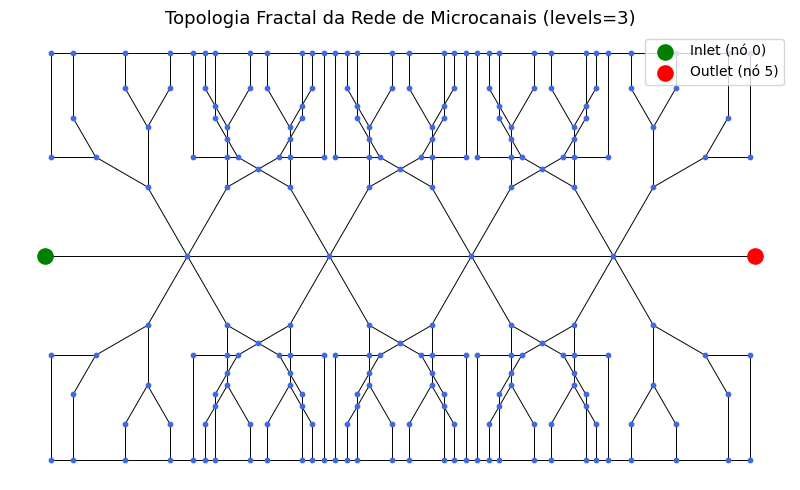

In [3]:
# ---- Geração e visualização da rede (levels=3) ----
Xno, conec = data_structures.GeraGrafo(levels=3)
Xno_m = Xno * 0.001   # converte de mm para metros

print(f'Rede gerada:')
print(f'  Nós   : {Xno.shape[0]}')
print(f'  Canais: {conec.shape[0]}')

fig, ax = plt.subplots(figsize=(14, 5))
for (i, j) in conec:
    ax.plot([Xno[i, 0], Xno[j, 0]], [Xno[i, 1], Xno[j, 1]],
            'k-', linewidth=0.7, zorder=1)
ax.scatter(Xno[:, 0], Xno[:, 1], s=10, color='royalblue', zorder=2)
ax.scatter(Xno[config_h['N_INLET'], 0], Xno[config_h['N_INLET'], 1],
           s=120, color='green', zorder=3, label=f'Inlet (nó {config_h["N_INLET"]})')
ax.scatter(Xno[config_h['N_OUTLET'], 0], Xno[config_h['N_OUTLET'], 1],
           s=120, color='red', zorder=3, label=f'Outlet (nó {config_h["N_OUTLET"]})')
ax.set_aspect('equal'); ax.axis('off')
ax.set_title('Topologia Fractal da Rede de Microcanais (levels=3)', fontsize=13)
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

---
<a id="cap1-2"></a>
### Classe Base `Hydraulics`

A classe encapsula os três passos fundamentais do método:

```
calculate_conductancy()   ──►   assembly()   ──►   solve_network()   ──►   calculate_flow_rate_and_potency()
     C_k (por canal)/pressões p/vazões Q, potência W
```
<a id="cap1-3"></a>
#### Cálculo das Condutâncias

Para cada canal $k$ conectando nós $i$ e $j$:

$C_k = \frac{\pi D_h^4}{128\, \mu\, L_k}, \qquad L_k = \|\mathbf{x}_i - \mathbf{x}_j\|$
<a id="cap1-4"></a>
#### Aplicação das Condições de Contorno e Solução

Linha do nó `outlet` é substituída por $[0 \ldots 1 \ldots 0]\,\mathbf{p} = p_{\text{ref}}$;  
o sistema resultante é resolvido por `numpy.linalg.solve` (eliminação LU densa).

=== Hydraulics ===
  p_max = 4.3792e+02 Pa
  W     = 4.3792e-05 W


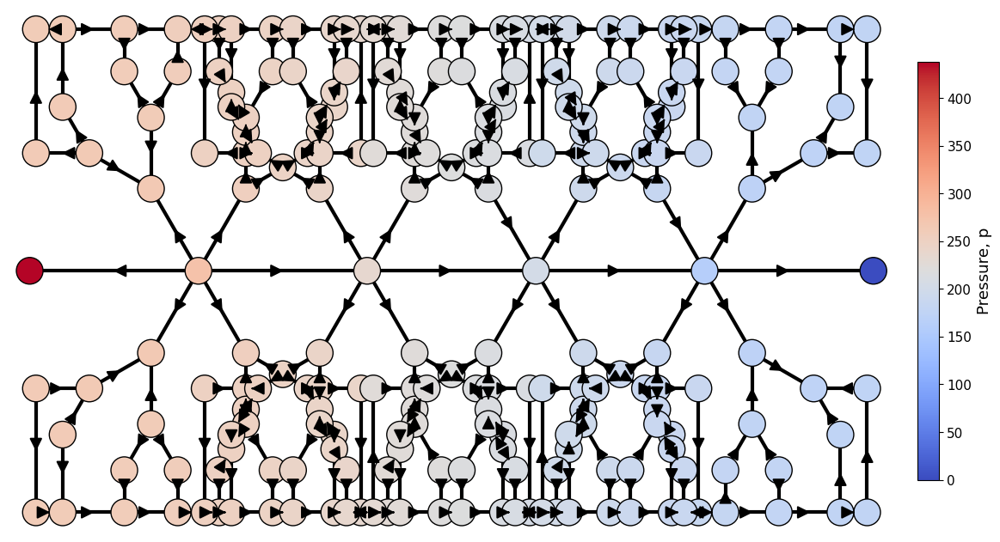

In [4]:
solver_base = hydraulics.Hydraulics(conec, Xno_m, config_h)
solver_base.run(print_info=True, plot=True)

O Problema 1 trata de múltiplas entradas de vazão,A modificação consiste em alterar o vetor de fontes `b` para receber várias vazões simultâneas, cada uma indexada a um nó diferente, de acordo com `b_i = Q_in,i` para todo `i` pertencente ao dicionário de vazões de entrada. A montagem da matriz `Ã` permanece idêntica à do caso base, mudando-se unicamente a construção do vetor de fontes.

=== Hydraulics_p1 ===
Nós de injeção (INLET_FLOW_DICT): {0: 1e-07, 175: 1e-06}
p_max = 3.9795e+03 Pa
W     = 4.2847e-03 W


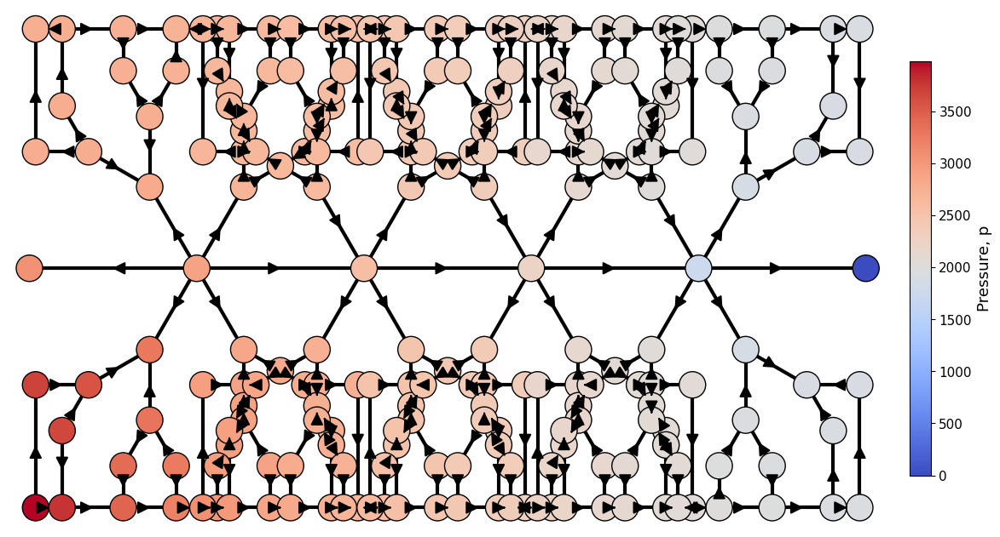

In [5]:
solver_p1 = hydraulics.Hydraulics_p1(conec, Xno_m, config_h)
solver_p1.run(print_info=True, plot=True)

O Problema 2 trata de múltiplas entradas de pressão, onde a principal modificação consiste em aplicar condições de Dirichlet nos nós com pressão prescrita. Para cada um desses nós, a linha correspondente na matriz `Ã` é substituída por uma equação que impõe diretamente o valor da pressão: o elemento diagonal `A_ii` recebe 1, todos os elementos fora da diagonal (`A_ij` para `j ≠ i`) são zerados, e o termo independente `b_i` recebe a pressão `p_i` especificada.

=== Hydraulics_p2 ===
  Pressões prescritas: {'0': 1e-07, '175': 1e-06}
  p_max = 1.0000e-06 Pa
  W     = 2.8233e-22 W


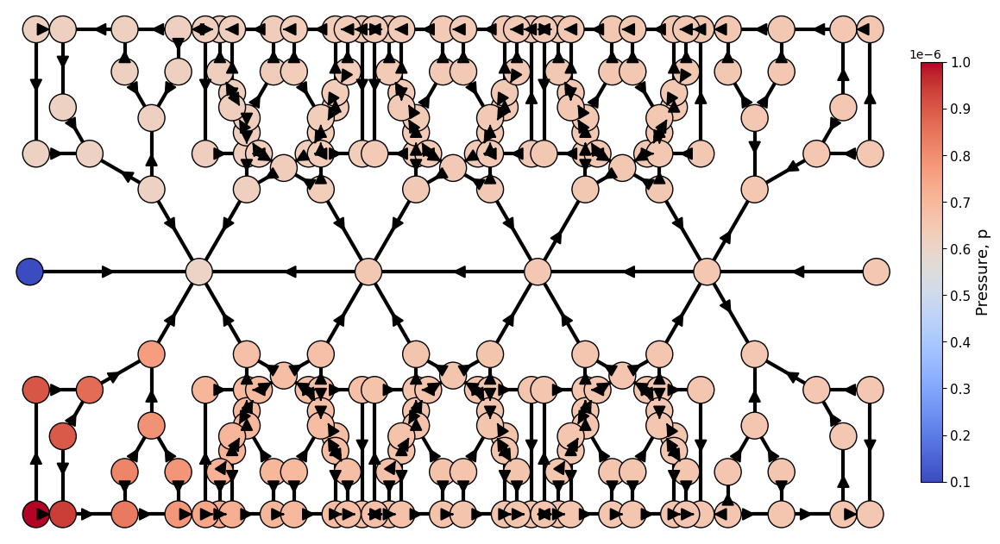

In [6]:
solver_p2 = hydraulics.Hydraulics_p2(conec, Xno_m, config_h)
solver_p2.run(print_info=True, plot=True)

O Problema 3 aborda a imposição de pressão na entrada, com o objetivo de calcular a vazão resultante de uma diferença de pressão fixada entre o inlet e o outlet. Para isso, tanto a entrada quanto a saída recebem condições de contorno de Dirichlet para a pressão, de modo que o sistema linear resolve diretamente o campo de pressões. A vazão de entrada `Q_in` é então recuperada posteriormente, utilizando a linha original da matriz,antes de ser zerada para aplicação da condição de contorno,por meio do produto interno `Q_in = a_inlet^T · p`.

=== Hydraulics_p3 ===
  Δp = 100.00 Pa
  Q_inlet calculado = 2.2835e-08 m³/s
  W = 2.2835e-06 W


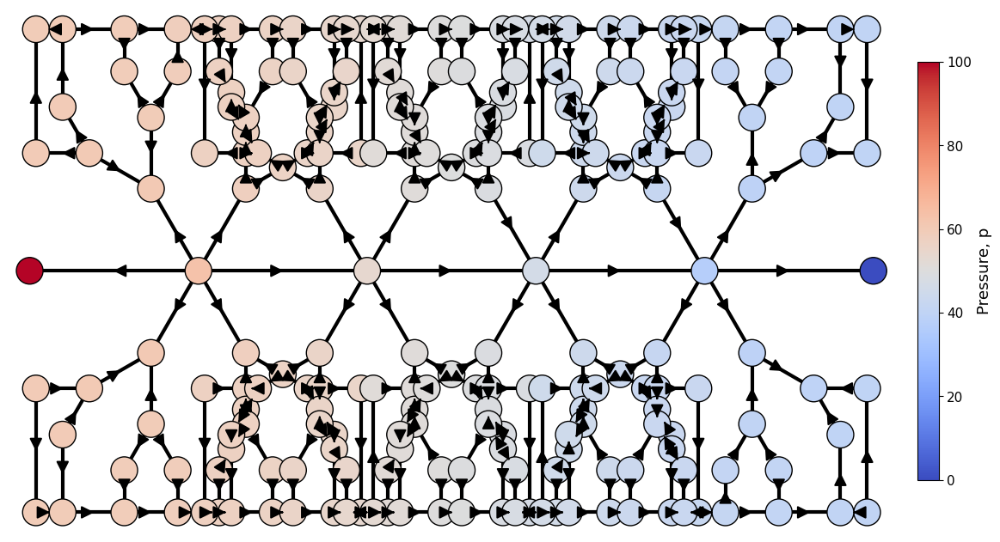

In [7]:
solver_p3 = hydraulics.Hydraulics_p3(conec, Xno_m, config_h)
solver_p3.run(print_info=True, plot=True)

O Problema 4 trata de uma vazão senoidal no tempo, descrita por `Q(t) = A sin(ω t + θ) + B`, onde uma componente oscilatória senoidal se sobrepõe a um valor constante. A estratégia de solução explora a superposição linear, já que o sistema `Ã p = Q` é linear e invariante no tempo. Dessa forma, é necessário resolver o sistema apenas duas vezes: uma para obter o campo de pressões `p_sin` correspondente a uma amplitude unitária senoidal (`Q = 1` mL/s) e outra para obter `p_const` associada ao termo constante `Q = B` mL/s. A pressão em qualquer instante `t` é então calculada diretamente pela combinação `p(t) = A sin(ω t + θ) · p_sin + p_const`, evitando a resolução do sistema linear a cada passo de tempo e proporcionando um grande ganho de eficiência computacional.

=== Hydraulics_p4 ===
  p_max global = 4.8172e+03 Pa
  p_min global = 3.9413e+03 Pa


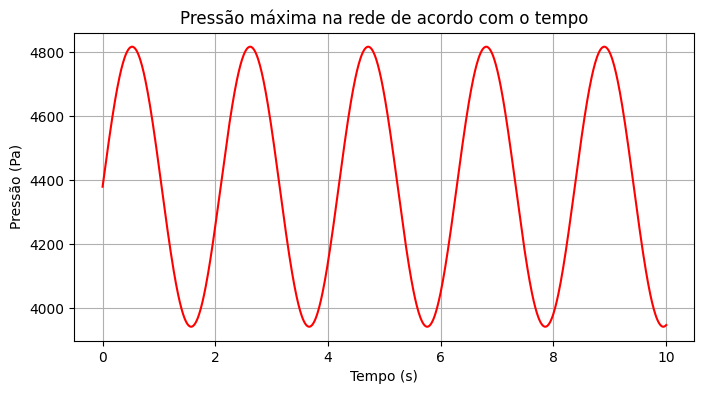

In [8]:
solver_p4 = hydraulics.Hydraulics_p4(conec, Xno_m, config_h)
solver_p4.run(print_info=True, plot=True)

O Problema 5 aborda a superposição de excitações seno e cosseno, há presença de dois inlets independentes com comportamentos oscilatórios distintos. No nó 0, a vazão é descrita por `Q1(t) = A1 sin(ω1 t + θ1) + B1`, enquanto no nó 175 a vazão segue `Q2(t) = A2 cos(ω2 t + θ2) + B2`. A estratégia de solução baseia-se na linearidade do sistema, utilizando quatro soluções-base: resposta ao seno de amplitude unitária, à constante associada ao seno, ao cosseno de amplitude unitária e à constante associada ao cosseno. Essas soluções são pré-calculadas uma única vez e, para cada instante `t`, o campo de pressões é obtido pela combinação linear `p(t) = f_sin(t)·p_sin + p_sin,const + f_cos(t)·p_cos + p_cos,const`, em que os fatores `f_sin(t)` e `f_cos(t)` carregam as amplitudes e fases instantâneas das excitações, evitando a necessidade de resolver o sistema linear a cada passo de tempo.

=== Hydraulics_p5 ===
  p_max global = 5.1047e+03 Pa


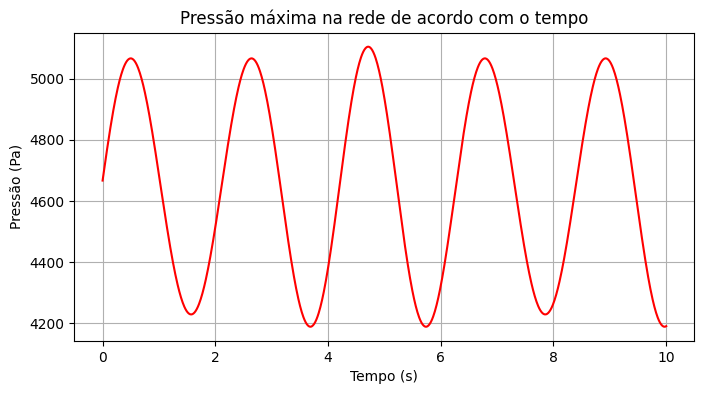

In [9]:
solver_p5 = hydraulics.Hydraulics_p5(conec, Xno_m, config_h)
solver_p5.run(print_info=True, plot=True)

O Problema 6 aborda a viscosidade dependente da temperatura, motivado pelo fato da viscosidade do fluido ser alterada pela temperatura. A temperatura evolui com o tempo segundo `T(t) = 20 + 0.9 t²` [°C], e a viscosidade da água é descrita pela correlação empírica `μ(T) = 0.001791 / (1 + 0.03368 T + 0.000221 T²)` [Pa·s]. A estratégia de solução baseia-se na linearidade: como as condutâncias são proporcionais a `1/μ` e a matriz do sistema é proporcional às condutâncias, as pressões escalam linearmente com `μ`. Dessa forma, a pressão no instante `t` pode ser obtida por `p(t) = (μ(T(t))/μ0) · p0`, exigindo apenas uma única resolução do sistema linear para uma viscosidade de referência `μ0` e um simples rescalamento para cada instante subsequente, sem necessidade de resolver novos sistemas.

=== Hydraulics_p6 ===
Pressão máxima inicial (t=0): 445.13 Pa
Pressão máxima final (t=10): 106.29 Pa




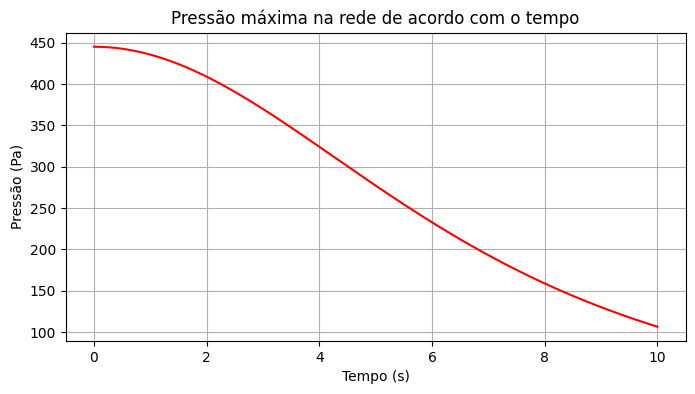

In [10]:
solver_p6 = hydraulics.Hydraulics_p6(conec, Xno_m, config_h)
solver_p6.run(print_info=True, plot=True)

A análise de complexidade computacional avalia o tempo de montagem e de resolução do sistema linear para redes com diferentes níveis de refinamento. A fase de montagem tem complexidade menor, pois percorre cada aresta uma única vez. Já a resolução por LU densa, implementada com np.linalg.solve, apresenta um custo computacional elevado que cresce de forma polinomial com o número de nós. Esse alto custo da resolução fica evidente quando se aumenta o parâmetro levels, o que justifica o uso de solvers esparsos em redes maiores.

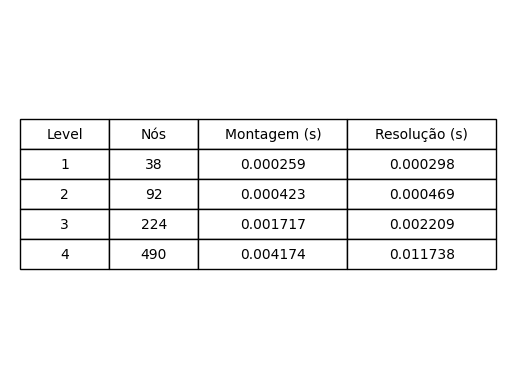

In [11]:
analysis.complexity_analysis()

O estudo demonstrou que a linearidade do modelo hidráulico pode ser explorada de forma sistemática para reduzir drasticamente o custo computacional. Problemas com condições de contorno compostas por múltiplas vazões ou pressões prescritas em vários pontos,foram resolvidos por superposição de um pequeno número de sistemas base, em vez de se resolver o sistema completo a cada instante. Da mesma forma, variações apenas na viscosidade foram tratadas por simples escalonamento de uma única solução de referência. Essas estratégias mantêm a precisão e eliminam a dependência do número de passos temporais, tornando a abordagem especialmente vantajosa para simulações longas. Para redes de maior porte, a limitação está no solver denso utilizado, sendo recomendada a migração para resolvedores esparsos. Os parâmetros físicos adotados (diâmetro hidráulico de ~564 µm, viscosidade de 0,001 Pa·s e vazão de 1×10⁻⁷ m³/s) contextualizam a escala do problema e confirmam a aplicabilidade dos métodos a microescoamentos típicos.

<a id="cap2"></a>
## Capítulo 2: A Placa Térmica

<a id="cap2-1"></a>
### Introdução e Fundamentação teórica
Este capítulo tem como objetivo analisar a transmissão de calor por condução em uma placa bidimensional de Polidimetilsiloxano (PDMS), assumindo que não ocorre variação da temperatura ao longo do tempo (regime permanente). Para a formulação física do problema, utiliza-se a Lei de Fourier (lei constitutiva) combinada com a Lei de Balanço de Energia. 

Esses conceitos associam o fluxo de energia em cada ponto da placa à condutividade térmica do material ($k$) e ao gradiente de temperaturas, resultando na Equação de Poisson bidimensional que governa o sistema:

$$\frac{\partial^2 T}{\partial x^2} + \frac{\partial^2 T}{\partial y^2} = -\frac{f(x, y)}{k}$$

Onde $f(x, y)$ representa a fonte interna de calor imposta ao dispositivo.

<a id="cap2-2"></a>
### Discretização do problema
Para a resolução do problema, a placa é dividida em uma malha retangular de dimensões ($N_x \times N_y$), que define o nível de refinamento e precisão do resultado de acordo com o número de divisões (células). As temperaturas são previamente determinadas nas quatro bordas (esquerda, direita, topo e base) através de condições de contorno de Dirichlet.

Para encontrar a temperatura $T$ nos vértices $(i, j)$ internos da malha, aproximamos as derivadas parciais de segunda ordem por diferenças finitas centradas:

$$\frac{T_{i+1,j} - 2T_{i,j} + T_{i-1,j}}{\Delta x^2} + \frac{T_{i,j+1} - 2T_{i,j} + T_{i,j-1}}{\Delta y^2} = -\frac{f_{i,j}}{k}$$

Isso gera o estêncil clássico de 5 pontos, onde a temperatura de cada nó depende diretamente de seus vizinhos imediatos. Ao aplicar essa equação para todos os nós internos, estruturamos um sistema linear global da forma $A\mathbf{x} = \mathbf{b}$.

<a id="cap2-3"></a>
### Aspectos computacionais
O código foi implementado em Python utilizando os módulos estruturados `thermal` e `env`, além das bibliotecas padrão NumPy e SciPy. Como a matriz global $A$ é altamente esparsa (formato pentadiagonal) e possui a propriedade de ser Simétrica e Definida Positiva (SDP), adotou-se o armazenamento em formato **CSR (Compressed Sparse Row)** e a resolução via **Fatoração de Cholesky** ($A = LL^T$) para otimizar o tempo de máquina e o uso de memória.

Ademais, o notebook implementa o algoritmo iterativo `encontrar_Tc_para_Tmax_defin`. Esse método busca calibrar a temperatura crítica $T_C$ para atingir uma temperatura máxima alvo ($T_{max}$) através de uma relação de recorrência controlada por um coeficiente de relaxação $\beta$:

$$T_{C}^{(k+1)} = T_{C}^{(k)} - \beta F(T_{C}^{(k)})$$


O sistema térmico foi implementado a partir de uma classe base capaz de resolver o problema tanto via fatoração de Cholesky quanto utilizando matrizes esparsas da biblioteca scipy, conforme orientado nas anotações.

Resultados para classe: Thermal
Resolvido por: cholesky
Número de discretizações: (101, 51)
Condutividade térmica utilizada: 0.25 W/mK
Fonte térmica utilizada: 5.0e+05 W/m³


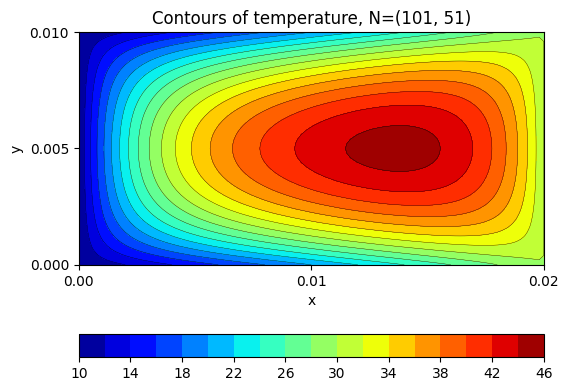

In [12]:
placa_termica_cholesky = thermal.Thermal(config = config_t, method = "cholesky")
placa_termica_cholesky.run(print_info=True, plot=True)

Resultados para classe: Thermal
Resolvido por: sparse
Número de discretizações: (101, 51)
Condutividade térmica utilizada: 0.25 W/mK
Fonte térmica utilizada: 5.0e+05 W/m³


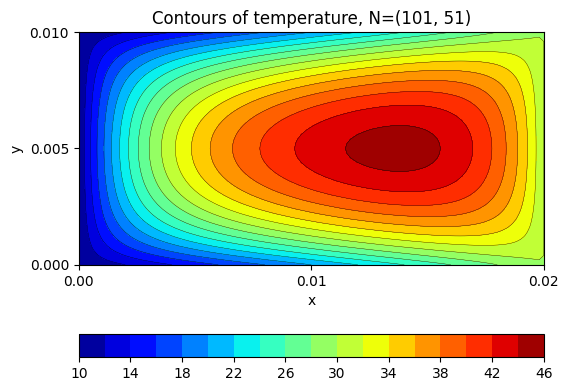

In [13]:
placa_termica_sparse = thermal.Thermal(config = config_t, method = "sparse")
placa_termica_sparse.run(print_info=True, plot=True)

<a id="cap2-4"></a>
### Resolução dos Problemas (Formulação e Malha)

<a id="cap2-5"></a>
#### Problema 1.1: Definição dos Parâmetros Físicos e Geometria da Placa
Nesta etapa, definem-se as dimensões reais da placa de PDMS, a condutividade térmica do material ($k$) e as funções que descrevem as fontes de calor. É aqui que se estabelece o mapeamento contínuo antes da discretização.

Nesse primeiro estudo analisa a complexidade computacional dos métodos de Cholesky e sparse para diferentes níveis de discretização. Os testes foram realizados em dois computadores distintos para reduzir a influência do ambiente, e os resultados obtidos são apresentados a seguir:

In [14]:
analise_complex_vs_sparse = thermal.Thermal_P1(config_t)
analise_complex_vs_sparse.complexity_analysis(print_info=True, plot= False)

Malha (21, 11) analisada. Esparsa: 0.0011s | Densa: 0.0199s
Malha (41, 21) analisada. Esparsa: 0.0034s | Densa: 0.1357s
Malha (81, 41) analisada. Esparsa: 0.0130s | Densa: 1.2398s
Malha (161, 81) analisada. Esparsa: 0.0614s | Densa: 51.2260s
Malha (321, 161) analisada. Esparsa: 0.4708s | Densa: Pulada


![Resultados analise_complex_cholesky_vs_sparse para um computador](tempos_medidos.png)


![Resultados analise_complex_cholesky_vs_sparse para outro computador](tempos_medidos2.png)

**As malhas geradas pela implementação estão de acordo com o esperado para as discretizações propostas:**

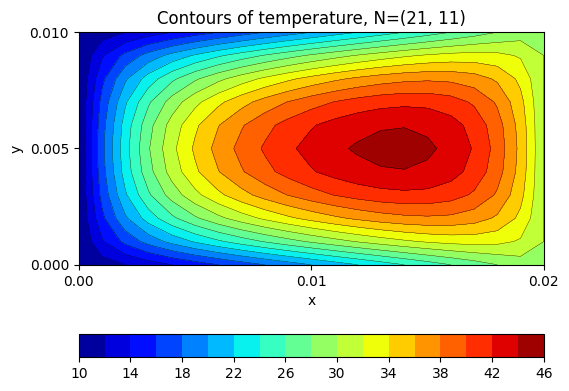

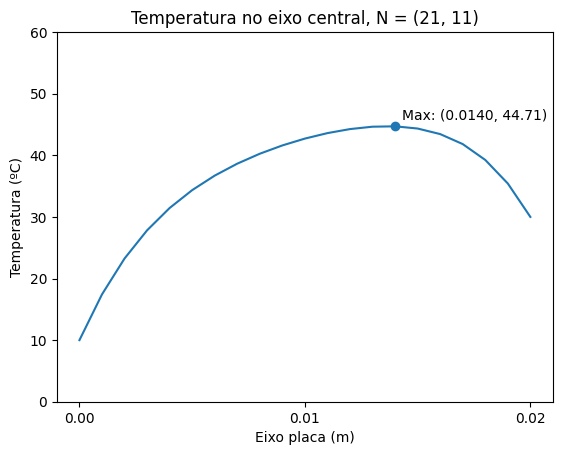

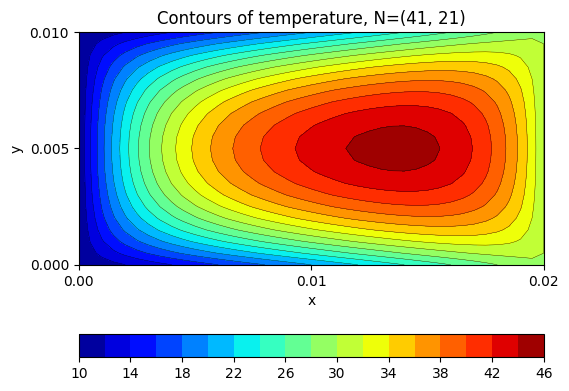

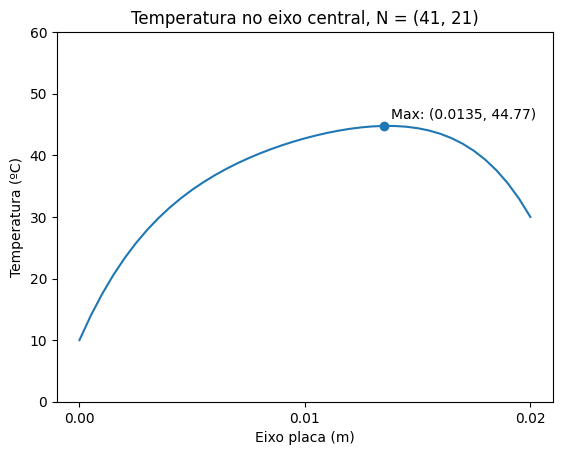

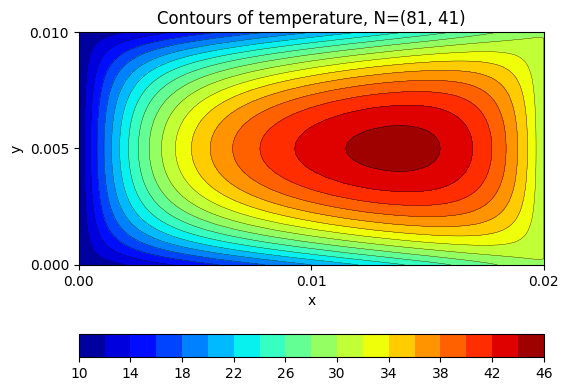

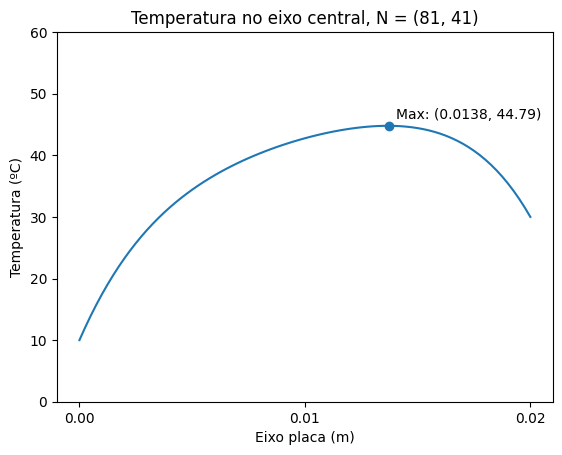

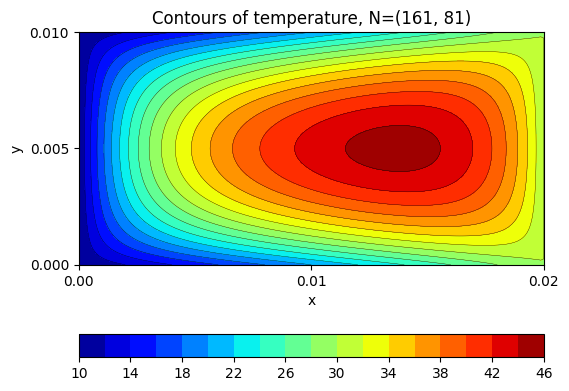

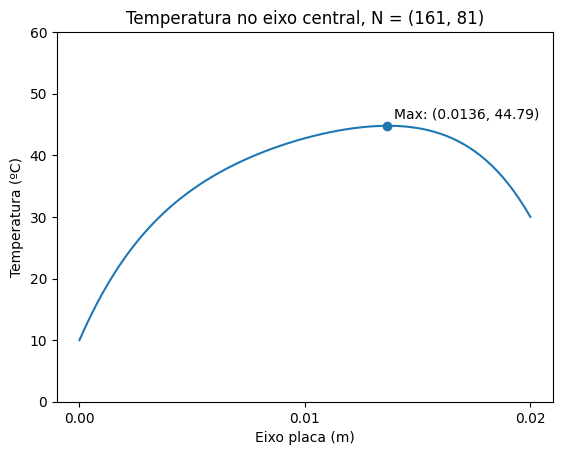

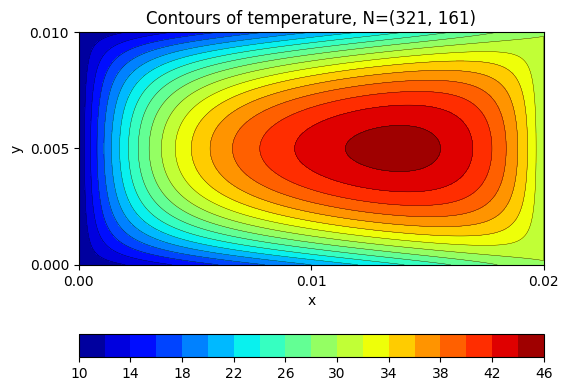

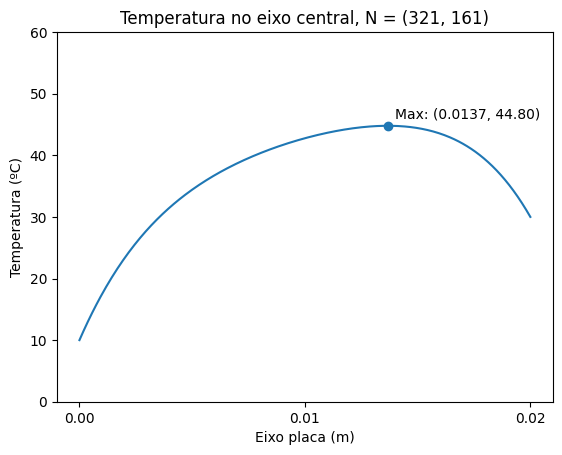

In [15]:
analise_complex_vs_sparse.run(plot=True)

<a id="cap2-6"></a>
#### Problema 1.2: Configuração das Condições de Contorno e Inclusão da Região Circular
Nesta etapa, são estabelecidas as restrições térmicas do problema por meio de Condições de Contorno de Dirichlet, onde os valores de temperatura são fixados diretamente nas fronteiras físicas do domínio. As temperaturas fixas das quatro bordas externas (esquerda, direita, topo e base) são injetadas diretamente no vetor de cargas $\mathbf{b}$ e na estrutura da matriz global $A$.

A principal característica deste segundo estudo é a introdução de uma região circular interna mantida a uma temperatura fixa $T_C$. O algoritmo mapeia os nós que pertencem geometricamente a essa circunferência e impõe a restrição térmica neles, permitindo avaliar o comportamento do fluxo de calor e o efeito de barreira térmica para diferentes níveis de discretização da malha.

Resultados para classe: Thermal_P2
Resolvido por: sparse
Raio do círculo: 0.002 m
Temperatura no círculo: 30 °C


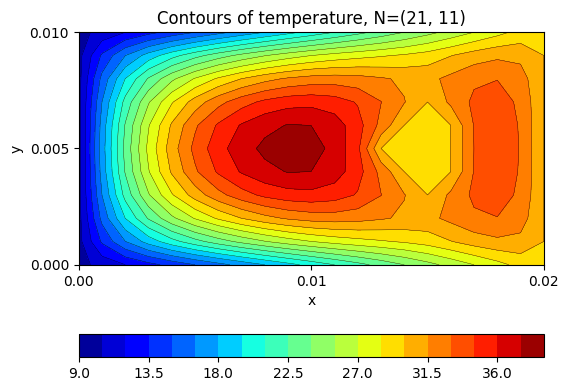

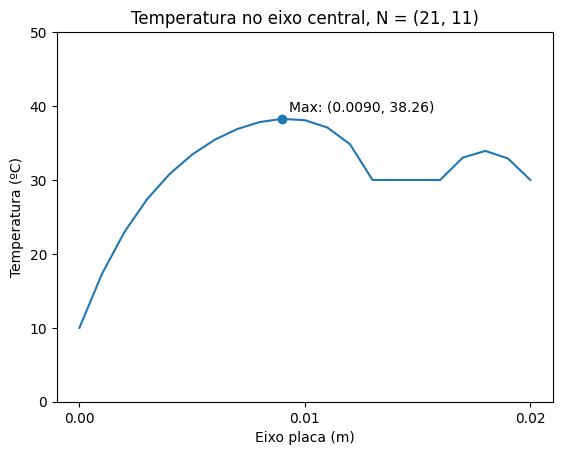

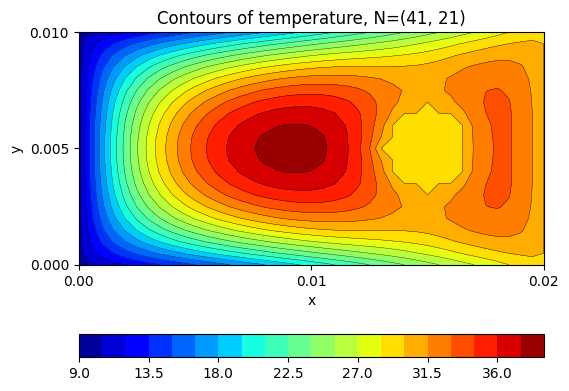

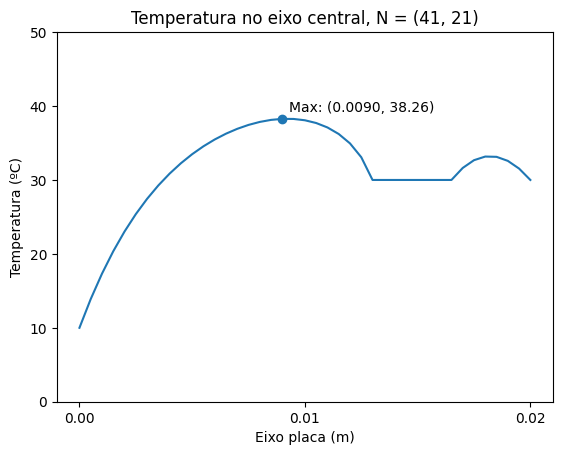

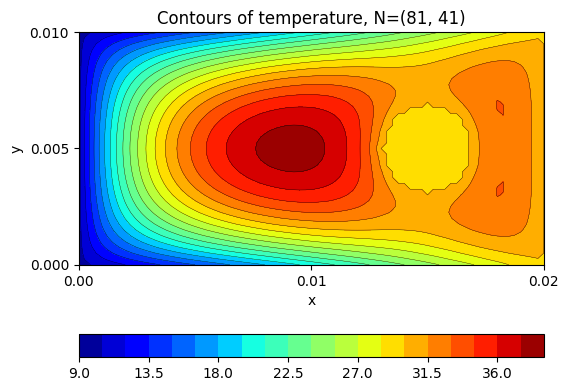

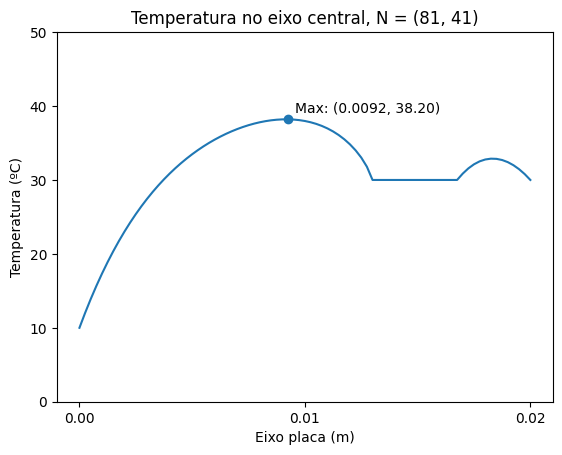

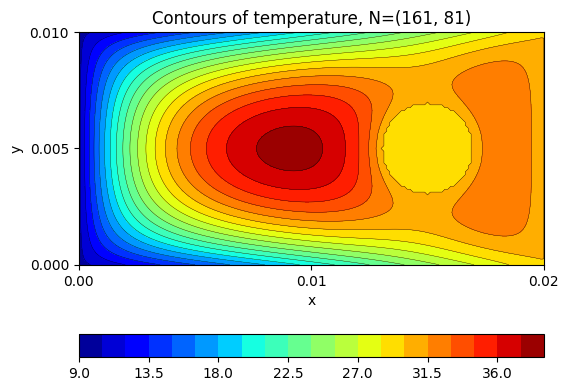

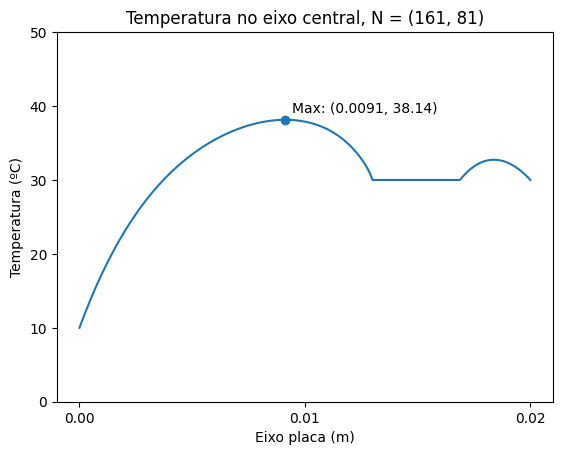

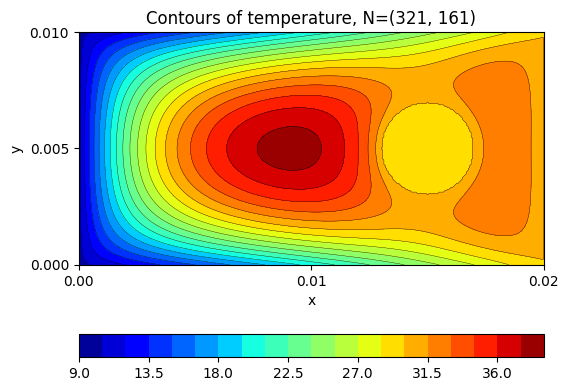

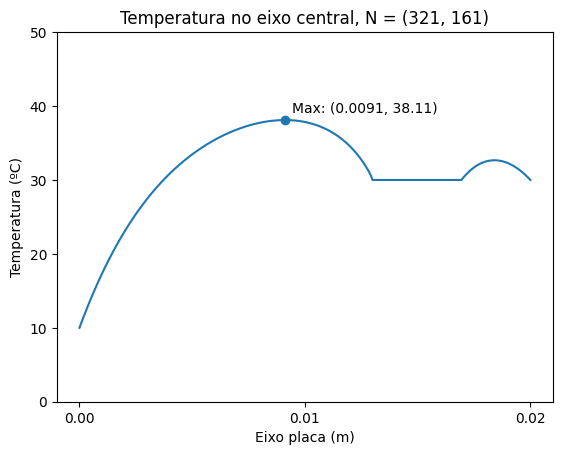

In [16]:
analise_regiao_circular = thermal.Thermal_P2(config = config_t, method = "sparse")
analise_regiao_circular.run(print_info = True, plot = True)

<a id="cap2-7"></a>
#### Problema 1.3: Construção da Matriz Esparsa Global e Condutividade Térmica Variável
Nesta etapa, realiza-se a implementação do estêncil clássico de 5 pontos para os nós internos da malha. O código converte a estrutura geométrica bidimensional em um sistema linear esparso global utilizando o formato CSR (`scipy.sparse`), garantindo máxima economia de memória e eficiência computacional.

A particularidade deste terceiro estudo é a consideração de uma condutividade térmica variável, definida como uma função trigonométrica da posição $(x, y)$ na placa. O objetivo desta análise é investigar o impacto dessa heterogeneidade do material na distribuição final de temperatura, o que exige que os coeficientes da matriz esparsa sejam calculados localmente para cada nó da malha.

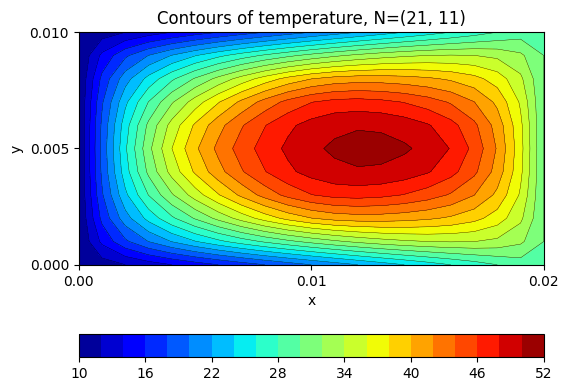

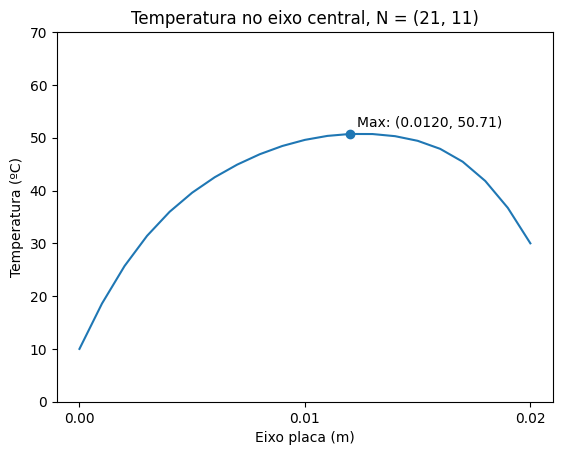

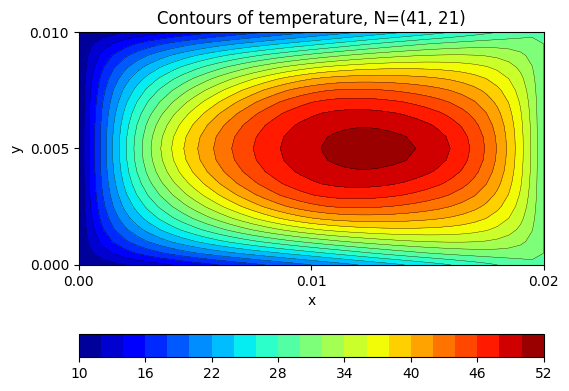

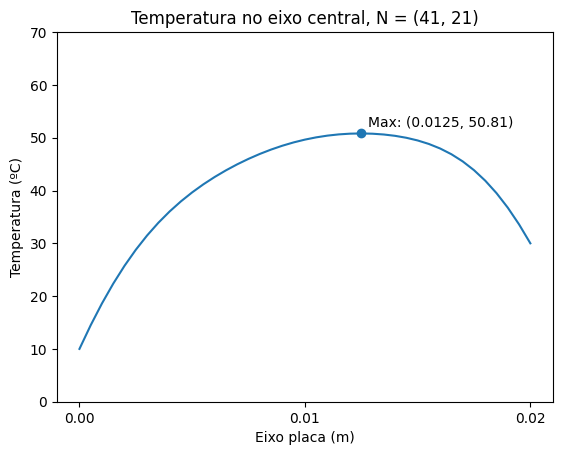

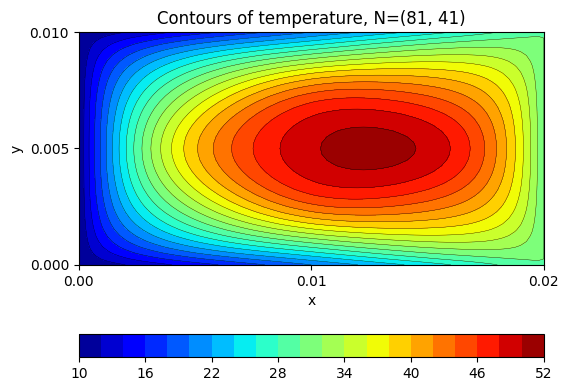

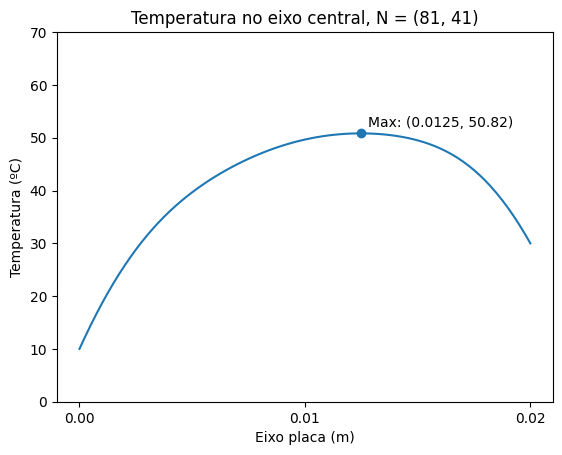

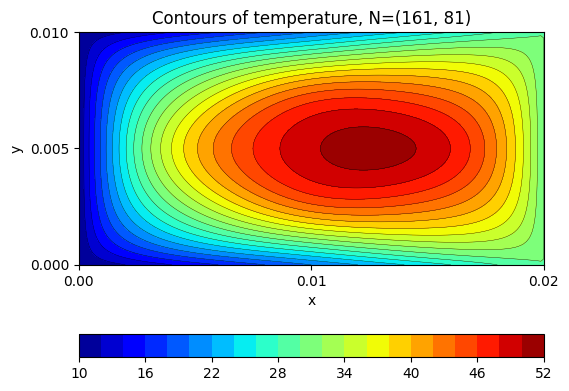

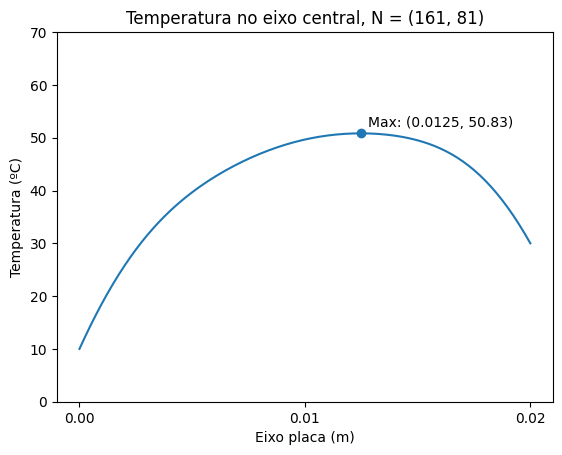

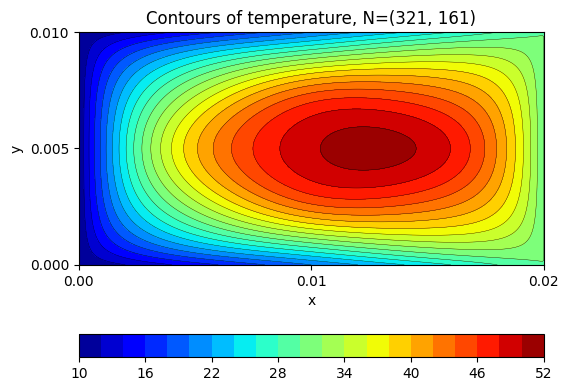

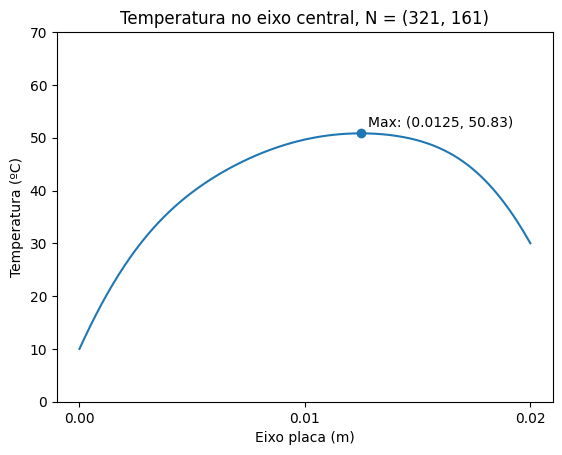

In [17]:
analise_k_variavel = thermal.Thermal_P3(config = config_t, method = "sparse")
analise_k_variavel.run(plot = True)

<a id="cap2-8"></a>
#### Problema 1.4: Implementação do Solver por Fatoração de Cholesky e Variação de Temperatura Circular
Aproveitando a simetria e o fato de a matriz global $A$ ser definida positiva (SDP), o sistema linear $A\mathbf{x} = \mathbf{b}$ é resolvido utilizando a decomposição de Cholesky ($A = LL^T$). Essa abordagem otimiza significativamente o tempo computacional e o uso de memória em relação a solvers diretos genéricos.

O quarto estudo estende o caso da região circular interna, investigando o impacto de diferentes níveis de temperatura impostas nessa área geométrica sobre o comportamento global do campo térmico e o padrão de escoamento de calor pela placa.

Resultados para classe: Thermal_P4
Resolvido por: sparse
Número de discretizações: (101, 51)


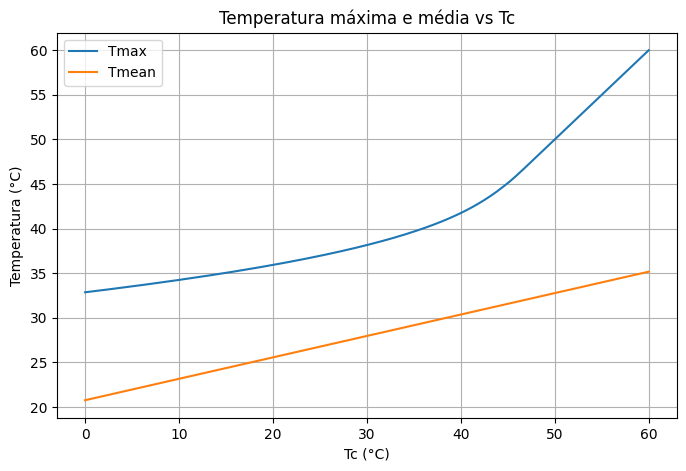

In [18]:
analise_regiao_circular_varias_temps = thermal.Thermal_P4(config = config_t, method = "sparse")
analise_regiao_circular_varias_temps.run(print_info = True, plot = True)

<a id="cap2-9"></a>
#### Problema 1.5: Visualização do Campo Térmico Inicial e Análise de Linearidade do Sistema
Nesta etapa, realiza-se a geração dos primeiros gráficos de contorno (heatmaps) para validar visualmente se a distribuição de temperatura gerada condiz com o comportamento físico esperado para a placa de PDMS. 

Aprofundando a análise, o quinto estudo explora a propriedade de linearidade do sistema de equações diferenciais e algébricas. Como o operador laplaciano e as condições de contorno são lineares, a temperatura em um nó arbitrário $k$ pode ser expressa de forma exata como uma combinação linear das condições de contorno independentes:

$$T_k = a \cdot T_C + b \cdot T_R + c$$

Onde $T_C$ é a temperatura imposta na região circular interna e $T_R$ é a temperatura fixada na borda direita da placa. Os coeficientes de sensibilidade $a$, $b$ e $c$ foram determinados numericamente através de simulações controladas, permitindo prever o impacto isolado de cada fronteira no campo térmico global.

In [19]:
analise_linearidade = thermal.Thermal_P5(config=config_t, method="sparse")
analise_linearidade.run(print_info = True)


--- Problema 5 ---

Coeficientes encontrados (nó k=233)
  a = 0.00003821   (sensibilidade a T_R)
  b = 0.01286422   (sensibilidade a T_C)
  c = 18.97207591   (termo independente)

Equação linear
  T_233 = 0.000038·T_R  +  0.012864·T_C  +  18.972076


<a id="cap2-10"></a>
### Refinamento de Malha e Calibração Térmica

<a id="cap2-11"></a>
#### Problema 2.1: Algoritmo de Busca e Ajuste de Temperatura Crítica ($T_C$)
Para cumprir os requisitos de projeto do dispositivo microfluídico, é necessário calibrar a temperatura da região circular interna ($T_C$) de forma que a temperatura máxima atingida na placa ($T_{max}$) não ultrapasse um limite estipulado. 

Como a relação entre as condições de contorno e o pico de temperatura é linear (conforme demonstrado no Problema 1.5), implementa-se a rotina iterativa `encontrar_Tc_para_Tmax_defin`. O algoritmo utiliza um método de busca auxiliado por um coeficiente de relaxação $\beta$ para atualizar o valor de $T_C$ a cada passo, convergindo rapidamente até que o critério de parada ($T_{max}$ alvo) seja satisfeito.

Neste estudo, comparamos a eficiência dos métodos iterativos de Jacobi e Gauss-Seidel para a resolução do campo de temperaturas associadas, analisando detalhadamente o tempo de convergência e o número de iterações necessárias em função tanto do refinamento da malha quanto da tolerância adotada como critério de parada.

Jacobi converge em 7203 iterações
Resultados para classe: Thermal_P1_extra
Resolvido por: jacobi


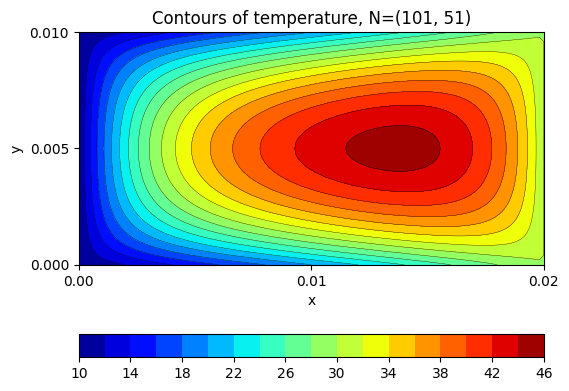

In [20]:
metodo_iterativo_jacobi = thermal.Thermal_P1_extra(config_t, method = "jacobi")
metodo_iterativo_jacobi.run(print_info = True, plot = True)

![Resultados 1 do método iterativo](tempoXsubdivisoes_1.png)

![Resultados 2 do método iterativo](tempoXsubdivisoes_2.png)

![Resultados 3 do método iterativo](tempoXtolerancia.png)


<a id="cap2-12"></a>
#### Problema 2.2: Loop de Varredura e Estudo de Convergência Espacial
Nesta etapa, o motor numérico executa uma varredura sistemática aplicando o solver de Cholesky e o algoritmo de calibração em múltiplos níveis de refinamento de malha. O domínio é discretizado progressivamente em cinco cenários: desde uma malha grossa de $21 \times 11$ nós (231 incógnitas) até uma malha extremamente refinada de $321 \times 161$ nós (51.681 incógnitas). 

O objetivo deste loop é avaliar simultaneamente a consistência física dos resultados e o comportamento dos tempos computacionais à medida que o tamanho do sistema linear cresce quadraticamente.

A animação abaixo ilustra o processo de convergência dos métodos iterativos ao longo das iterações.

In [21]:
Video("Animacao_Termica.mp4", width=1100)

<a id="cap2-13"></a>
#### Problema 2.3: Análise Comparativa e Discussão de Desempenho
A execução do loop gera a tabela comparativa final, que consolida os seguintes parâmetros de desempenho para cada nível de refinamento: tempo de montagem da matriz, tempo de resolução do sistema linear, número de iterações para a convergência de $T_C$, e os valores finais calculados para $T_{max}$ e $T_C$.

A análise dos dados obtidos revela que o formato esparso CSR mantém o tempo de montagem da matriz otimizado e quase constante. Em contrapartida, o tempo de resolução via Fatoração de Cholesky cresce de forma acentuada nas malhas maiores devido ao efeito de *fill-in* nas bandas da matriz durante a fatoração. Do ponto de vista físico, a estabilidade de $T_{max}$ e a convergência assintótica de $T_C$ para $\approx 34.64^\circ\text{C}$ comprovam a eliminação gradual dos erros de truncamento numérico com o refinamento do domínio.

Por fim, investigamos o comportamento inverso do sistema: qual deve ser a temperatura exata a ser aplicada na região circular interna ($T_C$) para que a temperatura máxima global da placa atinja precisamente o valor de projeto desejado para o dispositivo microfluídico.

In [22]:
encontrar_Tc_para_Tmax_definido = thermal.SolucionadorTermicoIterativo(config_t)
encontrar_Tc_para_Tmax_definido.run()


    Nx     Ny    N_nos   t_mont(s)  t_resolv(s)   Iters   T_max(C)       T_C(C)
-------------------------------------------------------------------------------
    21     11      231      0.0009       0.0529      26    39.5001      34.2883
    41     21      861      0.0035       0.0789      25    39.5001      34.2495
    81     41     3321      0.0076       0.6723      26    39.5001      34.4156
   161     81    13041      0.0302       1.9878      25    39.5001      34.5515
   321    161    51681      0.1271      11.8325      24    39.5001      34.6376


<a id="cap3"></a>
## Capítulo 3: Membrana Elástica




<a id="cap3-2"></a>
### Escopo do capítulo

Este capítulo trata da parte mecânica do gêmeo digital: a membrana elástica circular que fecha o reservatório de expansão. O objetivo é transformar o modelo contínuo de vibração de membranas em um problema algébrico de autovalores, resolver os modos naturais numericamente e usar essa base modal para estudar oscilações livres e forçadas.

A entrega segue os itens propostos no enunciado do Capítulo 3: implementação da membrana circular, cálculo das frequências e dos dez primeiros modos, estudo de convergência com refinamento de malha, dedução da solução modal para condições iniciais arbitrárias, projeção de um termo forçante na base de autovetores generalizados e análise da energia elástica média em função da frequência de excitação.

<a id="cap3-3"></a>
### Autovalores e autovetores

Antes de modelar a membrana, o PDF revisa o problema de autovalores e autovetores, pois os modos naturais de vibração aparecem exatamente como autovetores de um operador mecânico discreto. Para uma matriz $A$, um escalar $\lambda$ é autovalor se existe um vetor não nulo $v$ tal que

$$
A v = \lambda v.
$$

De forma equivalente,

$$
(A-\lambda I)v=0,
$$

e, para que exista uma solução não trivial, a matriz $A-\lambda I$ deve ser singular. Assim, os autovalores são obtidos a partir do polinômio característico

$$
\det(A-\lambda I)=0.
$$

No caso de matrizes simétricas, que aparecem com frequência em problemas mecânicos, os autovalores são reais e os autovetores associados a autovalores distintos são ortogonais. Essa propriedade permite escrever o movimento como combinação de modos independentes.

<a id="cap3-4"></a>
### Método de Francis

O PDF também apresenta o método de Francis, conhecido como algoritmo QR, como uma estratégia iterativa para calcular autovalores. A ideia é construir uma sequência de matrizes semelhantes, isto é, matrizes que preservam os mesmos autovalores da matriz original.

Partindo de $A_1=A$, em cada iteração faz-se a fatoração QR

$$
A_k=Q_kR_k,
$$

onde $Q_k$ é ortogonal e $R_k$ é triangular superior. Em seguida define-se

$$
A_{k+1}=R_kQ_k.
$$

Como

$$
A_{k+1}=Q_k^T A_k Q_k,
$$

as matrizes $A_k$ e $A_{k+1}$ são semelhantes e, portanto, têm os mesmos autovalores. Repetindo esse processo, a matriz tende a uma forma quase diagonal, na qual os autovalores aparecem na diagonal. O produto acumulado das matrizes $Q_k$ fornece informação sobre os autovetores.

<a id="cap3-5"></a>
### Problema generalizado e uso no código

Para a membrana, o problema não aparece apenas como $Av=\lambda v$, mas como um problema generalizado de autovalores:

$$
K\Phi^{(k)}=\lambda_k M\Phi^{(k)},
$$

em que $K$ é a matriz de rigidez, $M$ é a matriz de massa e $\Phi^{(k)}$ representa o modo natural associado ao autovalor $\lambda_k$. Esses autovalores estão ligados às frequências naturais de oscilação.

No código do projeto, o método de Francis não foi implementado manualmente. Em vez disso, foi usada a rotina `scipy.sparse.linalg.eigsh`, adequada para matrizes grandes e esparsas. Essa escolha é coerente com o objetivo computacional: calcular apenas os primeiros modos fundamentais, e não todo o espectro da matriz.

<a id="cap3-6"></a>
### Modelo físico

A membrana é modelada como um corpo bidimensional tensionado, com deslocamento vertical $w(x,y,t)$. Desprezando inicialmente o acoplamento com a rede hidráulica, a dinâmica contínua pode ser escrita como

$$
\rho e\,\frac{\partial^2 w}{\partial t^2} - \sigma \nabla^2 w = f(x,y,t),
$$

em que $\rho$ é a densidade do material, $e$ é a espessura, $\sigma$ é a tensão membranal e $f$ é a força normal distribuída. A borda da membrana circular é fixa, portanto $w=0$ no contorno.

Para a membrana do gêmeo digital foram usados os parâmetros do enunciado: raio $R=0{,}004\,\mathrm{m}$, espessura $e=10^{-4}\,\mathrm{m}$, tensão $\sigma=200\,\mathrm{N/m}$ e densidade $\rho=900\,\mathrm{kg/m^3}$.

<a id="cap3-7"></a>
### Formulação numérica

O domínio é adimensionalizado para um círculo de raio unitário e discretizado por uma malha cartesiana $N\times N$ no quadrado $[-1,1]\times[-1,1]$. Os pontos externos ao círculo, incluindo a borda, são tratados como pontos restritos. Na implementação, essa restrição é imposta substituindo as linhas e colunas correspondentes por um valor diagonal grande, de modo que esses graus de liberdade produzam autovalores artificiais afastados dos modos físicos fundamentais.

O operador de rigidez usa o Laplaciano de cinco pontos:

$$
\nabla_h^2 w_{i,j}\approx\frac{w_{i+1,j}+w_{i-1,j}+w_{i,j+1}+w_{i,j-1}-4w_{i,j}}{h^2}.
$$

No código do projeto, a matriz de rigidez é montada diretamente com o fator de tensão membranal:

$$
K = \frac{\sigma}{h^2}L_h,
$$

em que $L_h$ representa o operador discreto associado ao stencil de cinco pontos. O problema resolvido numericamente é

$$
K\Phi^{(k)}=\lambda_k M\Phi^{(k)},
$$

com $M=I$ na implementação usada. Em seguida, o método `SolveEigenWithoutForce` calcula as frequências por

$$
f_k=\frac{1}{2\pi}\sqrt{\frac{\sigma}{\rho e R^2}}\sqrt{\lambda_k}.
$$



<a id="cap3-8"></a>
### Membrana circular: modos fundamentais

A primeira simulação usa a malha nominal $51\times51$. A figura mostra os dez primeiros modos encontrados. Os modos aparecem em pares quase degenerados quando representam a mesma família física com orientações espaciais diferentes, comportamento esperado em uma membrana circular.


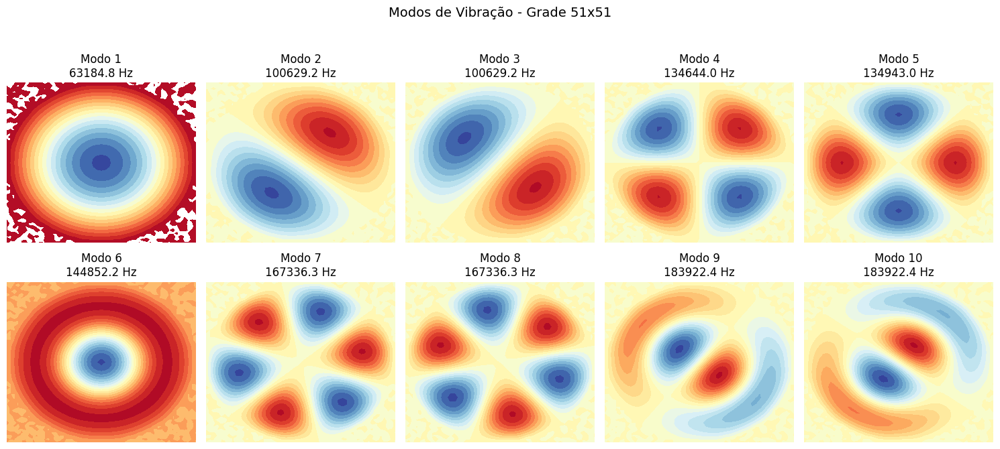

In [23]:
membrana_elastica = mechanic.Mechanic(config_m)
membrana_elastica.run(print_info=False, plot=True)


<a id="cap3-9"></a>
### Refinamento de malha e convergência

Para verificar a influência da discretização, o mesmo problema foi resolvido nas malhas $21\times21$, $41\times41$, $61\times61$, $81\times81$ e $101\times101$. A tabela mostra as dez primeiras frequências naturais em Hertz.


In [24]:

frequencias_por_malha = []
for n in config_m["MULTI_N"]:
    config_local = config_m.copy()
    config_local["N"] = (n, n)
    solver = mechanic.Mechanic(config_local)
    freq, omega, modes = solver.SolveEigenWithoutForce()
    frequencias_por_malha.append([f"{n} x {n}", *freq[:10]])

frequencias_por_malha


[['21 x 21',
  np.float64(62262.94293959196),
  np.float64(98921.00539862823),
  np.float64(98921.00539862878),
  np.float64(131983.65850770357),
  np.float64(132184.54366765483),
  np.float64(141773.30507516998),
  np.float64(163316.80171357514),
  np.float64(163316.8017135794),
  np.float64(179077.71623735048),
  np.float64(179077.71623735104)],
 ['41 x 41',
  np.float64(62874.15851709653),
  np.float64(100108.4634308125),
  np.float64(100108.46343081446),
  np.float64(133942.28242206725),
  np.float64(134157.11758389315),
  np.float64(144035.8850363146),
  np.float64(166341.77228751592),
  np.float64(182782.99258570917),
  np.float64(197118.07157364138),
  np.float64(198032.98502085786)],
 ['61 x 61',
  np.float64(63200.08789877845),
  np.float64(100667.5620883373),
  np.float64(100667.56208834695),
  np.float64(134782.80228470967),
  np.float64(134954.93481404678),
  np.float64(144943.61557603092),
  np.float64(167467.0671540991),
  np.float64(184090.4698874075),
  np.float64(19889


O refinamento reduz a dispersão numérica e estabiliza progressivamente as frequências calculadas pelo código. A tabela e o gráfico acima atendem ao item do PDF que pede os valores das frequências de oscilação em função da discretização. As diferenças entre malhas são mais visíveis nos modos de ordem mais alta, pois eles têm maior variação espacial e são mais sensíveis à representação do contorno circular.



<a id="cap3-10"></a>
### Modos em diferentes discretizações

As figuras seguintes mostram os dez modos para cada malha usada no estudo. A malha grosseira captura a estrutura qualitativa dos modos mais baixos, enquanto as malhas refinadas reduzem o efeito serrilhado do contorno e deixam os modos de ordem mais alta mais bem definidos.


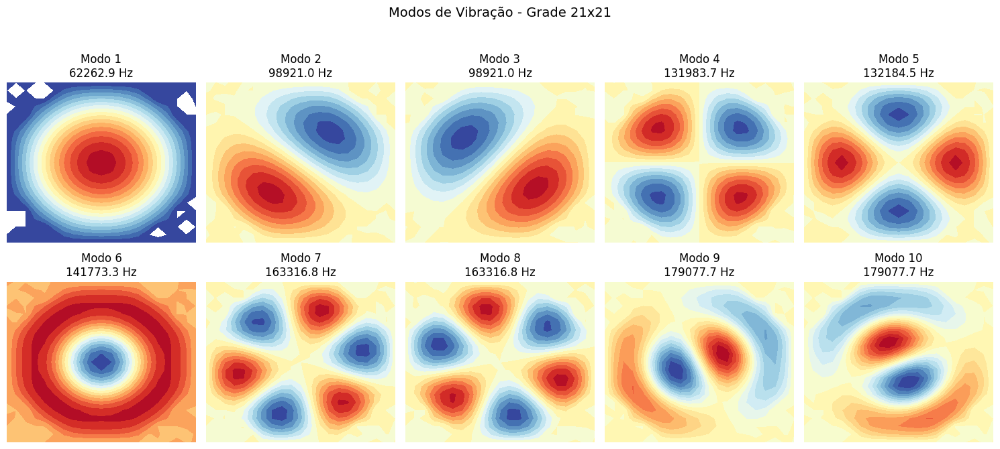

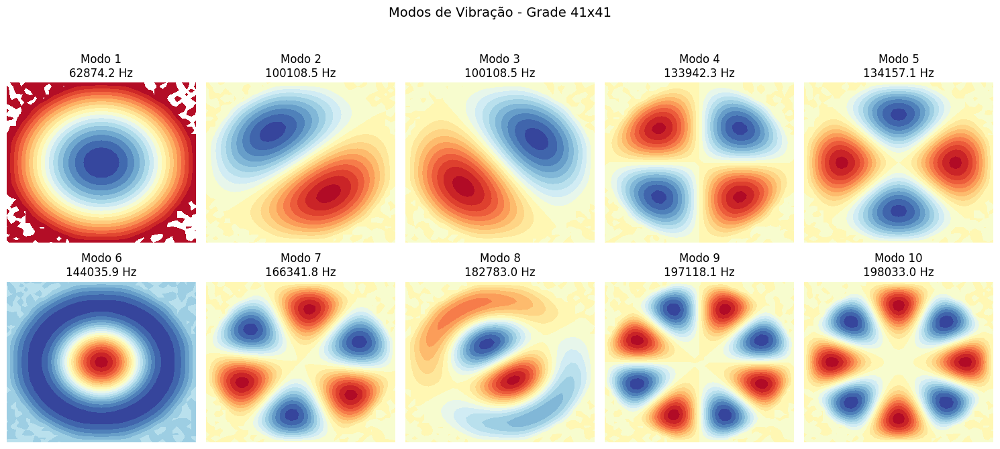

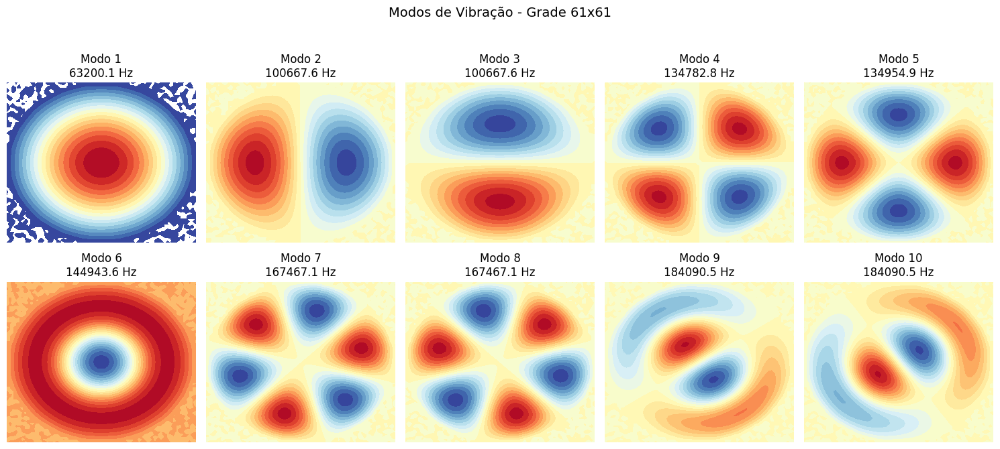

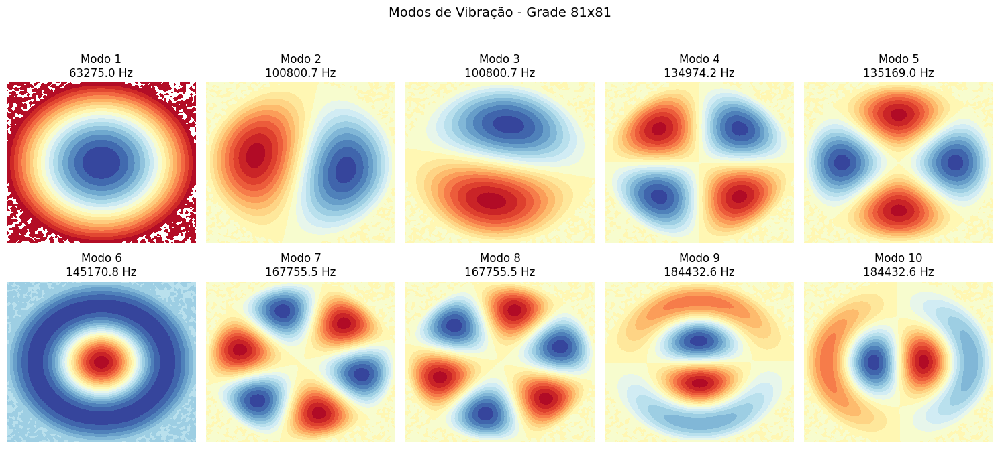

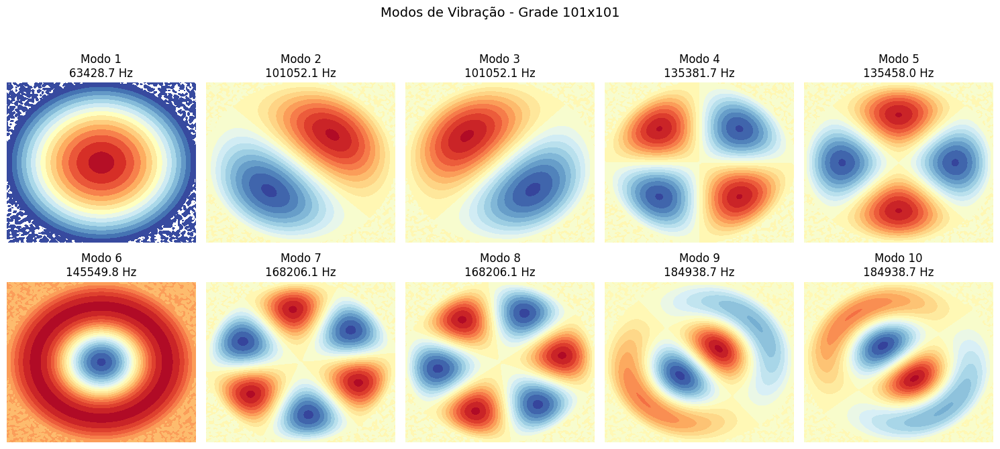

In [25]:

analise_discretizacao = mechanic.Mechanic_P2(config_m)
analise_discretizacao.plot_modes(config_m["MULTI_N"])


<a id="cap3-11"></a>
### Exercício teórico: coeficientes da solução livre

O PDF escreve a solução das oscilações livres na forma modal

$$
w(t)=\sum_{k=1}^{n}\Phi^{(k)}c_k\sin(\omega_k t+\varphi_k),
$$

e pede a obtenção das fórmulas dos coeficientes a partir das condições iniciais. Mantendo a notação do exercício, considere

$$
w(0)=U,\qquad \dot{w}(0)=V.
$$

Projetando essas condições na base modal, tem-se

$$
u_k=(\Phi^{(k)})^T M U,\qquad v_k=(\Phi^{(k)})^T M V.
$$

Substituindo $t=0$ na solução modal e em sua derivada temporal:

$$
u_k=c_k\sin(\varphi_k),\qquad v_k=c_k\omega_k\cos(\varphi_k).
$$

Elevando ao quadrado e somando as duas relações normalizadas, obtemos

$$
c_k=\sqrt{u_k^2+\left(\frac{v_k}{\omega_k}\right)^2}.
$$

A fase $\varphi_k$ fica determinada pelas relações

$$
\sin(\varphi_k)=\frac{u_k}{c_k},\qquad
\cos(\varphi_k)=\frac{v_k}{c_k\omega_k}.
$$

Dessa forma, a escrita permanece fiel ao exercício do PDF: a amplitude e a fase são obtidas a partir das projeções das condições iniciais sobre os modos naturais.



<a id="cap3-12"></a>
### Oscilações forçadas e projeção modal

No caso forçado, foi considerado o carregamento adimensional

$$
\hat{f}(\hat{x},\hat{y},\hat{t})=\left[(\hat{x}-0{,}5)^2+(\hat{y}-0{,}5)^2\right]\cos(\hat{\omega}^{*}\hat{t}).
$$

A parcela espacial do carregamento é montada como um vetor no mesmo espaço dos deslocamentos nodais. Em seguida, esse vetor é projetado na base modal por

$$
c_k=(\Phi^{(k)})^T M\hat{f}.
$$

A tabela e os gráficos abaixo mostram quais modos são mais excitados por esse carregamento.


In [26]:

analise_oscilacao_forcada = mechanic.Mechanic_P4(config_m)
c, V, modes, freq = analise_oscilacao_forcada.compute_modal_projection()

for i, coef in enumerate(c, start=1):
    print(f"Modo {i:02d}: f = {freq[i-1]:.2f} Hz, c_{i} = {coef:.6f}")


Modo 01: f = 63184.75 Hz, c_1 = 30.260556
Modo 02: f = 100629.17 Hz, c_2 = -17.339784
Modo 03: f = 100629.17 Hz, c_3 = 15.921344
Modo 04: f = 134644.03 Hz, c_4 = -0.000000
Modo 05: f = 134943.00 Hz, c_5 = -0.000000
Modo 06: f = 144852.15 Hz, c_6 = 22.398433
Modo 07: f = 167336.26 Hz, c_7 = -0.143916
Modo 08: f = 167336.26 Hz, c_8 = -0.039975
Modo 09: f = 183922.36 Hz, c_9 = 12.823229
Modo 10: f = 183922.36 Hz, c_10 = 0.427428



A projeção mostra que a força não excita todos os modos com a mesma intensidade. Isso ocorre porque a distribuição espacial do carregamento tem simetrias e assimetrias próprias; modos cuja forma espacial é quase ortogonal ao carregamento recebem coeficientes próximos de zero. Essa leitura é importante para o acoplamento posterior: a pressão hidráulica atuará como carregamento mecânico distribuído, e sua geometria determina quais modos responderão com maior amplitude.



<a id="cap3-13"></a>
### Energia elástica média e ressonância

Para a resposta forçada amortecida, adotando amortecimento proporcional à massa, a amplitude modal associada ao modo $k$ pode ser escrita como

$$
A_k(\hat{\omega}^{*})=\frac{c_k}{\sqrt{(\hat{\omega}_k^2-(\hat{\omega}^{*})^2)^2+\beta^2(\hat{\omega}^{*})^2}}.
$$

A energia elástica média em um período é então avaliada por

$$
\langle E\rangle=\frac{1}{4}\sum_k \hat{\omega}_k^2 A_k^2.
$$

O gráfico foi construído para $\beta=0{,}01$, $0{,}1$ e $1{,}0$, em escala log-log.


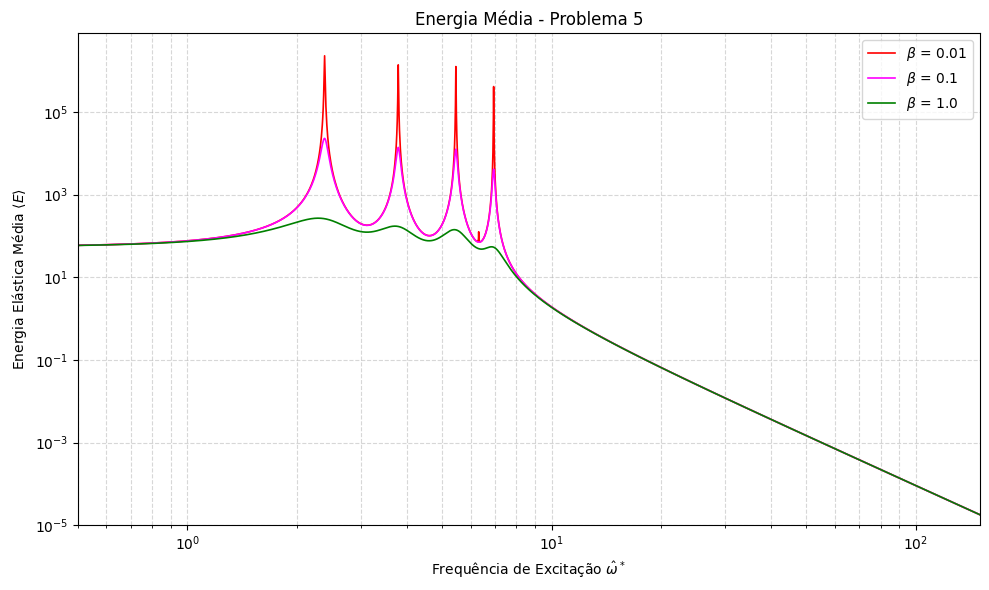

In [27]:
analise_oscilacao_forcada.P5_plot_average_elastic_energy()


As curvas apresentam picos nas vizinhanças das frequências naturais adimensionais. Quando o amortecimento é pequeno, os picos são estreitos e altos, caracterizando uma resposta ressonante mais intensa. À medida que $\beta$ aumenta, a energia máxima diminui e a resposta fica mais suave, indicando que parte maior da energia injetada pelo carregamento é dissipada antes de se acumular nos modos da membrana.



<a id="cap3-14"></a>
### Conclusões do capítulo

A formulação mecânica transformou o problema contínuo da membrana em um problema esparso de autovalores, adequado para o cálculo dos modos fundamentais. A máscara circular permitiu representar a geometria do reservatório no domínio cartesiano usado pelo método de diferenças finitas, enquanto a adimensionalização separou a escala numérica do problema da conversão física para Hertz.

Os resultados mostram convergência das frequências com o refinamento da malha e coerência com a solução analítica de referência para membranas circulares. A projeção do carregamento forçado evidencia que a resposta mecânica depende fortemente da compatibilidade espacial entre força e modos naturais. Por fim, a análise de energia média identifica as regiões de ressonância e mostra o papel estabilizador do amortecimento, preparando a interface conceitual para o Capítulo 5, no qual a pressão hidráulica passa a atuar diretamente sobre a membrana.


<a id="cap4"></a>
## Capítulo 4: Simulação do Acoplamento Hidráulico-Térmico

<a id="cap4-1"></a>
Assumindo um acoplamento fraco entre ambos os sistemas estudados (one-way coupling), analisamos o impacto que a placa térmica, mantida fixa, na rede hidráulica e vice-versa.

<a id="cap4-2"></a>
#### Influência da temperatura na rede hidráulica

Nesta primeira etapa do acoplamento hidráulico-térmico, investiga-se como a distribuição de temperaturas da placa afeta a viscosidade do fluido em cada aresta, sendo esta grandeza uma função da temperatura média da respectiva aresta. A temperatura média ao longo de um microcanal $k$, de comprimento $\ell_k$, é definida formalmente pela integral de linha:

$$ \langle T_k \rangle  = \frac{1}{\ell_k}\int_0^{\ell_k} T_k(p(s))\, ds $$

onde $\ell_k$ representa o comprimento da aresta e $s$ é a variável de parametrização do trajeto do microcanal (com $s=0$ no nó inicial e $s=\ell_k$ no nó final). O problema fundamental é que a função $T_k(s) = T(p(s))$ não possui expressão analítica conhecida uma vez que o campo de temperaturas é obtido numericamente pela solução do problema de condução de calor na placa, e está disponível
apenas nos nós de uma malha discreta. Por essa razão, a integral precisa ser aproximada por métodos de quadratura numérica.

A ideia central de qualquer regra de quadratura é substituir a função real $T_k(s)$, inviável de integrar analiticamente, por uma função auxiliar mais simples, como um polinômio, cuja integral é conhecida em forma fechada. Os quatro métodos explorados a seguir diferem entre si em dois aspectos independentes:

1. O grau do polinômio local usado para aproximar $T_k(s)$: grau 0 (constante) na regra do ponto médio, ou grau 1 (linear/afim) na regra do trapézio.
2. A subdivisão do domínio de integração $[0,\ell_k]$: as versões simples aplicam a aproximação polinomial em uma única vez sobre todo o intervalo, enquanto as versões compostas particionam $[0,\ell_k]$ em $N$ subintervalos de comprimento $\Delta s = \ell_k/N$ e aplicam a regra simples em cada um deles, somando as contribuições.

Assim, quanto maior o grau do polinômio interpolador e/ou maior o número de subdivisões $N$, menor tende a ser o erro de quadratura, mas maior o custo computacional associado (mais chamadas ao interpolador de temperatura). O balanço entre precisão e custo é justamente o que será investigado posteriormente.



<a id="cap4-3"></a>
##### Regra do ponto médio (simples)
A regra do ponto médio aproxima $T_k(s)$ por uma função **constante**, igual ao valor da temperatura no ponto médio do domínio de integração, ou seja, um polinômio interpolador de grau 0 (ordem 1) que coincide necessariamente com a função original apenas em $s = \ell_k/2$:

$$ T_k(s) \approx T_k\!\left(s = \frac{\ell_k}{2}\right) \qquad \Longrightarrow \qquad
\langle T_k \rangle  \approx  T_k\!\left(s = \frac{\ell_k}{2}\right)$$

Geometricamente, a integral é aproximada pela área de um retângulo de altura $T_k(\ell_k/2)$ e base $\ell_k$.

- Segue abaixo uma aplicação simplificada da regra do ponto médio em Python

In [28]:
# Média de temperatura pela regra do ponto_médio, assumindo que l_k = len(T_k)
def regra_do_ponto_médio(T_k: list, l_k: int):
    ponto_medio = int(l_k/2)
    return T_k[ponto_medio]

T = [36, 34, 31, 33, 31, 34, 35, 38]
T_med_pm = regra_do_ponto_médio(T, len(T))
T_med = int(sum(T)/len(T))

print(f"Temperatura média: {T_med}")
print(f"Temperatura média pela regra do ponto médio: {T_med_pm}")

Temperatura média: 34
Temperatura média pela regra do ponto médio: 31


<a id="cap4-4"></a>
##### Regra do ponto médio composta
A regra composta divide o intervalo $[0, \ell_k]$ em $N$ subintervalos de comprimento $\Delta s = \ell_k/N$ e aplica a regra do ponto médio simples em cada um deles, avaliando a função no centro de cada subintervalo, $s_n = \left(n - \tfrac{1}{2}\right)\Delta s$, para $n = 1, \ldots, N$. Somando as $N$ contribuições retangulares:

$$ \langle T_k \rangle \approx \frac{1}{\ell_k} \sum_{n=1}^{N} T_k(s_n)\, \Delta s $$

Cada subintervalo contribui com sua própria aproximação constante local; à medida que $N$ cresce, os subintervalos ficam cada vez menores e a função $T_k$ pode ser considerada aproximadamente constante dentro de cada um deles com erro cada vez menor. Teoricamente, o erro global da regra do ponto médio composta decai como $O(\Delta s^2) = O(1/N^2)$ para funções suficientemente
suaves. Essa é a razão pela qual métodos compostos são preferíveis a uma única avaliação simples sempre que se exige maior exatidão: o custo cresce apenas linearmente com $N$ (uma avaliação da função por subintervalo), enquanto o erro decai quadraticamente.

- Segue abaixo uma aplicação simplificada da regra do ponto médio composta em Python

In [29]:
# Média de temperatura pela regra do ponto_médio composta, assumindo que l_k = len(T_k)
def regra_do_ponto_médio_composta(T_k: list, l_k: int, N):
    delta_s = l_k/N
    t_sum = 0

    for n in range(1, N+1):
        s_n = int((n - 0.5)*delta_s)
        t_sum += T_k[s_n]*delta_s

    return t_sum/l_k

T = [36, 34, 31, 33, 31, 34, 35, 38]
T_med_pmc_2 = regra_do_ponto_médio_composta(T, len(T), 2)
T_med_pmc_4 = regra_do_ponto_médio_composta(T, len(T), 4)
T_med = int(sum(T)/len(T))

print(f"Temperatura média: {T_med}")
print(f"Temperatura média pela regra do ponto médio composta (N=2): {T_med_pmc_2}")
print(f"Temperatura média pela regra do ponto médio composta (N=4): {T_med_pmc_4}")

Temperatura média: 34
Temperatura média pela regra do ponto médio composta (N=2): 33.0
Temperatura média pela regra do ponto médio composta (N=4): 34.75



<a id="cap4-5"></a>
##### Regra do trapézio (simples)
A regra do trapézio aproxima $T_k(s)$ por uma função linear que conecta os dois valores extremos do intervalo, sendo assim um polinômio interpolador de grau 1 que coincide com a função original em $s=0$ e $s=\ell_k$:

$$ \langle T_k \rangle \approx \frac{1}{2}(T_k(\ell_k)+ T_k(0)), \qquad T_k(s) \approx T_k(0) + \frac{s}{\ell_k} (T_k(\ell_k)- T_k(0)) $$

Geometricamente, a integral é aproximada pela área do trapézio formado pelos pontos $(0, T_k(0))$, $(\ell_k, T_k(\ell_k))$ e o eixo $s$. Uma vez que a regra do trapézio simples depende exclusivamente dos dois valores de fronteira, ignorando completamente o comportamento da função no interior do intervalo, ela se torna particularmente vulnerável quando os pontos extremos não são representativos do comportamento médio da função, por exemplo, quando ambos os valores de fronteira estão do mesmo lado da média, ou quando há concavidade pronunciada no interior do domínio

- Segue abaixo uma aplicação simplificada da regra do trapézio em Python

In [30]:
# Média de temperatura pela regra do trapézio, assumindo que l_k = len(T_k)
def regra_do_trapézio(T_k: list, l_k: int):
    return 0.5*(T_k[l_k-1] + T_k[0])

T = [36, 34, 31, 33, 31, 34, 35, 38]
T_med_t = regra_do_trapézio(T, len(T))
T_med = int(sum(T)/len(T))

print(f"Temperatura média: {T_med}")
print(f"Temperatura média pela regra do trapézio: {T_med_t}")

Temperatura média: 34
Temperatura média pela regra do trapézio: 37.0


<a id="cap4-6"></a>
##### Regra do trapézio composta
Analogamente ao caso do ponto médio, a regra do trapézio composta subdivide $[0, \ell_k]$ em $N$ subintervalos de comprimento $\Delta s = \ell_k/N$, com nós $s_n = n\, \Delta s$, $n = 0, 1, \ldots, N$, e aplica a regra do trapézio simples em cada subintervalo. Ao somar as áreas dos $N$ trapézios, os pontos internos $s_1, \ldots, s_{N-1}$ acabam sendo contados duas vezes (uma vez como extremo direito de um subintervalo, outra como extremo esquerdo do próximo), o que leva à conhecida fórmula composta:

$$\langle T_k \rangle \approx \frac{1}{N} \left[ \frac{T_k(0) + T_k(\ell_k)}{2} + \sum_{n=1}^{N-1} T_k(s_n) \right]$$

Na qual apenas os dois nós de fronteira recebem peso $1/2$, e todos os nós internos recebem peso unitário. Assim como a regra do ponto médio composta, o erro global da regra do trapézio composta decai como $O(\Delta s^2) = O(1/N^2)$.

- Segue abaixo uma aplicação simplificada da regra do trapézio composta em Python

In [31]:
# Média de temperatura pela regra do ponto_médio composta, assumindo que l_k = len(T_k)
def regra_do_trapézio_composta(T_k: list, l_k: int, N):
    delta_s = l_k/N
    t_sum = 0.5*(T_k[l_k-1] + T_k[0])/N
    
    for n in range(1, N):
        s_n = int(n*delta_s)
        t_sum += T_k[s_n]/N

    return t_sum

T = [36, 34, 31, 33, 31, 34, 35, 38]
T_med_tc_2 = regra_do_trapézio_composta(T, len(T), 2)
T_med_tc_4 = regra_do_trapézio_composta(T, len(T), 4)
T_med = int(sum(T)/len(T))

print(f"Temperatura média: {T_med}")
print(f"Temperatura média pela regra do trapézio composta (N=2): {T_med_tc_2}")
print(f"Temperatura média pela regra do trapézio composta (N=4): {T_med_tc_4}")

Temperatura média: 34
Temperatura média pela regra do trapézio composta (N=2): 34.0
Temperatura média pela regra do trapézio composta (N=4): 33.5


Comparando os quatro métodos lado a lado para o vetor de exemplo T nos excertos de código acima, nota-se que as versões compostas convergem rapidamente para a média verdadeira, independentemente de qual regra local (ponto médio ou trapézio) tenha sido usada como base, reforçando que a subdivisão do domínio é o fator dominante na redução do erro, ainda mais do que a escolha entre polinômio de grau 0 ou grau 1. Essa conclusão qualitativa, obtida aqui com um vetor extremamente simplificado, será quantificada na aplicação real ao campo de temperaturas da placa, nas seções seguintes.


<a id="cap4-7"></a>
##### O cálculo da temperatura
Nos excertos de código acima, sempre se assumiu que o comprimento $\ell_k$ era o tamanho do vetor $T_k$, o que representava a temperatura precisa ao longo de cada aresta. Entretanto, por causa da discretização numérica da placa térmica, não se tem a temperatura exatamente ao longo dos canais, conhecendo apenas nos nós da malha computacional usada para resolver o problema de condução de calor, que em geral não coincidem com as coordenadas $p(s)$ por onde passam as arestas da rede hidráulica. Foi, portanto, necessário empregar um interpolador bidimensional para estimar as temperaturas em qualquer coordenada arbitrária do domínio $[0,L_x]\times[0,L_y]$.

Em Python, usa-se a função `RegularGridInterpolator` do `scipy.interpolate`, que permite construir um interpolador bidimensional com diferentes níveis de suavidade, dependendo do método escolhido:

- nearest: interpolação de ordem 0, que atribui ao ponto de interesse o valor do nó de malha geometricamente mais próximo, gerando um campo com descontinuidades nas fronteiras entre células.
- linear: interpolação de ordem 1, que constrói um polinômio linear local a partir dos quatro nós vizinhos, garantindo continuidade do campo interpolado, mas não de suas derivadas.
- cubic: interpolação polinomial de ordem superior (grau 3), que utiliza uma vizinhança maior de nós para construir um polinômio mais suave, com continuidade também das derivadas produzindo tipicamente os contornos visualmente mais suaves entre os três métodos, ao custo de maior complexidade computacional.

Naturalmente, quando o interpolador é avaliado exatamente em um nó da malha original, os três métodos retornam o mesmo valor (a temperatura nodal). A diferença entre eles só se manifesta em pontos intermediários, e tende a ser mais pronunciada em malhas grosseiras e em regiões de gradiente de temperatura acentuado, como nas vizinhanças das regiões com condição de contorno impostas.

Os resultados da nossa aplicação do interpolador bidimensional seguem abaixo. Comparou-se o que acontece ao usar os diferentes métodos de interpolação (nearest, linear e cubic) e ao usar duas malhas térmicas de resolução distinta (uma grosseira e uma refinada).


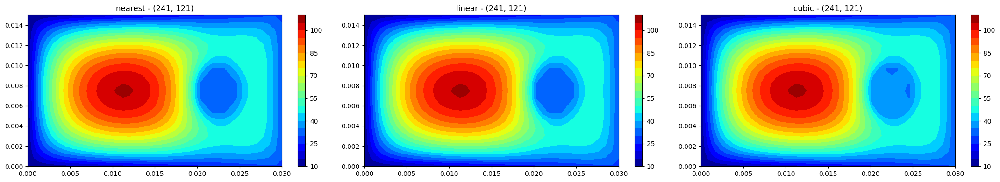

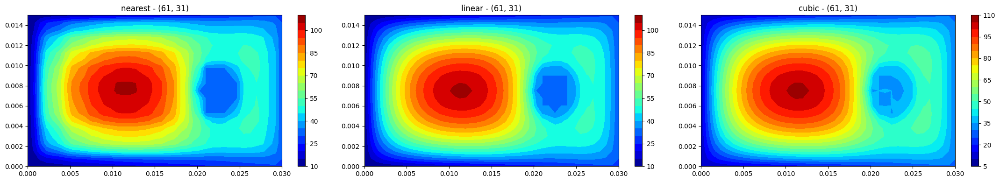

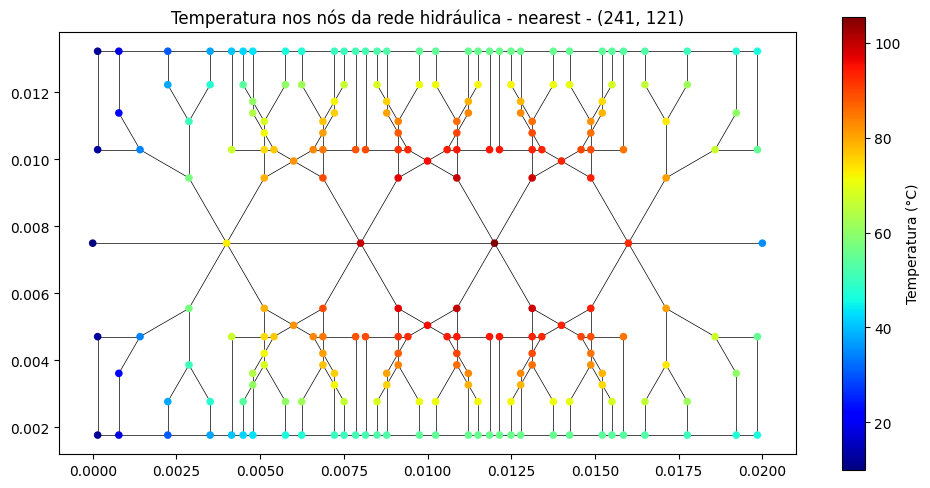

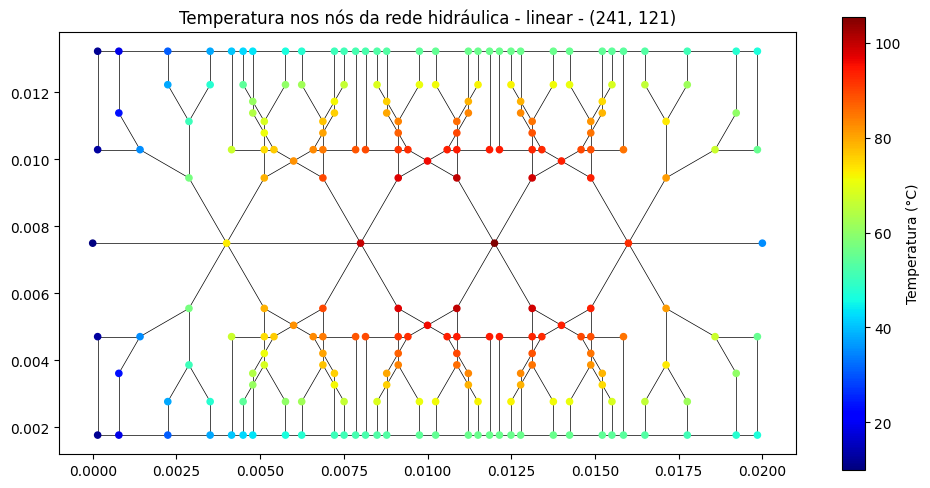

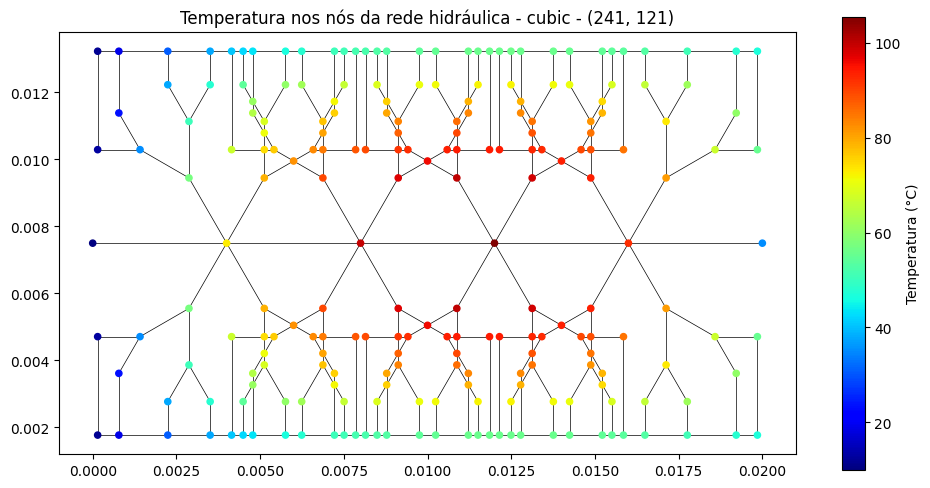

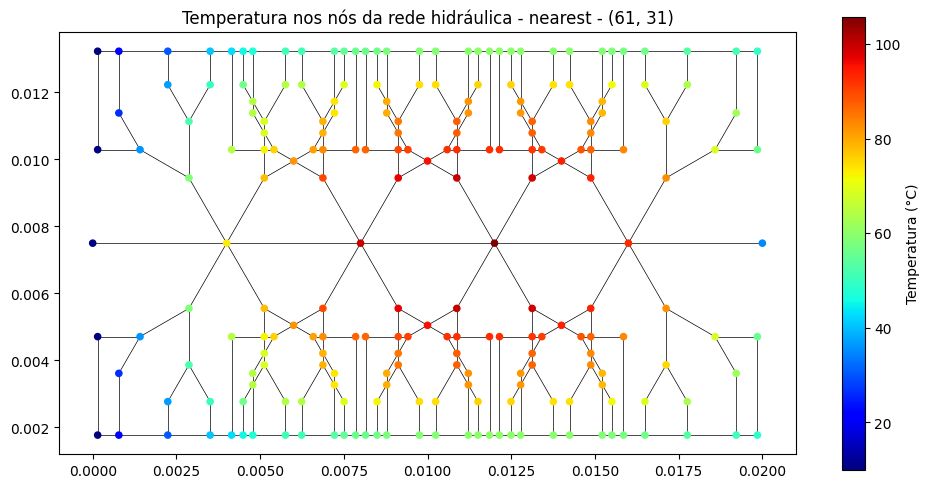

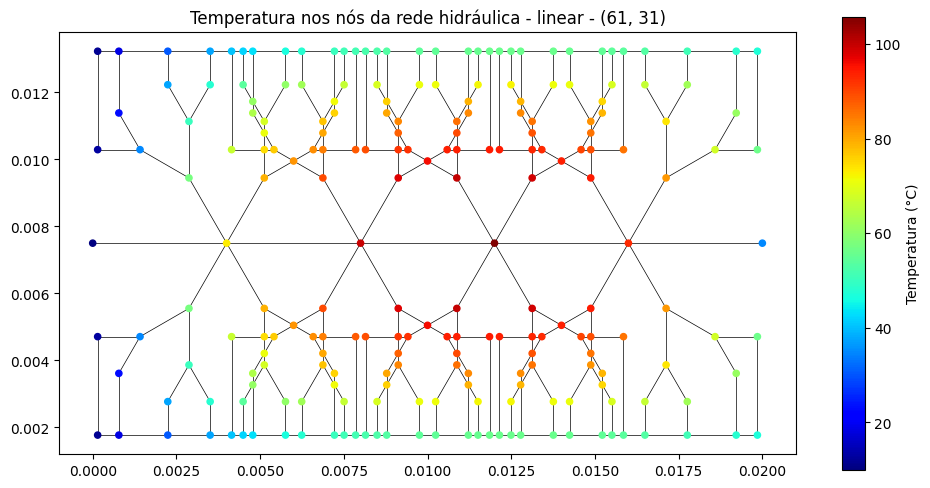

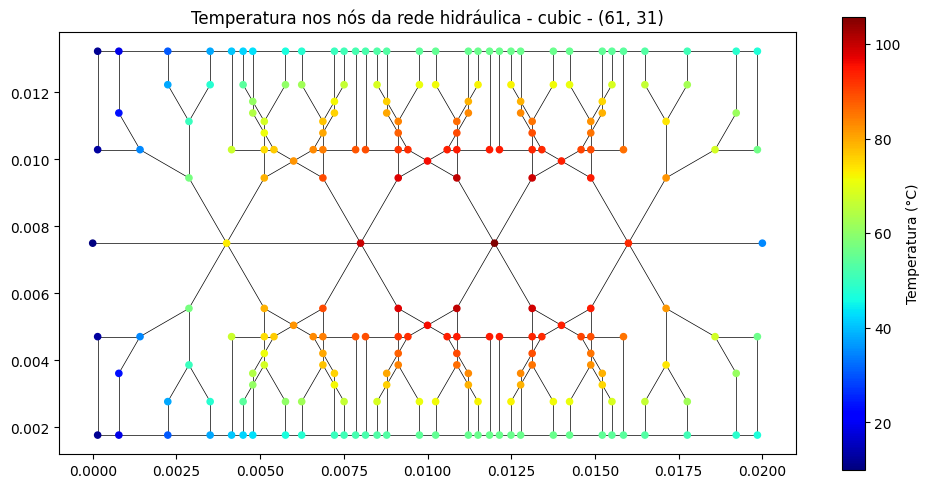

In [32]:
thermal_to_hydraulic = hydraulic_thermal.HydraulicThermal(config_ht)
thermal_to_hydraulic.run_interpolator(plot=True)

Comparando visualmente os três métodos de interpolação, observa-se o padrão esperado a partir da teoria: o método nearest produz um campo em blocos, com contornos visivelmente serrilhados e descontinuidades abruptas nas fronteiras entre células da malha uma consequência inevitável de uma interpolação de ordem 0. Já os métodos linear e cubic produzem contornos suaves e visualmente muito próximos entre si, com o cubic suavizando ligeiramente mais as regiões de maior curvatura do campo (por exemplo, ao redor da inclusão circular, onde o gradiente de temperatura é mais acentuado).

O efeito da resolução da malha térmica é ainda mais evidente do que o efeito do método de interpolação em si: na malha grosseira, até mesmo os métodos linear e cubic apresentam contornos com curvatura menos fiel à física do problema (a informação geométrica precisa simplesmente não está disponível nos nós), enquanto na malha refinada os três métodos convergem visualmente para resultados praticamente indistinguíveis, exceto pela já mencionada descontinuidade do nearest. 

A partir do interpolador montado, calculamos a temperatura média em cada aresta da rede usando as quatro regras de quadratura discutidas acima variando o número de subdivisões $N \in \{1, 10, 100, 1000\}$. Como a solução analítica contínua de $T_k(s)$ ao longo dos canais não é conhecida (apenas o campo interpolado a partir da malha térmica), utiliza-se a solução com $N=1000$ subdivisões como uma referência assintótica de alta exatidão, comparando-se a ela os resultados obtidos com $N$ menores. Isso permite estimar, de forma prática, tanto o erro de integração cometido em cada configuração quanto o tempo de computação associado, o que evidencia o balanço entre precisão e custo discutido anteriormente.


 ESTRATÉGIA MATEMÁTICA PARA ESTIMATIVA DE ERRO DE INTEGRAÇÃO
Como a solução analítica contínua da temperatura ao longo dos canais é desconhecida,
adotou-se a solução altamente refinada com N = 1000 subintervalos como nossa
Referência Assintótica Exata de controle (<T_k>_ref).

O erro de integração cometido em cada cenário (N = 1, 10, 100) foi estimado através
do Erro Absoluto Máximo Global (Norma do Infinito) sobre todas as arestas da rede:

      E_max^(N) = max_k | <T_k>^(N) - <T_k>^(N=1000) |

Onde k representa o índice de cada aresta e <T_k> é a temperatura média calculada.

Regra de Integração  | Subdiv. (N)  | Tempo Exec. (s) | Erro Máx. Estimado
Ponto Médio          | 1            | 0.000289        | 3.2883e+00 °C     
Ponto Médio          | 10           | 0.001129        | 2.0233e-02 °C     
Ponto Médio          | 100          | 0.009500        | 2.0034e-04 °C     
Ponto Médio          | 1000         | 0.094380        | --- (Ref. Exata)  
Trapézio             | 1            | 

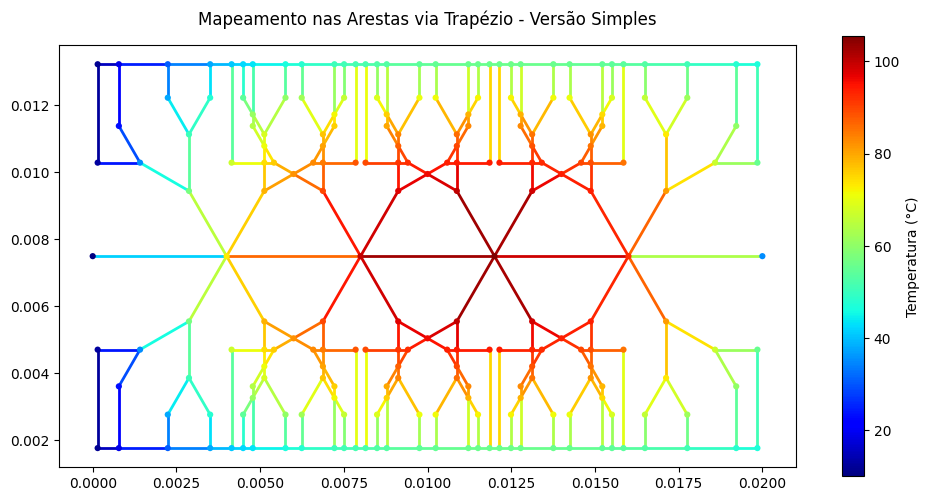

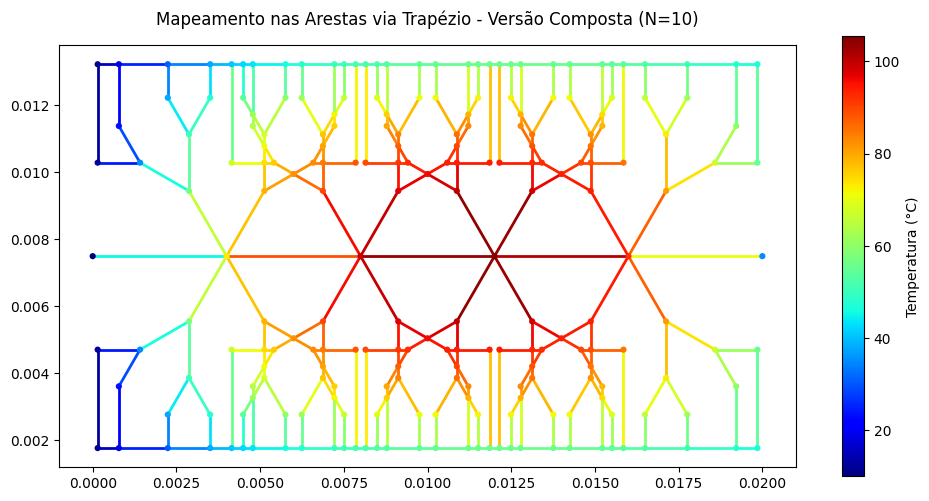

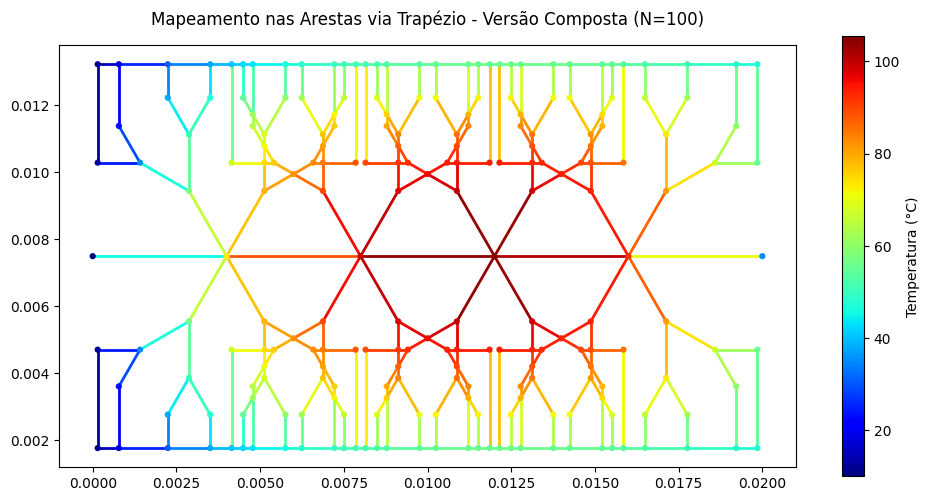

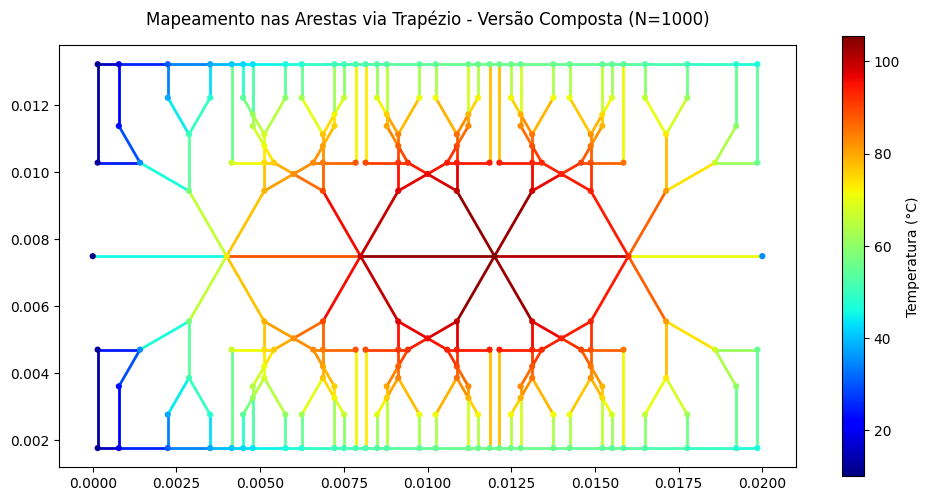

In [33]:
thermal_to_hydraulic.evaluate_coupling(plot=True)

A tabela evidencia claramente o comportamento teórico esperado das regras de quadratura. Analisando a razão entre erros sucessivos ao aumentar $N$ por um fator de 10:

- Ponto médio: o erro cai de $3{,}29\,$ ($N=1$) para $2{,}02\times10^{-2}\,$ ($N=10$) e para $2{,}00\times10^{-4}\,$ ($N=100$), o que configura uma razão de aproximadamente 163x e depois 101x, respectivamente.

- Trapézio: o erro cai de $7{,}63\,$ para $4{,}05\times10^{-2}\,$ e para $4{,}01\times10^{-4}\,$, uma razão de aproximadamente 189x e depois 101x.

A razão próxima de 100x ao aumentar $N$ por um fator de $10$ confirma experimentalmente a convergência quadrática, $O(1/N^2)$, prevista pela teoria para ambas as regras compostas.

Além disso, comparando as duas regras para um mesmo $N$, o erro do trapézio é sistematicamente cerca de **duas vezes maior** que o erro do ponto médio ($7{,}63/3{,}29 \approx 2{,}32$ em $N=1$; $4{,}05/2{,}02 \approx 2{,}00$ em $N=10$; $4{,}01/2{,}00 \approx 2{,}00$ em $N=100$), o que mostra que a regra do ponto médio é a opção mais eficiente entre as duas para este problema.

Do ponto de vista de custo computacional, o tempo de execução cresce de forma aproximadamente linear com $N$ (por exemplo, para o ponto médio: $0{,}0004\,\text{s} \to 0{,}0020\,\text{s} \to 0{,}0142\,\text{s} \to 0{,}1570\,\text{s}$ para $N = 1, 10, 100, 1000$), como esperado, já que cada subdivisão adicional exige uma nova avaliação do interpolador de temperatura. Combinando precisão e custo, $N=100$ já oferece um erro da ordem de $10^{-4}\,$ a um custo de apenas ~14 ms por configuração, tornando-se um excelente ponto de operação: refinar até $N=1000$ traz uma melhoria de precisão que, na prática, não se traduz em nenhuma mudança perceptível nas variáveis hidráulicas globais (pressão e potência), como será visto a seguir.


Conhecendo a temperatura média de cada canal, foi possível resolver o circuito hidráulico da rede, atualizando a condutância de cada aresta $C_k = \kappa_k/L_k$ para levar em conta a viscosidade $\mu(\langle T_k \rangle)$ na hora de montar o sistema linear. Avalia-se, a seguir, de que maneira a escolha da malha térmica (grosseira *vs.* refinada) e da regra de quadratura (incluindo o número de subdivisões $N$) se propagam para as variáveis hidráulicas globais de interesse: a pressão máxima da rede e a potência total dissipada pelo escoamento.

In [34]:
thermal_to_hydraulic.avaliar_impacto_malha_e_quadratura()


 AVALIAÇÃO QUANTITATIVA DO ACOPLAMENTO TERMO-HIDRÁULICO
Malha Térmica        | Regra        | Subdiv. (N)  | Pressão Máx (Pa)   | Potência Total (W)
-------------------------------------------------------------------------------------
Grosseira            | Ponto Médio  | 1            | 1819.29            | 0.001927          
Grosseira            | Ponto Médio  | 10           | 1839.19            | 0.001949          
Grosseira            | Ponto Médio  | 100          | 1839.46            | 0.001950          
Grosseira            | Ponto Médio  | 1000         | 1839.46            | 0.001950          
Grosseira            | Trapézio     | 1            | 1892.87            | 0.002009          
Grosseira            | Trapézio     | 10           | 1840.01            | 0.001950          
Grosseira            | Trapézio     | 100          | 1839.46            | 0.001950          
Grosseira            | Trapézio     | 1000         | 1839.46            | 0.001950          
Refinada            

Tomando o resultado com $N=1000$ como referência convergida para cada combinação de malha/regra, observa-se que a escolha de $N$ deixa de importar a partir de $N \gtrsim 10$: Na malha grosseira, a regra do ponto médio com $N=1$ subestima a pressão máxima em cerca de $1{,}1\%$ ($1819{,}29$ Pa vs. $1839{,}46$ Pa convergidos), enquanto a regra do trapézio com $N=1$ superestima a pressão em cerca de $2{,}9\%$ ($1892{,}87$ Pa). Na malha refinada, o mesmo padrão se repete e se intensifica: $-1{,}8\%$ para o ponto médio simples e $+4{,}5\%$ para o trapézio simples. Já a partir de $N=10$, ambas as regras já concordam com a referência com menos de $0{,}1\%$ de desvio, confirmando que poucas subdivisões já são suficientes para garantir a exatidão das grandezas hidráulicas globais, mesmo que a integral de cada aresta isolada ainda não esteja plenamente convergida.

Nota-se também que a escolha da malha térmica tem um impacto maior do que a escolha da regra de quadratura. Comparando os valores plenamente convergidos ($N=1000$) entre a malha grosseira e a malha refinada, a pressão máxima sobe de $1839{,}46$ Pa para $1929{,}50$ Pa, um aumento de  aproximadamente $4{,}9\%$, e a potência total segue a mesma tendência proporcional ($0{,}00195$ W $\to$ $0{,}00205$ W). Como a viscosidade do fluido, $\mu(T)$, é uma função decrescente da temperatura, uma pressão máxima mais alta na malha refinada é consistente com uma viscosidade média efetivamente maior ao longo dos canais, ou seja, a malha térmica refinada está associando aos canais, em média, temperaturas mais baixas do que a malha grosseira, cujo processo de interpolação a partir de poucos nós tende a suavizar (e nivelar) picos e vales do campo de temperatura em direção a um valor médio mais ameno. Esse resultado reforça que o refinamento da malha térmica é o fator com maior peso a se investir computacionalmente, mais do que a escolha entre ponto médio e trapézio ou o número de subdivisões acima de $N \approx 10$.


<a id="cap4-8"></a>
##### Discussão complementar: média de temperatura *vs.* média de viscosidade
 
- O Problema da Abordagem Clássica
 
A abordagem tradicionalmente adotada consiste em calcular a temperatura média $\langle T_k \rangle$ da aresta e avaliar a viscosidade uma única vez nesse valor médio: $\mu(\langle T_k \rangle)$. No entanto, a viscosidade dinâmica da água é descrita por uma relação não linear com a temperatura:
 
$$\mu(T) = \frac{0.001791}{1 + 0.03368\,T + 0.000221\,T^2} $$
 
- Abordagem Proposta: Integração Direta
 
Em vez de avaliar a média da temperatura e aplicar a lei constitutiva, propõe-se calcular a viscosidade local em cada ponto de discretização e então obter o seu valor médio integrado na aresta:
 
$$\langle \mu_k \rangle = \frac{1}{\ell_k} \int_0^{\ell_k} \mu\!\left(T_k(p(s))\right) ds $$
 
Numericamente, aplicando a Regra do Trapézio composta, obtemos:
 
$$\langle \mu_k \rangle \approx \frac{1}{N} \sum_{n=1}^{N} \mu\!\left(T_k(s_n)\right) $$
 


<a id="cap4-9"></a>
#### Influência dos microcanais na placa térmica

Observando agora o efeito inverso do acoplamento, a influência da rede hidráulica sobre a placa térmica, a rede de microcanais impacta o comportamento térmico da placa por meio de dois mecanismos físicos distintos, que serão investigados separadamente sob a hipótese de acoplamento fraco (o campo de pressão/vazão da rede permanece fixo enquanto se resolve o problema térmico):

1. Modificação da condutividade térmica: na vizinhança dos canais, o material ao redor de um microcanal de qualquer material com maior condutividade que o da placa tende a conduzir calor mais eficientemente que o restante da placa.
2. Introdução de um termo fonte (geração) ou sumidouro (extração) de calor: cenário associado a trocas de calor do fluido com a placa ao longo do trajeto do canal.

<a id="cap4-10"></a>
##### Influência na condutividade

Para incorporar o primeiro mecanismo, é necessário identificar quais arestas da rede hidráulica se encontram geometricamente próximas de cada ponto onde a condutividade da placa precisa ser avaliada durante a montagem da matriz do sistema linear de condução de calor. Como a condutividade térmica é o parâmetro central na definição dos fluxos, para cada nó $(i,j)$ da malha o coeficiente $k$ deve ser estimado nas quatro posições de interface (oeste, leste, sul, norte) que circundam o volume de controle.

Adota-se a premissa física de que apenas os microcanais posicionados dentro de um raio de corte $d_{max}$ em relação ao ponto de interesse exercem influência sobre a condutividade local. Como tanto a malha de discretização da placa quanto a rede hidráulica podem conter milhares de nós e arestas, essa busca espacial (encontrar, para cada ponto da grade, quais arestas da rede estão a uma distância menor que $d_{max}$) precisa ser implementada de forma computacionalmente eficiente que evita o custo de uma busca por força bruta $O(N_{grade}\times N_{arestas})$.

Uma vez mapeadas as arestas vizinhas de cada face, a condutividade térmica modificada na face $f$ é calculada como:

$$ k_f = k_0 \left(1 + \sum_{j \in \mathcal{V}_f} \frac{1}{1+d_j}\right) $$

onde $k_0 = 0{,}25\;\text{W}\cdot\text{K}^{-1}\cdot\text{m}^{-1}$ é a condutividade nominal do material original da placa, $\mathcal{V}_f$ é o conjunto de todas as arestas da rede que se encontram na vizinhança (dentro do raio $d_{max}$) do ponto médio da face $f$, e $d_j$ é a menor distância euclidiana entre esse ponto médio e a $j$-ésima aresta vizinha. Note que, como cada termo $1/(1+d_j)$ é estritamente positivo, a presença de microcanais sempre aumenta a condutividade local em relação ao valor nominal $k_0$, e esse aumento é tanto maior quanto mais próximos (menor $d_j$) e mais numerosos forem os canais dentro do raio de
corte. Consequentemente, espera-se que aumentar $d_{max}$ amplie tanto a região espacial afetada (mais pontos da grade passam a enxergar pelo menos um canal próximo) quanto a magnitude do reforço de condutividade em cada ponto (mais arestas entram na soma $\mathcal{V}_f$ simultaneamente), suavizando gradualmente a transição entre a região "canalizada" (condutividade efetiva elevada) e o substrato original.

Também imagina-se que refinar a malha computacional da placa permita resolver com mais fidelidade geométrica a extensão espacial exata dessa região de condutividade aumentada, já que malhas grosseiras podem tanto "perder" canais estreitos que caem entre dois nós consecutivos quanto atribuir uma influência artificialmente larga a canais que, na realidade, afetam apenas uma vizinhança estreita.

Segue abaixo a aplicação da rotina que calcula a condutividade modificada e resolve o problema térmico resultante, variando o raio de corte $d_{max} \in \{0{,}00025,\ 0{,}0005,\ 0{,}001\}\,$ e a malha computacional entre $(61,31)$, $(121,61)$ e $(241,121)$ pontos.


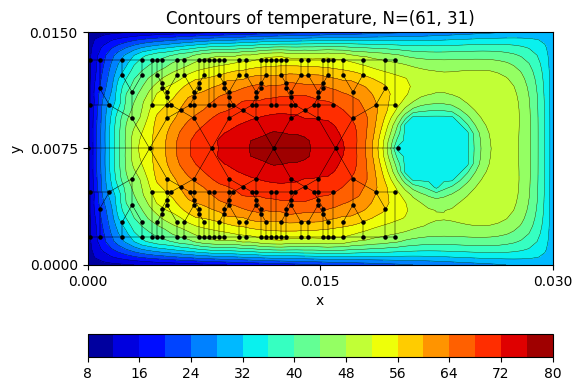

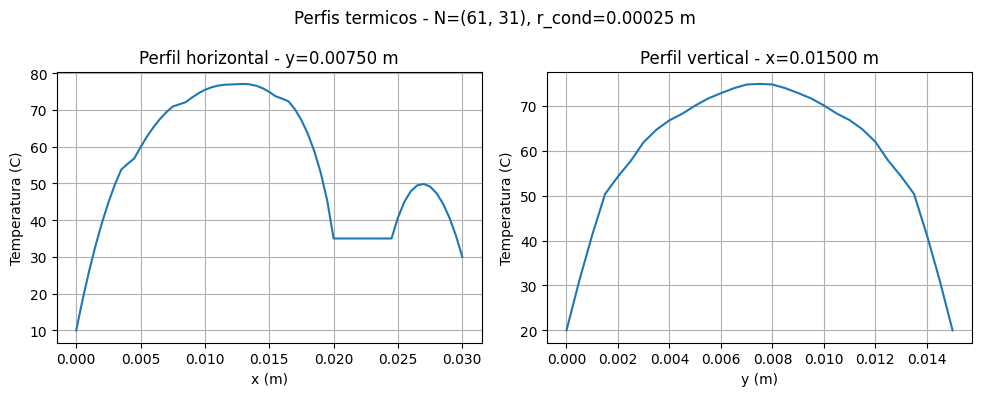

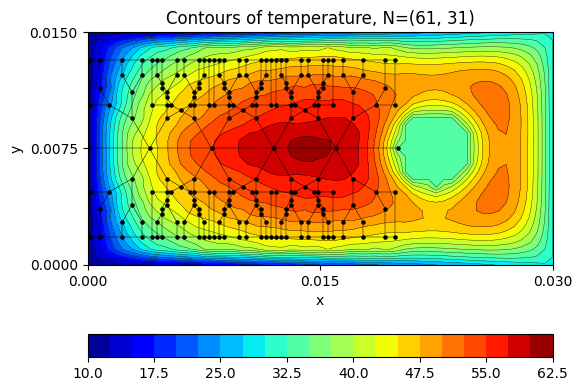

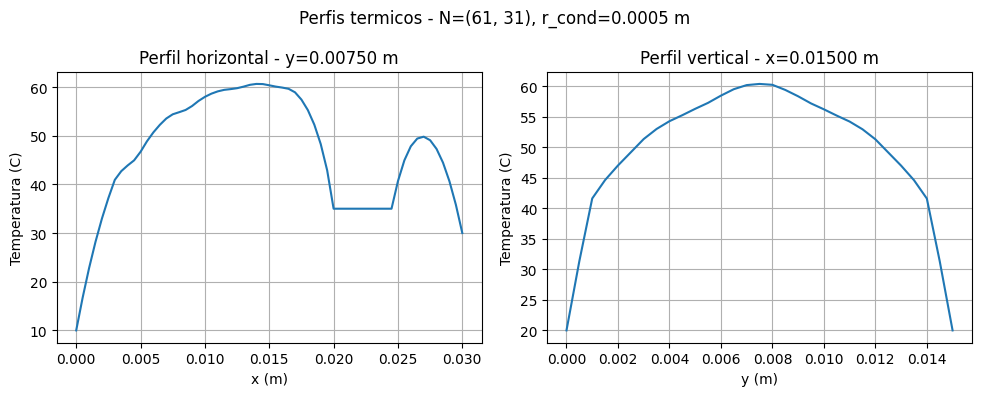

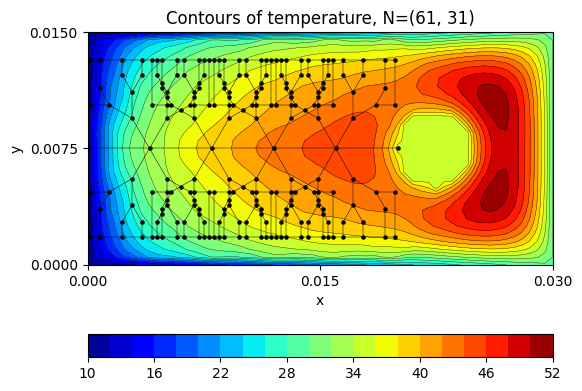

...

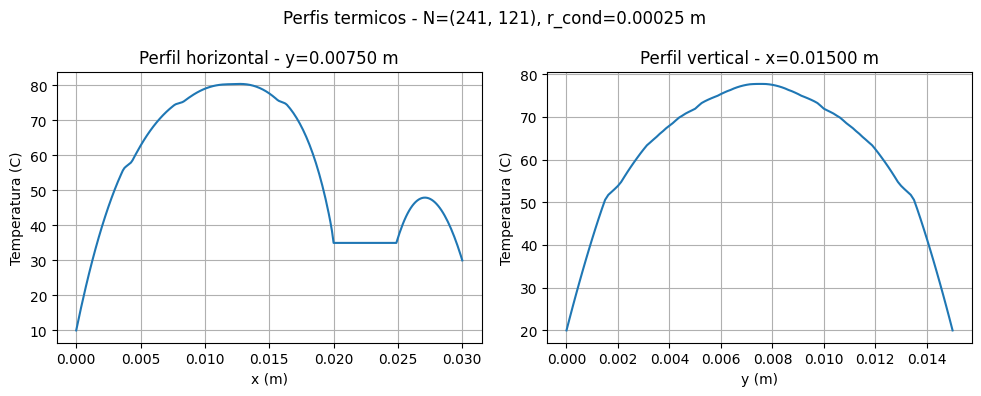

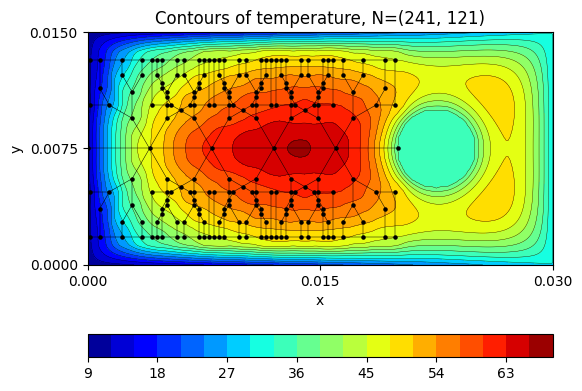

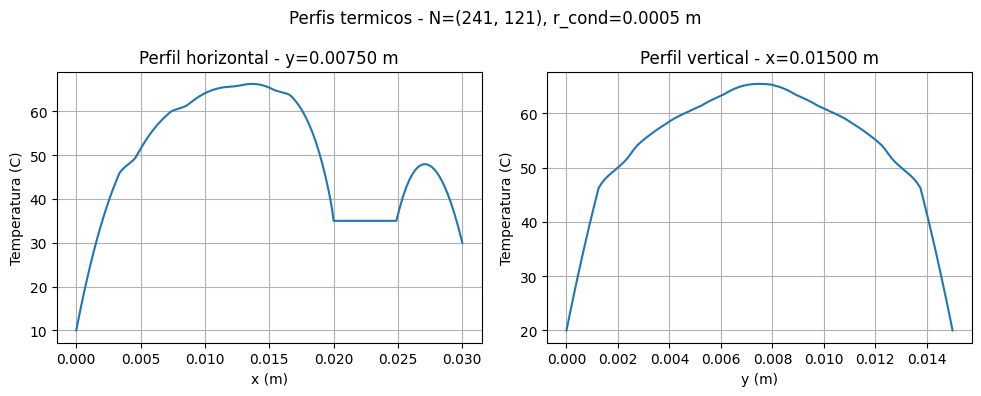

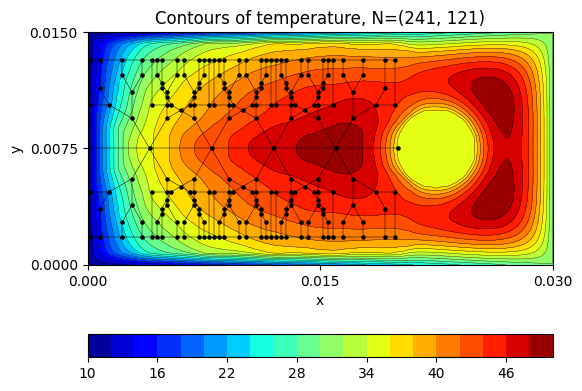

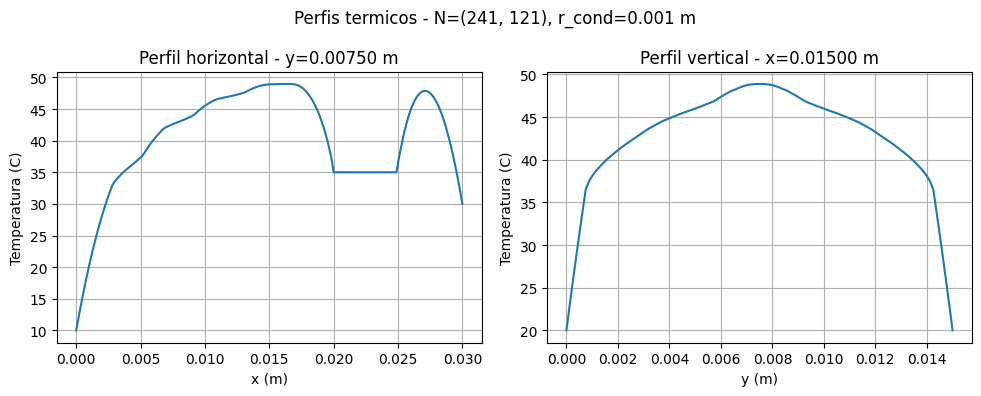


RESULTADOS - PROBLEMA 1 / PARTE 2

    Nx     Ny   r_cond (m)     Tmax (C)  k_faces (s) assembly (s)  solve (s)  total (s)
----------------------------------------------------------------------------------------
    61     31      0.00025      77.0438       0.0740       0.0061     0.0044     0.0846
    61     31       0.0005      60.6347       0.0726       0.0066     0.0044     0.0836
    61     31        0.001      50.9357       0.1345       0.0064     0.0044     0.1452
   121     61      0.00025      77.9849       0.2181       0.0233     0.0213     0.2627
   121     61       0.0005      64.7352       0.2679       0.0233     0.0214     0.3127
   121     61        0.001      49.8410       0.5527       0.0236     0.0211     0.5974
   241    121      0.00025      80.4229       0.7741       0.0912     0.1305     0.9958
   241    121       0.0005      66.2396       1.0643       0.0933     0.1383     1.2960
   241    121        0.001      49.5113       2.3340       0.0955     0.1516     2.

In [35]:
hydraulic_to_thermal = hydraulic_thermal.Hydraulic_to_Thermal(config_ht)
hydraulic_to_thermal.run_problem1(plot= True, print_info=True);


Os mapas de contorno e os perfis unidimensionais gerados para as nove combinações de raio de corte e malha computacional confirmam a tendência prevista: quanto maior o raio de corte $d_{max}$, mais larga e mais intensa é a região de condutividade elevada ao redor de cada canal, já que mais arestas passam a contribuir simultaneamente para a soma $\sum_j 1/(1+d_j)$ em cada face avaliada (o
padrão de "auréola" de alta condutividade em torno da rede se torna visivelmente mais espesso ao se comparar $d_{max}=0{,}00025$ m com $d_{max}=0{,}001$ m). Como a condutividade mais alta favorece a difusão de calor para fora das regiões mais quentes, o efeito líquido esperado é uma leve redução do pico de temperatura e um perfil termicamente mais uniforme (menos escarpado) nas seções transversais que cruzam a vizinhança dos canais, à medida que $d_{max}$ cresce.

Quanto ao refinamento espacial da malha, o efeito observado é mais sutil: em malhas grosseiras $(61,31)$, a região de condutividade modificada é representada por poucos nós, de modo que a transição entre a região "canalizada" e o substrato original aparece com contornos mais angulosos, sem capturar fielmente a geometria real (radialmente suave) implícita. Já nas malhas mais finas $(121,61)$ e, principalmente, $(241,121)$, os contornos capturam de forma mais suave e geometricamente fiel a extensão da região de influência de cada canal, aproximando-se de uma solução convergida à medida que $h \to 0$.


<a id="cap4-11"></a>
##### Influência no termo fonte e sumidouro

Considera-se agora o segundo mecanismo de acoplamento: o cenário em que o escoamento no interior dos microcanais é acompanhado por reações químicas que liberam (exotérmicas) ou absorvem (endotérmicas) energia térmica. Fisicamente, esse fenômeno requer a inclusão de uma parcela adicional ao termo fonte original do problema de condução na placa, cuja intensidade também é modelada em função da distância geométrica entre os nós da grade e os microcanais, reaproveitando a mesma estrutura de busca espacial (raio de corte ${d_max}$) já construída para o cálculo da condutividade modificada. Adota-se a seguinte formulação, baseada em um perfil gaussiano de
decaimento espacial:

$$ S_p = S_0 \sum_{j \in \mathcal{V}_p} I_j \cdot \exp\!\left(-\frac{d_j^2}{2\sigma^2}\right) $$

onde $\mathcal{V}_p$ é o conjunto de arestas da rede hidráulica situadas dentro do raio de corte $d_{max}$ em relação ao ponto $p$ da grade, $S_0$ é a intensidade base da fonte, e $I_j$ quantifica a intensidade específica (relativa) da fonte associada à aresta $j$. O parâmetro de espalhamento é definido como $\sigma = d_{max}/2$, de modo que, a uma distância igual a $d_{max}$, a contribuição de uma aresta já decaiu para $\exp(-2) \approx 0{,}135$ (cerca de $13{,}5\%$ do seu valor de pico), tornando-se progressivamente desprezível à medida que se aproxima do limite externo de influência, e garantindo uma transição suave (sem descontinuidades bruscas) entre a região diretamente afetada por um canal e o restante da placa.

Diferentemente da condutividade modificada, que é sempre um reforço positivo, o termo fonte $S_p$ pode ser positivo (fonte de calor, $S_0>0$, reação exotérmica) ou negativo (sumidouro de calor, $S_0<0$, reação endotérmica), permitindo tanto aquecer quanto resfriar localmente a placa na vizinhança da rede. Duas distribuições distintas são investigadas para o coeficiente de intensidade relativa $I_j$:

- Distribuição homogênea ($I_j = 1,\ \forall j$): Todas as arestas da rede contribuem igualmente para o termo fonte/sumidouro, representando uma reação química com taxa uniforme ao longo de toda a rede de microcanais.
- Distribuição heterogênea ($I_j = 100$ para as arestas que integram o alinhamento central/espinha principal da rede, e $I_j = 0{,}1$ para as arestas remanescentes): um cenário em que a reação é fortemente concentrada no canal principal (por exemplo, por conter maior vazão ou maior concentração de reagente), tornando os canais secundários praticamente inertes em comparação.

A seguir, avalia-se o comportamento do sistema sob seis intensidades de base $S_0 \in \{\pm10^5,\ \pm5\times10^5,\ \pm10^6\}\,\text{W}\cdot\text{m}^{-3}$, combinadas com as duas distribuições de $I_j$ descritas acima (totalizando doze cenários), reportando para cada um os mapas de temperatura, os valores máximo e mínimo de temperatura na placa, e os perfis térmicos ao longo de seções horizontais e verticais estratégicas do domínio.



                       RESULTADOS - PROBLEMA 2                        
        S0 |    Distribuição |      T_max (°C) |      T_min (°C)
----------------------------------------------------------------------
   1.0e+05 |       homogenea |         35.0000 |         10.0000


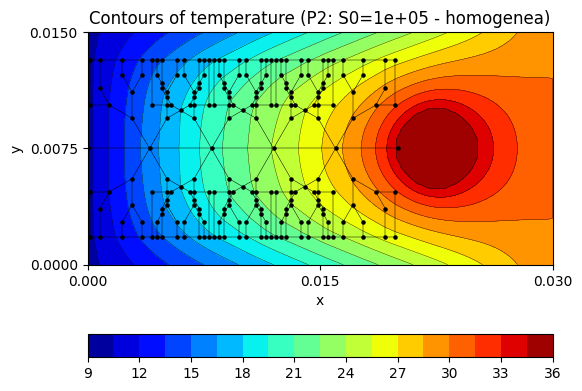

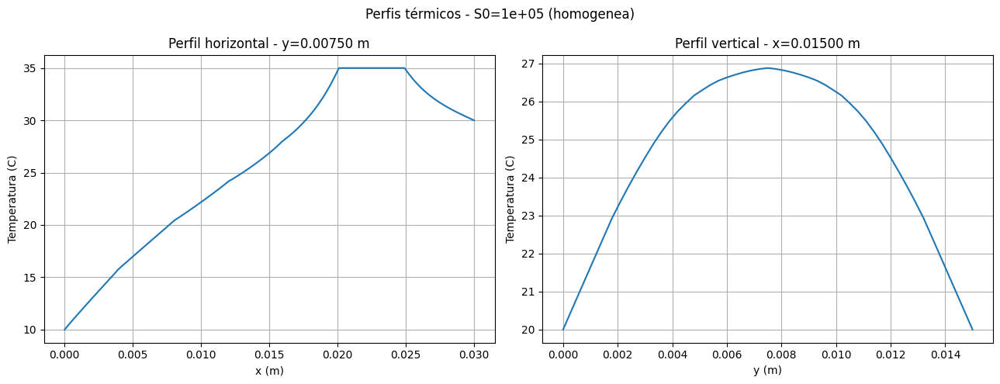

   1.0e+05 |     heterogenea |         60.2301 |         10.0000


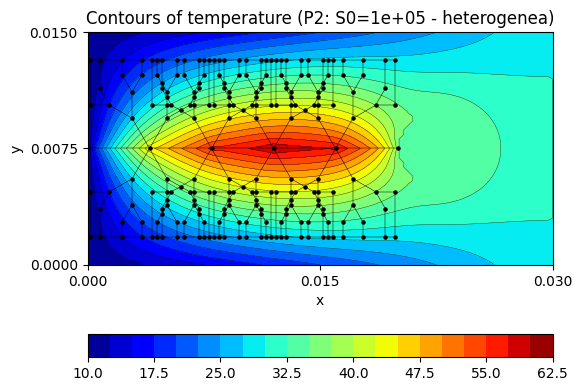

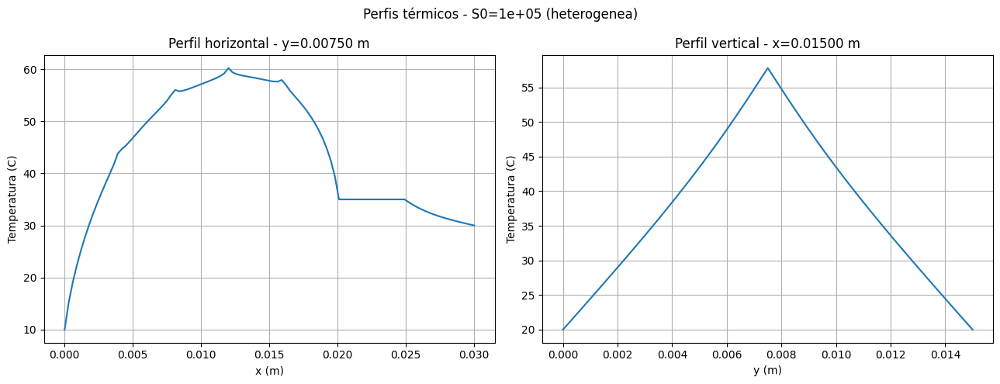

  -1.0e+05 |       homogenea |         35.0000 |          9.9338


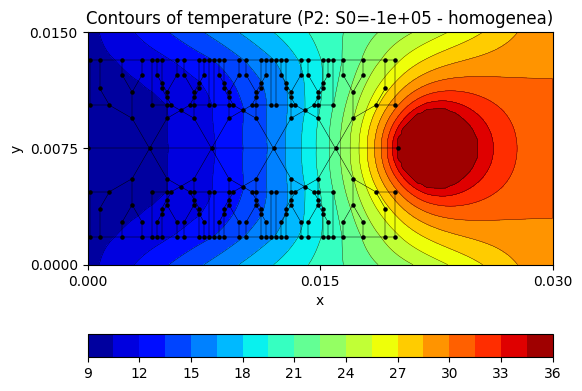

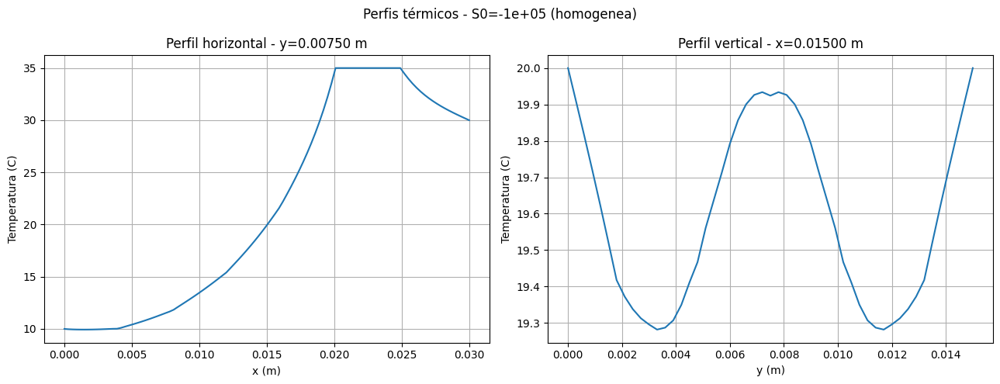

  -1.0e+05 |     heterogenea |         35.0000 |        -23.6939


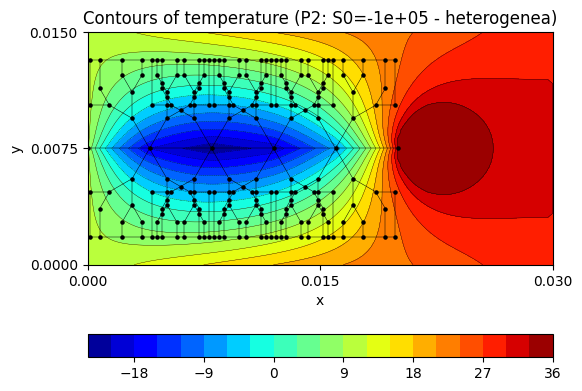

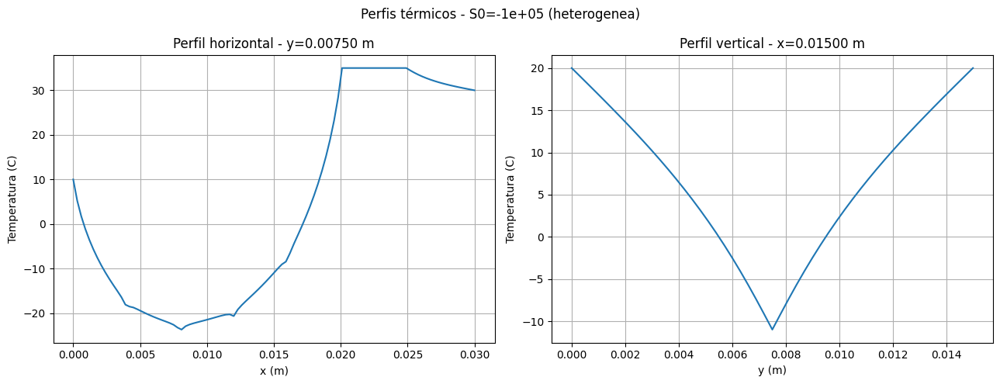

   5.0e+05 |       homogenea |         41.6958 |         10.0000


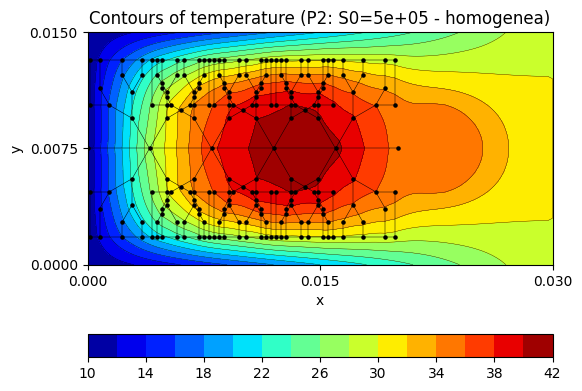

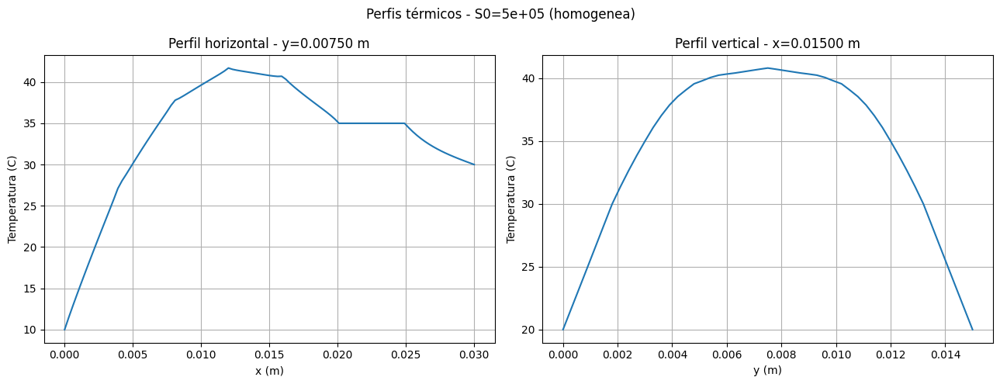

   5.0e+05 |     heterogenea |        222.0156 |         10.0000


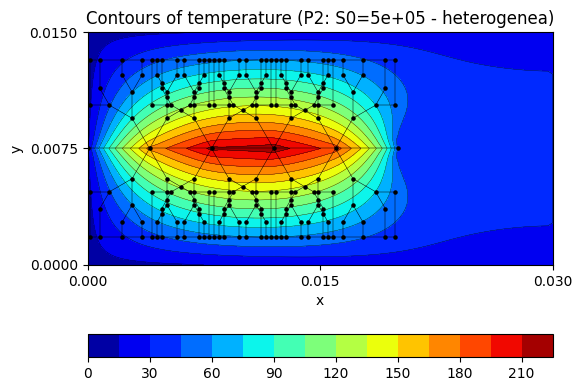

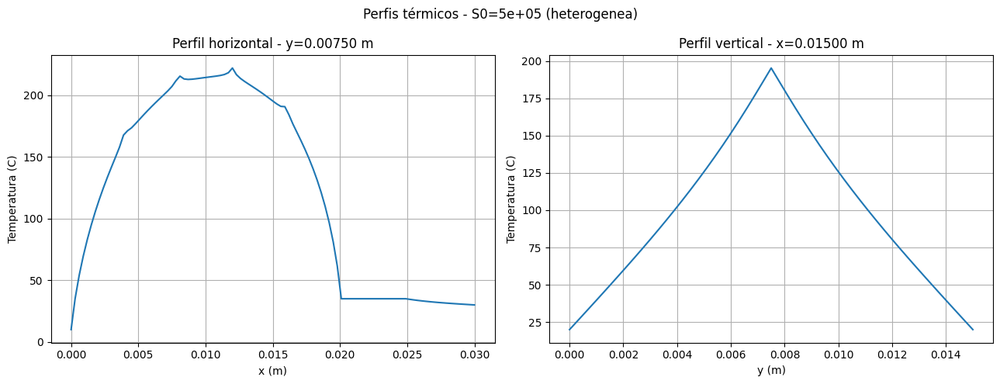

  -5.0e+05 |       homogenea |         35.0000 |         -5.4696


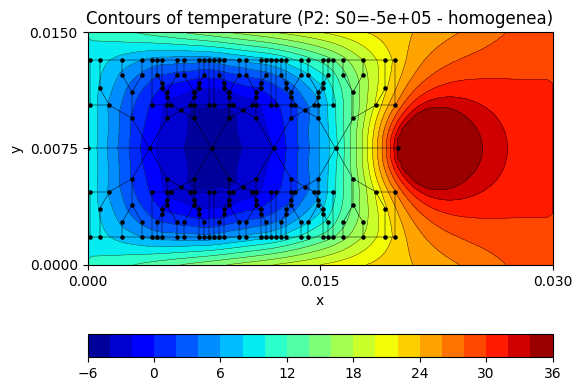

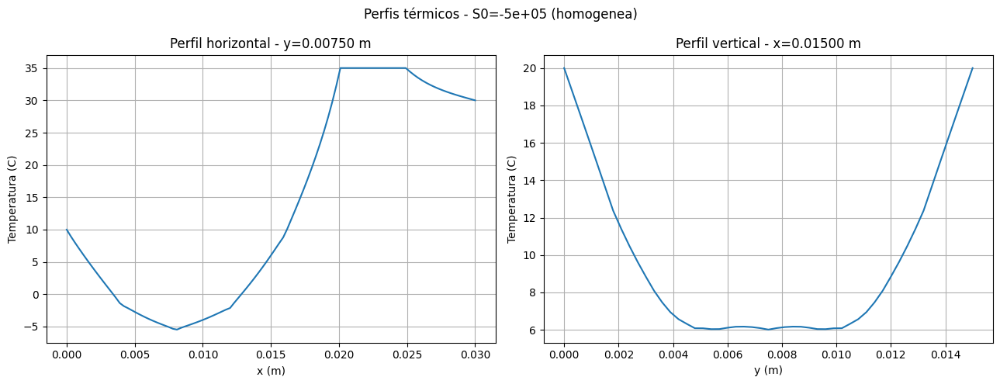

  -5.0e+05 |     heterogenea |         35.0000 |       -183.1244


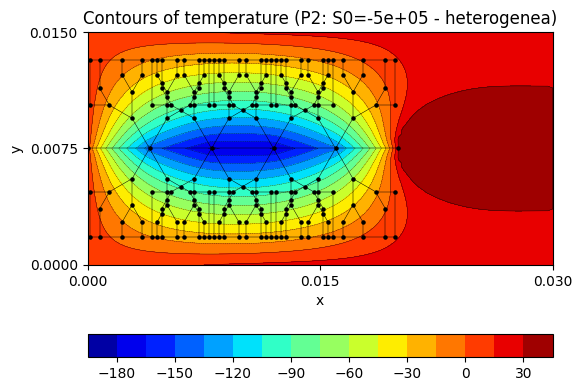

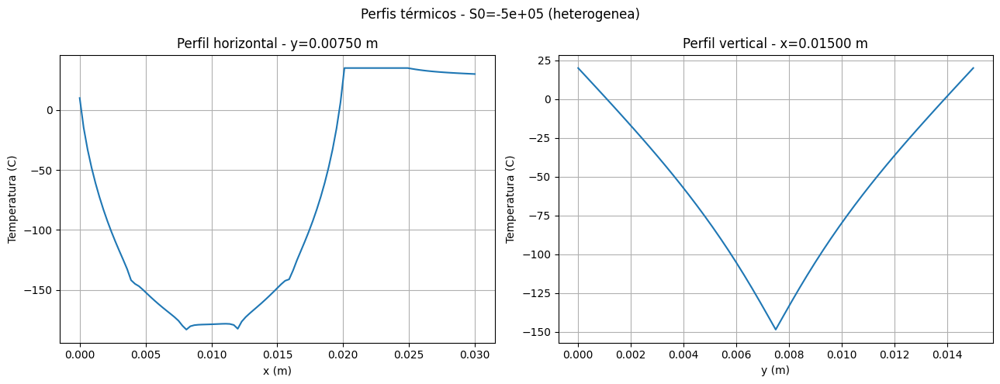

   1.0e+06 |       homogenea |         63.6079 |         10.0000


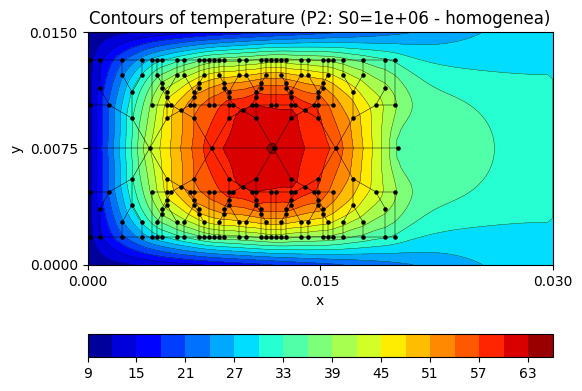

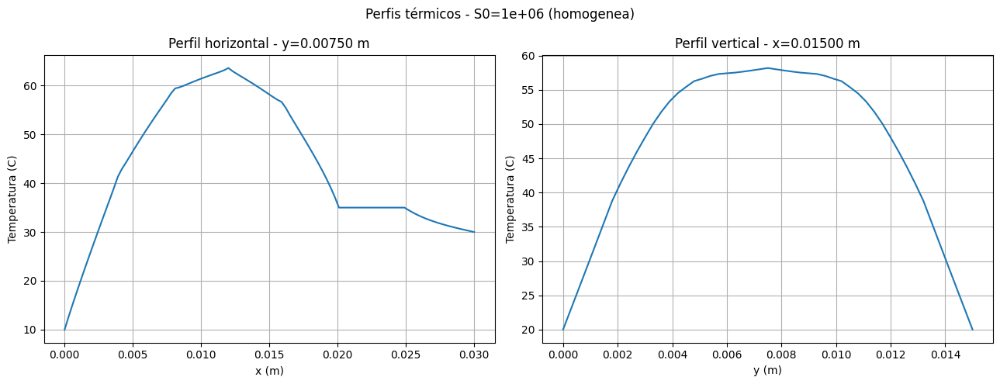

   1.0e+06 |     heterogenea |        424.2475 |         10.0000


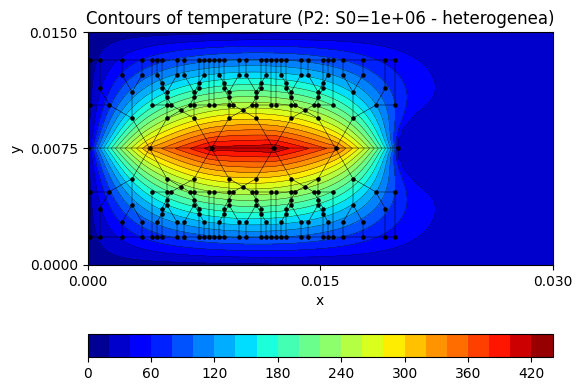

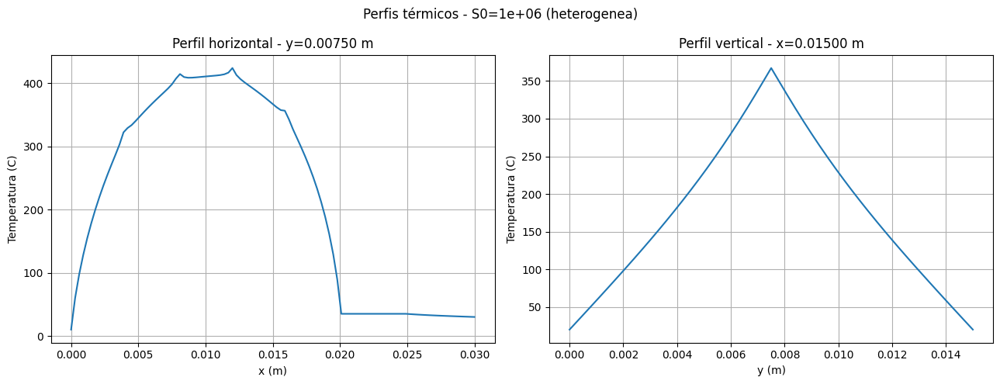

  -1.0e+06 |       homogenea |         35.0000 |        -27.1030


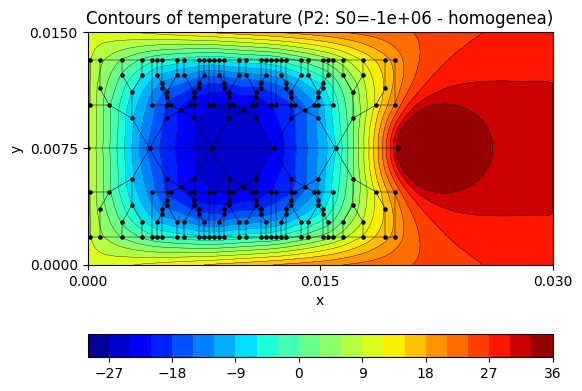

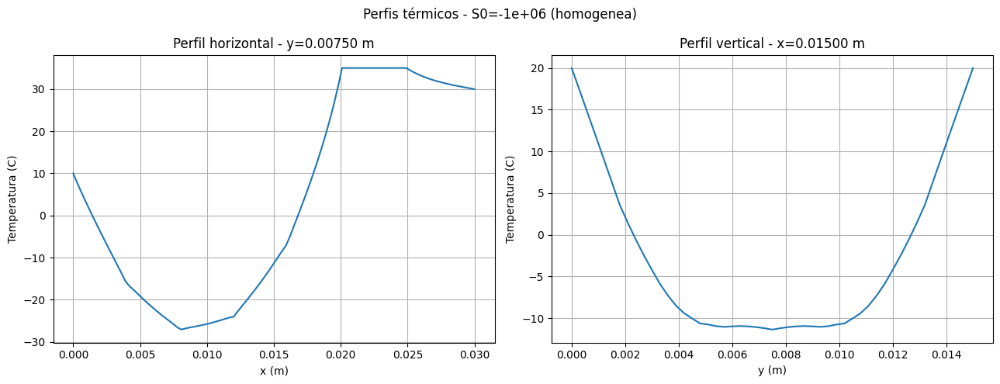

  -1.0e+06 |     heterogenea |         35.0000 |       -384.6801


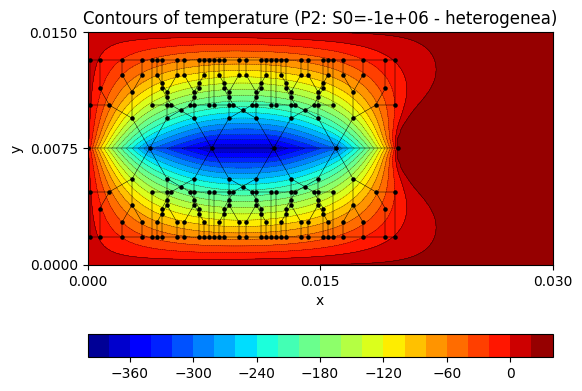

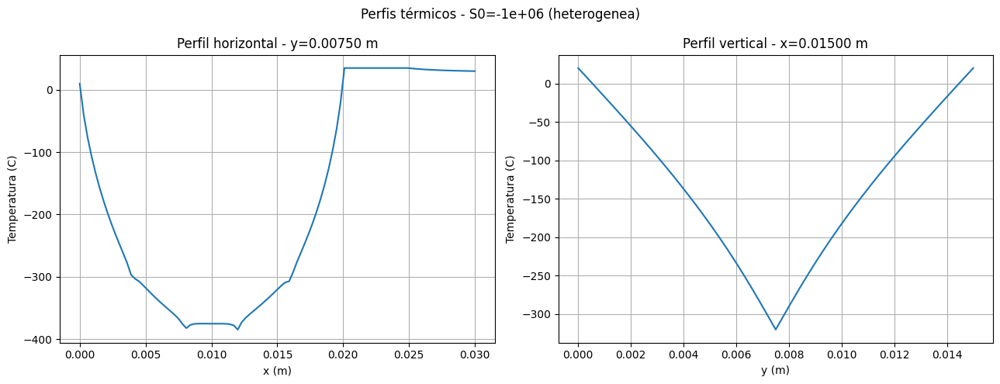

In [36]:
hydraulic_to_thermal = hydraulic_thermal.Hydraulic_to_Thermal_P2_circulo(config_ht)
hydraulic_to_thermal.run_problem2(plot=True);


A tabela produzida ao longo da simulação permite quantificar precisamente o efeito de cada combinação de $S_0$ e distribuição de $I_j$ sobre os extremos de temperatura da placa:

| $S_0$ (W/m³) | Distribuição | $T_{max}$ (°C) | $T_{min}$ (°C) |
|---:|:---|---:|---:|
| $+1{,}0\times10^5$ | homogênea   | 35,00 | 10,00 |
| $+1{,}0\times10^5$ | heterogênea | 60,23 | 10,00 |
| $-1{,}0\times10^5$ | homogênea   | 35,00 | 9,93 |
| $-1{,}0\times10^5$ | heterogênea | 35,00 | -23,69 |
| $+5{,}0\times10^5$ | homogênea   | 41,70 | 10,00 |
| $+5{,}0\times10^5$ | heterogênea | 222,02 | 10,00 |
| $-5{,}0\times10^5$ | homogênea   | 35,00 | -5,47 |
| $-5{,}0\times10^5$ | heterogênea | 35,00 | -183,12 |
| $+1{,}0\times10^6$ | homogênea   | 63,61 | 10,00 |
| $+1{,}0\times10^6$ | heterogênea | 424,25 | 10,00 |
| $-1{,}0\times10^6$ | homogênea   | 35,00 | -27,10 |
| $-1{,}0\times10^6$ | heterogênea | 35,00 | -384,68 |

Nota-se que fontes positivas elevam $T_{max}$ e preservam $T_{min}$ enquanto sumidouros negativos reduzem $T_{min}$ e preservam $T_{max}$. Isso é fisicamente coerente: um termo adicional puramente positivo só pode aumentar a temperatura em relação ao caso sem o termo, logo o mínimo global da placa permanece ancorado nas condições de contorno mais frias ($T_L=10\,$). Simetricamente, um termo puramente negativo só reduz a temperatura, deixando o máximo ancorado na condição de contorno mais quente (a inclusão circular a $T_C=35\,$, ou $T_R=30\,$).

Ainda mais, percebe-se que a distribuição heterogênea amplifica drasticamente o efeito em comparação à homogênea, para a mesma intensidade $S_0$. Por exemplo, em $S_0=+5\times10^5$, a distribuição homogênea eleva $T_{max}$ de $35\,$ para apenas $41{,}70\,$ (um acréscimo de $6{,}7\,$), enquanto a distribuição heterogênea o eleva para $222{,}02\,$ (um acréscimo de 187), quase 28 vezes maior. Isso ocorre porque, na distribuição heterogênea, a intensidade relativa $I_j=100$ concentrada ao longo da espinha central produz um termo fonte muito mais intenso localmente (apesar de $I_j=0{,}1$ atenuar os canais secundários), criando um ponto quente pronunciado, em vez de distribuir a mesma energia total de forma difusa por toda a rede.

Além disso, a resposta em $\Delta T$ não é estritamente proporcional a $S_0$ nos casos homogêneos de baixa intensidade, mas tende à linearidade conforme $|S_0|$ cresce. No caso homogêneo positivo, por exemplo, $\Delta T_{max}$ vale $0$, $6{,}7$ e $28{,}6\,$ para $S_0=10^5,\,5\times10^5,\,10^6$, respectivamente, claramente não proporcional entre o primeiro e o segundo ponto, mas a razão entre o segundo e o terceiro ($28{,}6/6{,}7\approx4{,}3$) já se aproxima mais da razão esperada entre as intensidades ($10^6/5\times10^5=2$). Esse comportamento sugere que, para intensidades pequenas, o efeito da reação é parcialmente "absorvido" pela dinâmica de condução já existente (dominada pelas condições de contorno fixas e pela fonte de calor original da placa, $5\times10^5\,\text{W}\cdot\text{m}^{-3}$), e só se torna dominante (e portanto aproximadamente linear, como esperado de uma equação de condução linear com termo fonte aditivo), quando $S_0$ é grande o suficiente para superar essa dinâmica de base. Esse efeito de quase-linearização em alta intensidade é ainda mais nítido na distribuição heterogênea negativa: a razão entre $\Delta T_{min}$ em $S_0=-10^6$ e $S_0=-5\times10^5$ é $394{,}68/193{,}12\approx2{,}04$, muito próxima da razão de intensidades ($2{,}0$) esperada em regime linear.

Observa-se também que os sumidouros (S₀ negativo) produzem, em módulo, desvios de temperatura ainda mais extremos que as fontes de mesma magnitude na distribuição heterogênea. Por exemplo, $\Delta T_{min} \approx -384{,}7\,$ para $S_0=-10^6$ heterogêneo, contra $\Delta T_{max} \approx +389{,}25\,$ para $S_0=+10^6$ heterogêneo, valores de magnitude muito próxima, como esperado de uma equação de condução linear (onde a resposta a $-S_0$ deveria ser, em primeira aproximação, o negativo exato da resposta a $+S_0$, já que o termo fonte entra aditivamente no sistema linear). 

Esses resultados evidenciam que, caso reações químicas concentradas (como as representadas pela distribuição heterogênea) venham a ocorrer no canal principal da rede, o impacto térmico sobre a placa pode ser ordens de grandeza mais severo do que o previsto por um
modelo que assuma, por simplificação, uma distribuição homogênea da reação ao longo de toda a rede.


<a id="cap5"></a>
## Capítulo 5: Simulação do Acoplamento Hidráulico-Mecânico


Para atingir um modelo computacional realista, é necessário, primeiramente, analisar a matemática que rege o problema. Portanto, como primeiro passo, deve-se deduzir a equação que molda o problema:

$$M\left(\frac{v^{n+1} - v^n}{\delta t}\right) + \left(\beta M + \frac{h}{2}U^T A^{-1}U\right)v^{n+1} + Kw^{n+1} = U^T A^{-1}b^{n+1}$$

<a id="cap5-2"></a>
##### As equações mecânicas e hidráulicas são resolvidas simultaneamente por meio de um sistema global:

$$
\mathbf{A}_{\mathrm{global}} \, \mathbf{x}^{n+1} = \mathbf{b}
$$

<a id="cap5-3"></a>
##### Que pode ser escrito como:

$$
\begin{bmatrix}
\frac{1}{\delta t}I & -I & 0 \\
K & \frac{1}{\delta t}M + D & -U^T \\
0 & \frac{h}{2}U & A
\end{bmatrix}
\begin{bmatrix}
w^{n+1} \\ v^{n+1} \\ p^{n+1}
\end{bmatrix}
=
\begin{bmatrix}
\frac{1}{\delta t}w^n \\
\frac{1}{\delta t}Mv^n \\
b^{n+1}
\end{bmatrix}
$$
 
$$\frac{1}{\delta t}w^{n+1} - v^{n+1} = \frac{1}{\delta t}w^n \tag{I}$$
 
$$Kw^{n+1} + \left(\frac{1}{\delta t}M + D\right)v^{n+1} - U^T p^{n+1} = \frac{1}{\delta t}Mv^n \tag{II}$$
 
$$\frac{h}{2}Uv^{n+1} + Ap^{n+1} = b^{n+1} \tag{III}$$
 
<a id="cap5-4"></a>
##### Passo 1: Isolar $p^{n+1}$ a partir da equação (III)
 
$$Ap^{n+1} = b^{n+1} - \frac{h}{2}Uv^{n+1}$$
 
$$p^{n+1} = A^{-1}\left(b^{n+1} - \frac{h}{2}Uv^{n+1}\right)$$
 
<a id="cap5-5"></a>
##### Passo 2: Isolar $w^{n+1}$ a partir da equação (I)
 
$$\frac{1}{\delta t}w^{n+1} = \frac{1}{\delta t}w^n + v^{n+1}$$
 
$$w^{n+1} = w^n + \delta t\, v^{n+1}$$
 
<a id="cap5-6"></a>
##### Passo 3: Substituir $p^{n+1}$ na equação (II)
 
$$Kw^{n+1} + \left(\frac{1}{\delta t}M + D\right)v^{n+1} - U^T\left[A^{-1}\left(b^{n+1} - \frac{h}{2}Uv^{n+1}\right)\right] = \frac{1}{\delta t}Mv^n$$
 
$$Kw^{n+1} + \frac{1}{\delta t}Mv^{n+1} + Dv^{n+1} - U^T A^{-1}b^{n+1} + \frac{h}{2}U^T A^{-1}Uv^{n+1} = \frac{1}{\delta t}Mv^n$$
 
<a id="cap5-7"></a>
##### Passo 4: Agrupar termos em $v^{n+1}$ e usar $D = \beta M$
 
$$\frac{1}{\delta t}Mv^{n+1} - \frac{1}{\delta t}Mv^n + \left(D + \frac{h}{2}U^T A^{-1}U\right)v^{n+1} + Kw^{n+1} = U^T A^{-1}b^{n+1}$$
 
$$M\left(\frac{v^{n+1} - v^n}{\delta t}\right) + \left(\beta M + \frac{h}{2}U^T A^{-1}U\right)v^{n+1} + Kw^{n+1} = U^T A^{-1}b^{n+1}$$

Essa formulação caracteriza um acoplamento monolítico, pois todas as variáveis do sistema são calculadas simultaneamente em cada passo temporal.
 


![img problema 1](images/problema1.jpeg)

A Figura 1 apresenta a estrutura de esparsidade da matriz de amortecimento hidráulico equivalente (R), juntamente com a identificação dos graus de liberdade (GDLs) livres e restritos da membrana.

Observa-se que a matriz (R) possui dimensão 676x676, correspondente aos graus de liberdade da malha computacional 26x26. Entretanto, apenas os nós pertencentes ao interior da membrana circular participam efetivamente da dinâmica do sistema, enquanto os nós externos representam as condições de contorno impostas na borda da membrana.

A representação obtida evidencia a formação de um bloco denso na região correspondente aos graus de liberdade livres, enquanto as regiões associadas aos nós restritos permanecem praticamente vazias. Esse comportamento é consistente com a formulação matemática do problema, uma vez que o amortecimento hidráulico atua apenas sobre os graus de liberdade capazes de sofrer deslocamento.

Além disso, observa-se que a matriz equivalente apresenta uma estrutura significativamente mais densa do que as matrizes mecânicas originais. Esse resultado decorre diretamente da operação

$$
R = h^{2}U^{T}A^{-1}U,
$$

na qual a inversão da matriz hidráulica (A) introduz um acoplamento global entre os graus de liberdade da membrana. Dessa forma, uma variação de pressão provocada por uma deformação localizada propaga-se por toda a rede hidráulica, influenciando simultaneamente os demais pontos da membrana. Consequentemente, praticamente todos os graus de liberdade livres passam a interagir entre si, justificando o formato aproximadamente quadrado observado na região central da matriz.

Para a malha utilizada, a matriz apresenta aproximadamente 99 856 elementos não nulos, correspondendo a um fator de preenchimento (fill) de aproximadamente 21,9%. Embora essa porcentagem seja significativamente superior à das matrizes de rigidez e massa da membrana, a matriz ainda preserva uma quantidade considerável de elementos nulos, permitindo o uso eficiente de técnicas de armazenamento esparso.

A Figura 2 complementa essa análise ao apresentar a distribuição espacial dos graus de liberdade da membrana. Os nós destacados em verde representam os graus de liberdade livres, enquanto os nós em vermelho correspondem às regiões fixadas pelas condições de contorno. Observa-se que os nós livres reproduzem adequadamente a geometria circular da membrana, confirmando que a discretização espacial e a imposição das condições de contorno foram realizadas corretamente.

De modo geral, os resultados obtidos estão de acordo com o comportamento esperado para o sistema acoplado hidráulico-mecânico. A estrutura de esparsidade da matriz (R) evidencia o efeito global introduzido pelo fluido sobre a dinâmica da membrana, ao mesmo tempo em que confirma a consistência da implementação numérica utilizada na montagem do sistema acoplado.

Para se analisar o sistema ao longo do tempo, como existe um forte acoplamento entre o comportamento mecânico da membrana e o escoamento hidráulico, optou-se pela utilização de um método de integração temporal implícito, garantindo maior estabilidade numérica durante a simulação.

<a id="cap5-8"></a>
##### O Método de Euler Implícito
O método de Euler Implícito aproxima a derivada temporal utilizando uma diferença regressiva, avaliando a função no instante futuro t<sup>n+1. Assim:
$$
\frac{d\mathbf{x}}{dt}
\approx
\frac{\mathbf{x}^{\,n+1}-\mathbf{x}^{\,n}}
{\Delta t}.
\tag{11}
$$

<a id="cap5-9"></a>
##### Substituindo essa aproximação na equacão diferencial obtém-se
$$
\mathbf{x}^{\,n+1}
=
\mathbf{x}^{\,n}
+
\Delta t\,
f(\mathbf{x}^{\,n+1},t^{\,n+1}),
\tag{13}
$$

Observa-se que as incógnitas do instante futuro aparecem em ambos os lados da equação, caracterizando um método implícito. Dessa forma, torna-se necessário resolver um sistema linear a cada passo de tempo para determinar o estado da solução.

O problema de evolução temporal foi resolvido considerando os passos de tempo adimensionais: 𝛿𝑡 = 0.00625, 0.0125, 0.025 e 0.05 dentro do intervalo de tempo [0, 12]. Para a membrana elástica, utilizamos ambas as discretizações espaciais de (51, 51) e (101, 101) e para a rede hidráulica, analisamos para diferentes pressões na entrada: 𝑝inlet = 5 × 10^3 Pa, 10^4 Pa e 2 × 10^4 Pa.

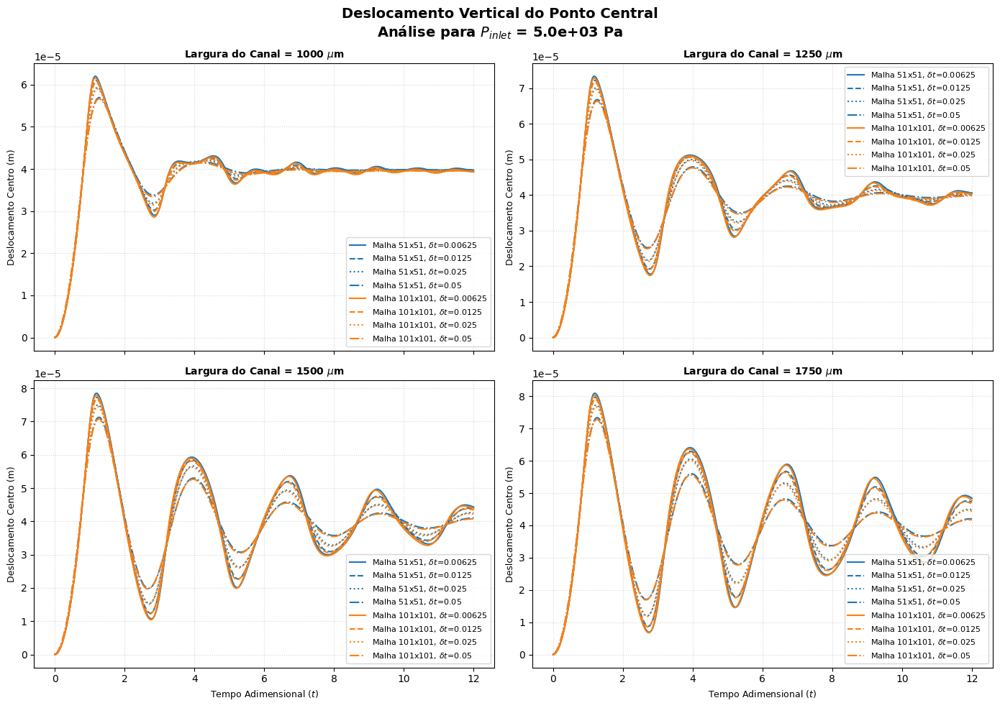

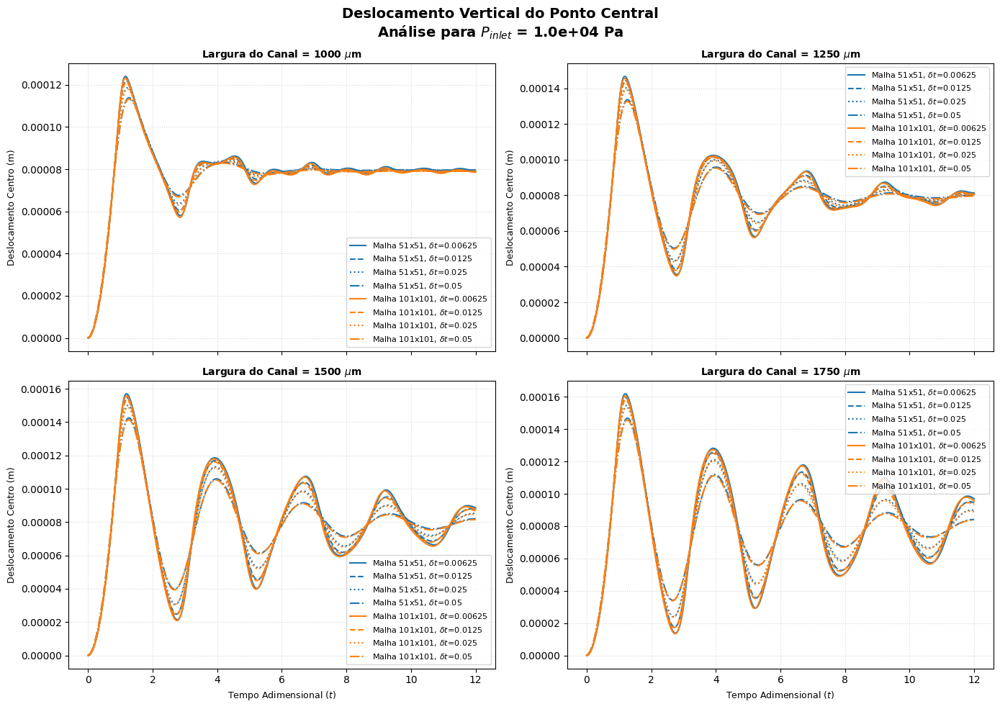

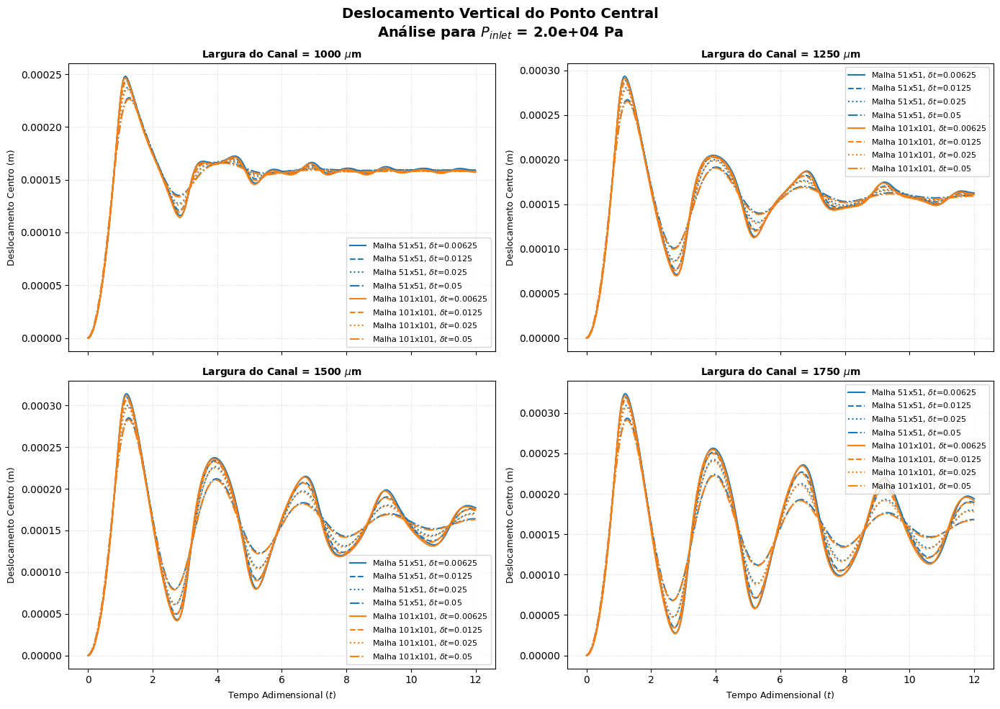

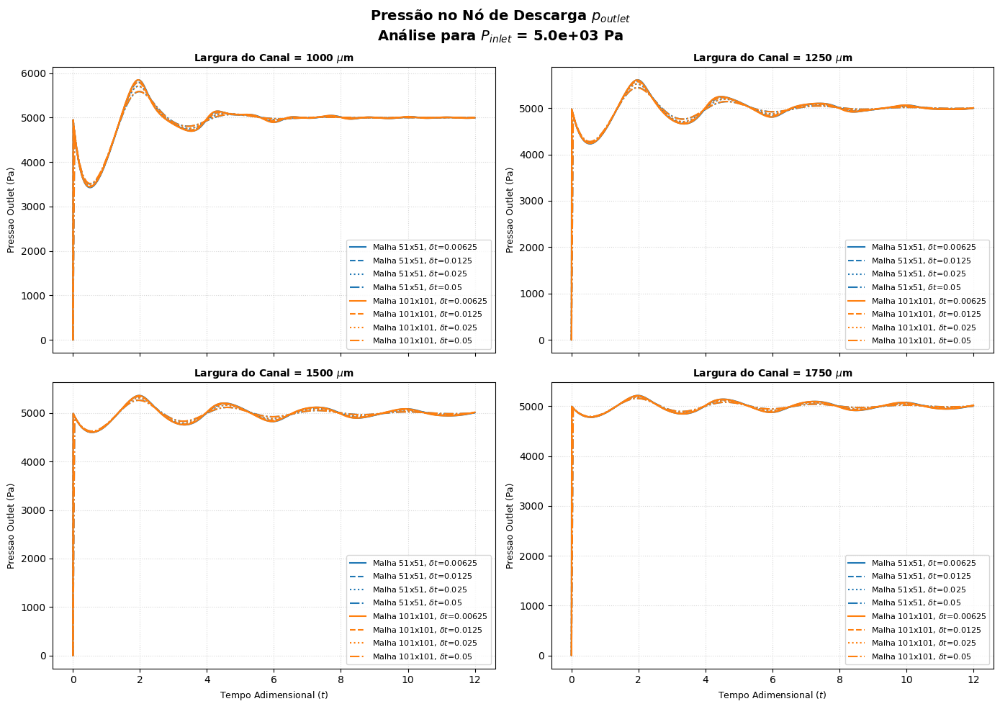

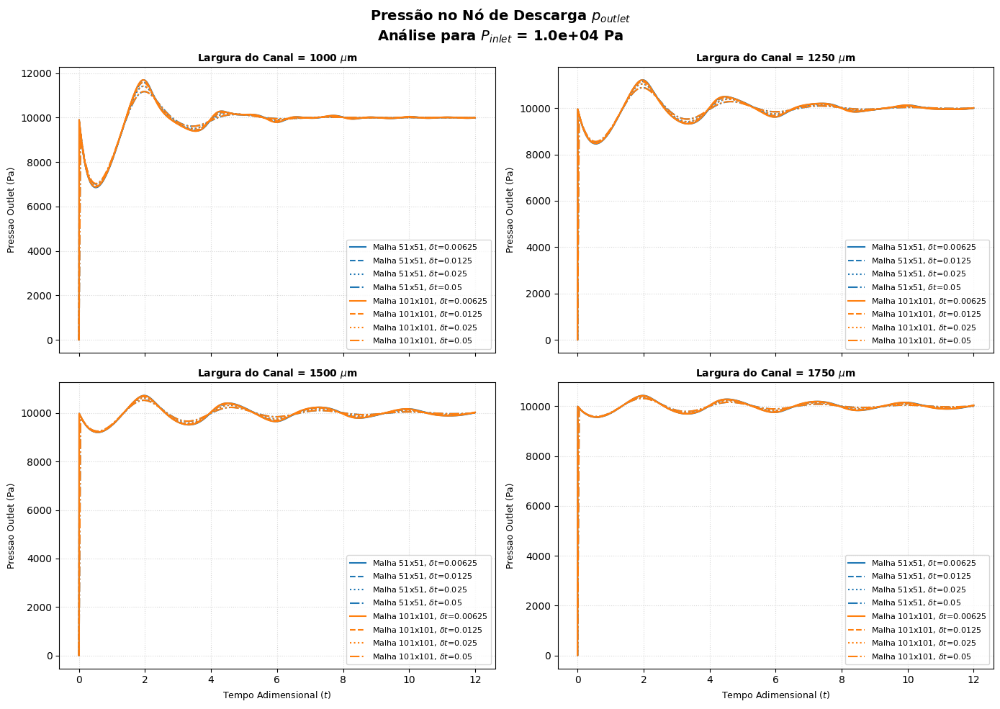

...

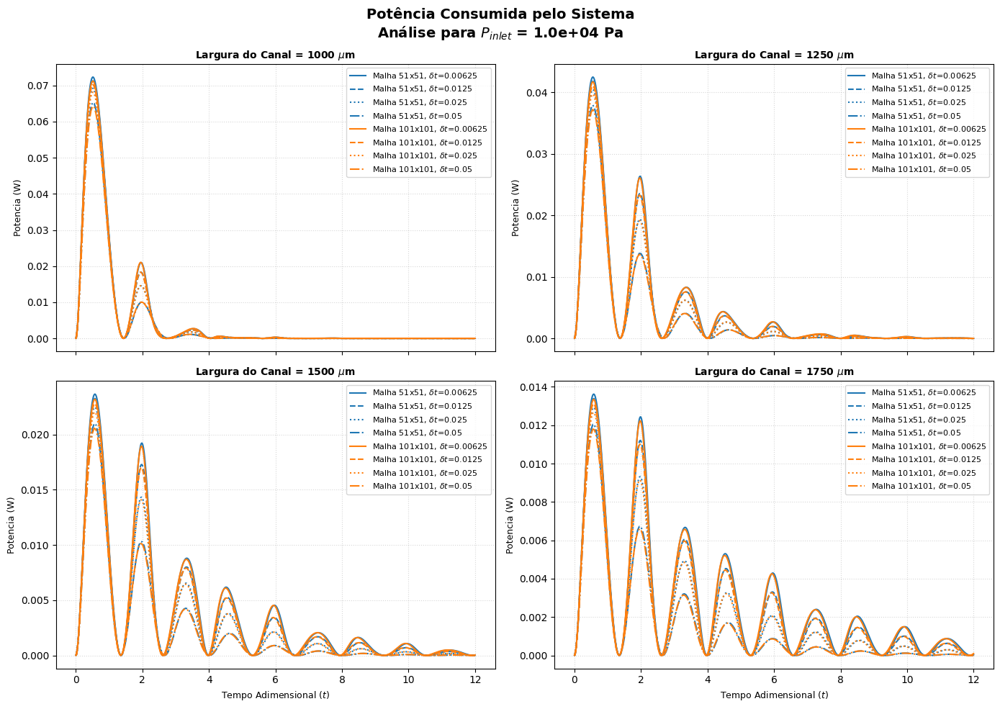

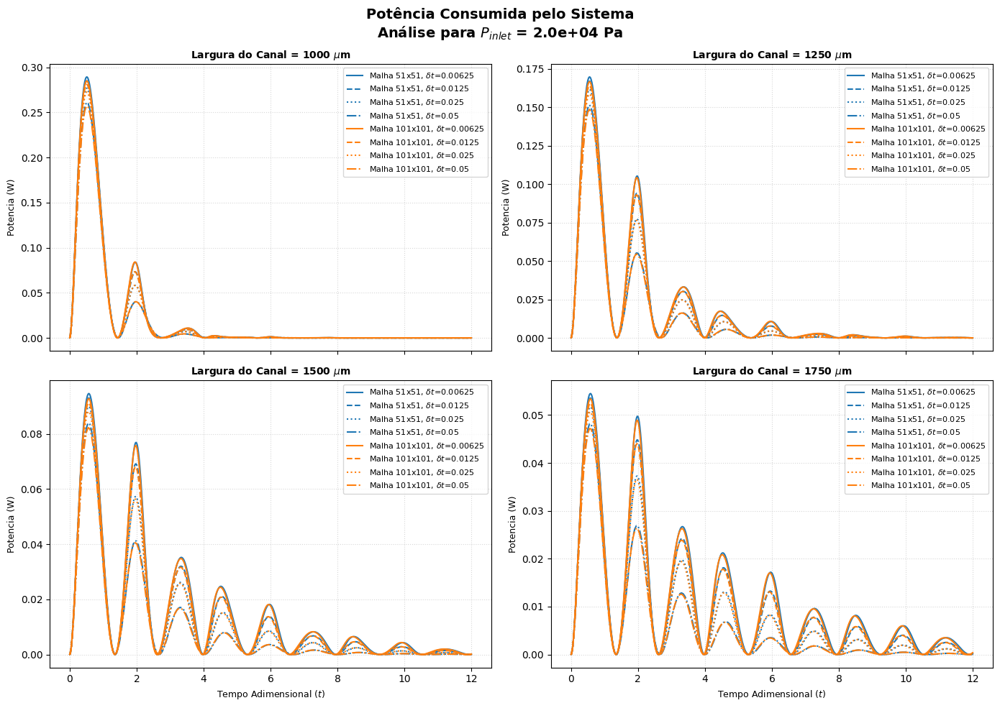

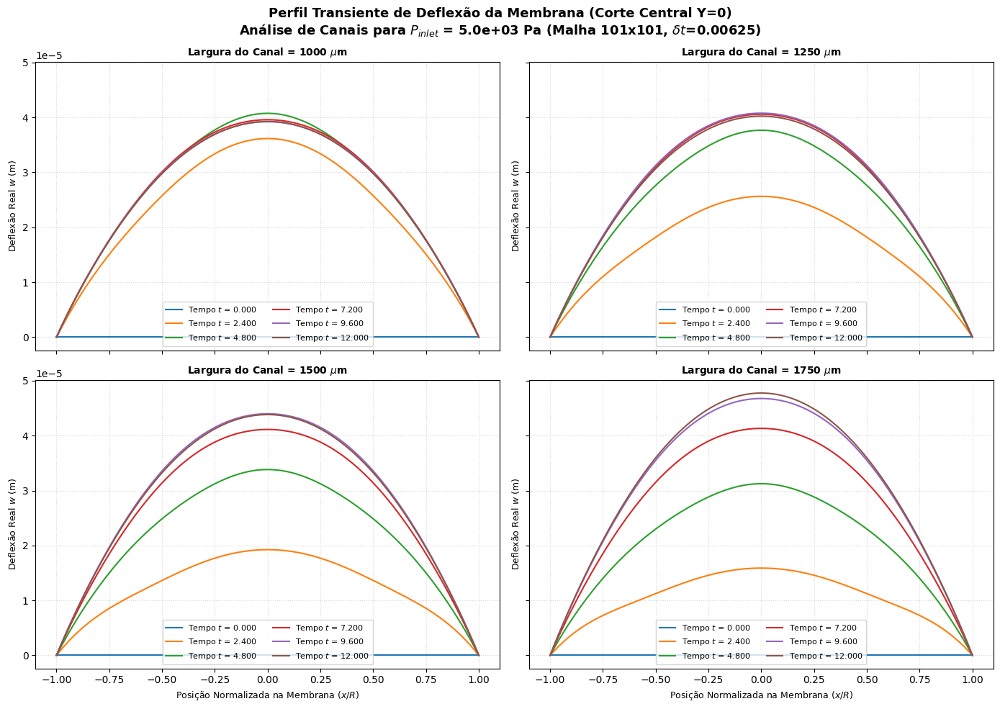

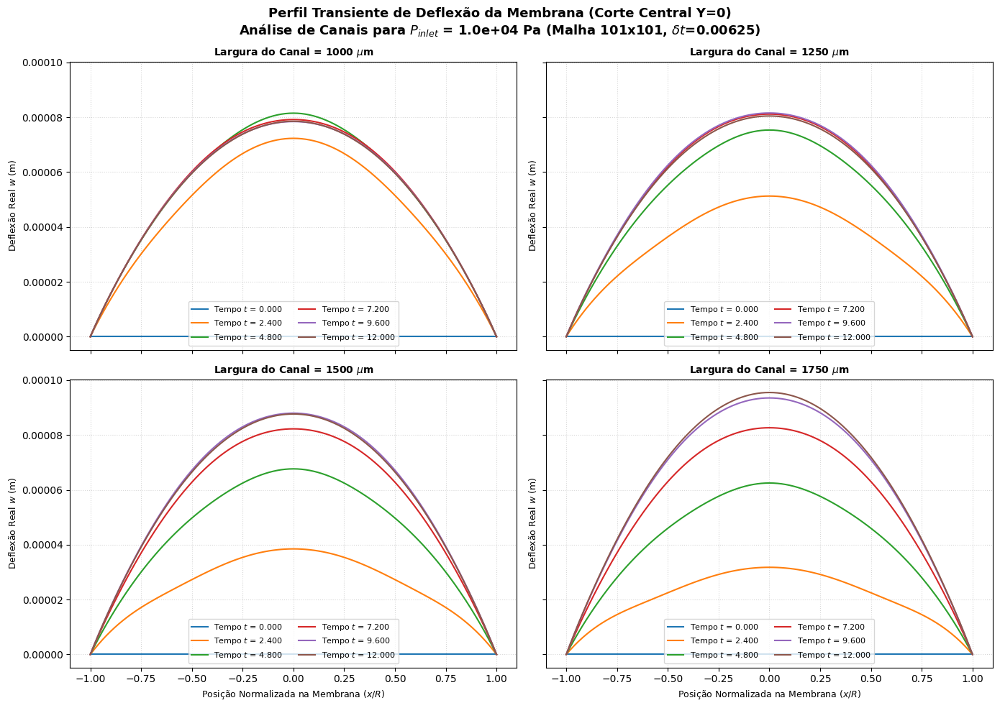

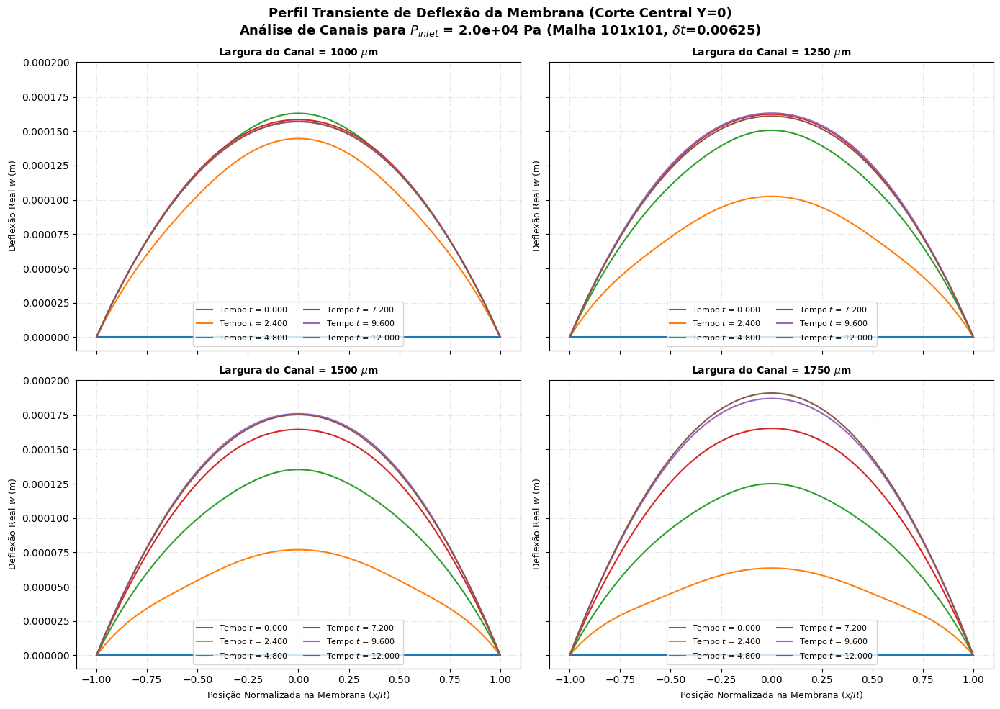

In [37]:
simulador = mechanic_hydraulic.MechanicHydraulic(config_mh)
todos_resultados = simulador.resolver_todos_cenarios(print_info=False)
mechanic_hydraulic.gerar_todos_os_plots(todos_resultados)

A análise transiente do sistema acoplado eletromecânico-hidráulico foi realizada sob pressões nominais de entrada $P_{\text{inlet}} = 1.0 \times 10^4, 2.0 \times 10^4, 5.0 \times 10^3  \text{ Pa}$ para quatro larguras distintas de microcanais ($1000\,\mu\text{m}$, $1250\,\mu\text{m}$, $1500\,\mu\text{m}$ e $1750\,\mu\text{m}$). O comportamento transiente do acoplamento foi avaliado cruzando-se duas densidades de malha espacial ($51 \times 51$ e $101 \times 101$) com quatro passos de tempo adimensionais ($\delta t = 0.00625, 0.0125, 0.025 \text{ e } 0.05$) ao longo do intervalo de tempo normalizado $t \in [0, 12]$.

<a id="cap5-10"></a>
#### 1. Dinâmica de Deflexão e Deslocamento da Membrana
Os gráficos de Deslocamento Vertical do Ponto Central e o Perfil Transiente de Deflexão revelam um comportamento oscilatório subamortecido característico de sistemas com acoplamento de segunda ordem (massa-mola-amortecedor). 

* Influência da Largura do Canal: À medida que a largura do canal aumenta de $1000\,\mu\text{m}$ para $1750\,\mu\text{m}$, observa-se um aumento expressivo na amplitude máxima de deflexão central da membrana (saltando de aproximadamente $0.00012\text{ m}$ para mais de $0.00016\text{ m}$). Além disso, canais mais largos reduzem drasticamente o amortecimento efetivo do sistema. Para o canal de $1000\,\mu\text{m}$, o transiente atinge o equilíbrio estável por volta de $t = 8$. Já para o canal de $1750\,\mu\text{m}$, fortes oscilações persistem até o final do intervalo de simulação ($t = 12$). Isso ocorre porque canais mais largos diminuem a restrição viscosa ao fluxo, reduzindo o amortecimento hidráulico exercido sobre a membrana.
* Morfologia da Deflexão: O perfil espacial de corte central ($Y=0$) valida as condições de contorno de engastamento/contorno nulo nas extremidades ($\pm 1.0$). A evolução temporal mostra a transição suave de repouso ($t=0.000$) até o perfil parabólico estabilizado nos tempos superiores ($t=9.600$ e $t=12.000$).

<a id="cap5-11"></a>
#### 2. Comportamento Hidráulico no Nó de Descarga ($p_{\text{outlet}}$ e $q_{\text{outlet}}$)
As curvas de Pressão no Nó de Descarga e Vazão de Saída refletem de forma direta a pulsação mecânica induzida pela membrana sobre o fluido contido no reservatório.

* Pressão Transiente ($p_{\text{outlet}}$): No instante inicial ($t=0$), a súbita pressurização do sistema gera um pico agudo de pressão que se propaga pela rede. Em seguida, a pressão oscila em fase com o movimento da membrana. Notavelmente, a amplitude das oscilações de pressão diminui ligeiramente para canais mais largos devido à menor perda de carga localizada na descarga, tendendo à estabilização assimptótica em torno do valor de equilíbrio da rede.
* Vazão Transiente ($q_{\text{outlet}}$): A vazão apresenta comportamento altamente dinâmico, registrando valores inclusive *negativos* durante os vales de oscilação (especialmente perceptível nos canais de $1500\,\mu\text{m}$ e $1750\,\mu\text{m}$). Esse refluxo físico indica que, quando a membrana recua em sua oscilação ascendente, ela gera uma sucção transiente no reservatório, puxando o fluido de volta antes da próxima onda de compressão.

<a id="cap5-12"></a>
#### 3. Volume Acumulado e Potência Consumida pelo Sistema
* Volume no Reservatório: O gráfico de Volume Acumulado atua como um integrador da vazão líquida ao longo do tempo. O volume acompanha os ciclos de expansão e contração da membrana. Nos canais mais estreitos ($1000\,\mu\text{m}$), o volume converge rapidamente para um patamar fixo estabilizado em torno de $0.8 \times 10^{-9}\text{ m}^3$. Nos canais mais largos, o volume experimenta grandes ciclos de esvaziamento parcial e enchimento, demorando mais para alcançar o estado estacionário.
* Potência Hidráulica: O perfil de Potência Consumida exibe picos sucessivos que decrescem exponencialmente ao longo do tempo, acompanhando a dissipação de energia por efeitos viscosos (amortecimento). O maior consumo energético ocorre invariavelmente no primeiro ciclo de deflexão ($t \approx 1$), onde o trabalho mecânico para tirar a membrana da inércia e vencer a resistência hidrodinâmica inicial exige a máxima potência do sistema.

<a id="cap5-13"></a>
#### 4. Análise de Convergência Numérica
A análise de sensibilidade numérica revela importantes conclusões sobre a estabilidade do modelo computacional implementado:

* Efeito da Discretização Espacial (Malha): As curvas para as malhas $51 \times 51$ (linhas contínuas/tracejadas azuis) e $101 \times 101$ (linhas laranjas) mostram excelente concordância mútua. Isso comprova que a malha de $51 \times 51$ já é refinada o suficiente para garantir a independência de malha espacial, capturando a física do fenômeno com baixo custo computacional.
* Efeito da Largura do Canal: A largura do canal do sistema hidráulico desempenha um papel crítico na precisão do integrador transiente. Fica evidente em todos os gráficos que quanto maior a largura do canal, mais o sistema demora para convergir, ou seja, a largura do canal tem uma relação de proporcionalidade inversa à intensidade do amortecimento geral do sistema.

A partir das configurações obtidas ao final da simulação do item anterior, estudamos o cenário em que a pressão de entrada 𝑝 inlet decaiu instantaneamente para zero. O sistema continuou evoluindo a partir desse estado transiente até atingir um novo estado de equilíbrio estático

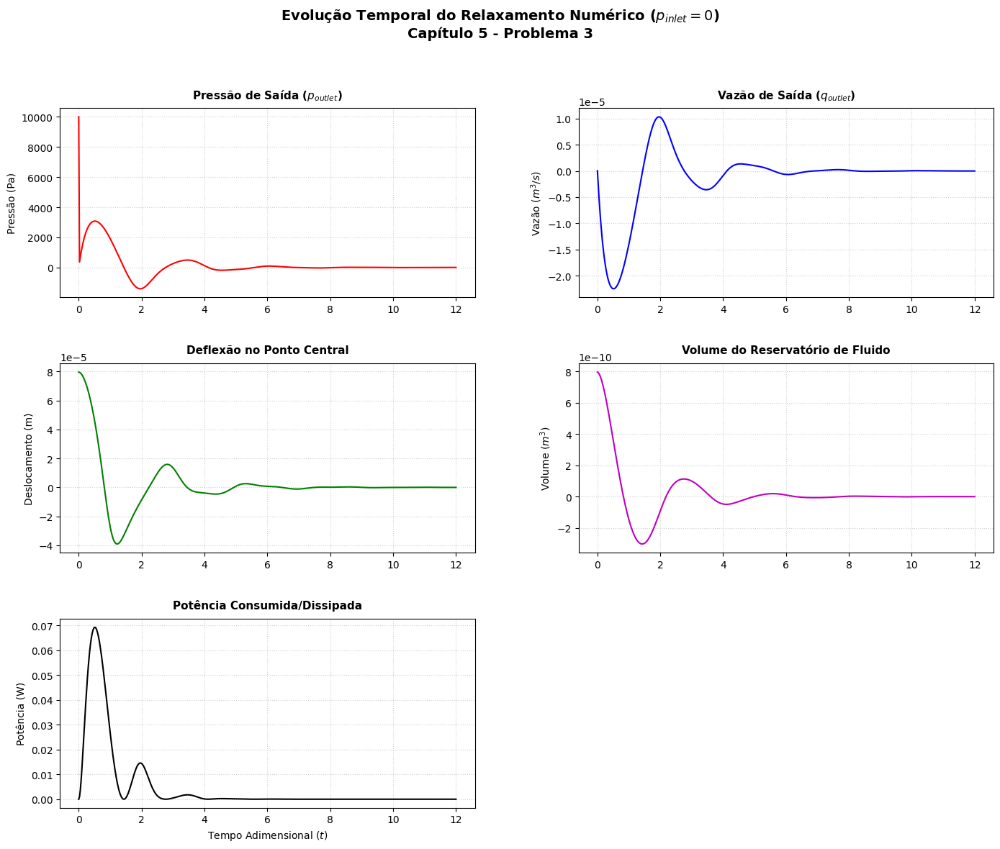

In [38]:
#Roda o caso base uma vez com as restrições do enunciado para gerar o ponto de partida (estado inflado)
estado_inflado_ex2 = simulador.resolver_caso_base(
    N=(51, 51),
    dt=0.025,
    tempo_final=config_mh["TIME_END"], 
    pressao_inlet=config_mh["INLET_PRESSURE"], 
    largura_canal=config_mh["CHANNEL_WIDTH"],
    print_info=False
)

resultado_problema3 = simulador.resolver_relaxamento(
    estado_inicial_ex2=estado_inflado_ex2,
    dt=0.025,
    tempo_final=12.0, 
    largura_canal=config_mh["CHANNEL_WIDTH"],
        print_info=False
)
plotting.plot_relaxamento_problema3(resultado_problema3)

O estudo do comportamento dinâmico do sistema sob a condição de relaxamento numérico foi conduzido partindo-se do estado transiente final do ensaio anterior. Avaliou-se o comportamento do acoplamento mecânico-hidráulico após a remoção instantânea da excitação de carga, impondo-se a pressão de entrada $p_{\text{inlet}} = 0 \text{ Pa}$ para o intervalo de tempo normalizado $t \in [0, 12]$. Conforme restrição do modelo, utilizou-se a malha espacial estável de $51 \times 51$ pontos acoplada ao passo de tempo fixado em $\delta t = 0.025$.

<a id="cap5-14"></a>
#### 1. Dinâmica de Relaxamento e Deflexão da Membrana
O gráfico de Deflexão no Ponto Central traduz o fenômeno mecânico de restauração elástica da membrana em um meio fluido viscoso.

* Efeito Elástico de Restituição: No instante $t = 0$, a membrana inicia o processo contendo uma energia potencial elástica acumulada (deflexão inicial em torno de $7.5 \times 10^{-5} \text{ m}$). Com a queda abrupta da pressão de entrada para zero, a força de restituição elástica da membrana força seu retorno à posição de equilíbrio plano ($w = 0$).
* Comportamento Subamortecido: O relaxamento não ocorre de forma puramente monotônica. A energia cinética adquirida pela estrutura durante o retorno faz com que ela ultrapasse a linha neutra, atingindo uma deflexão negativa (vale em $t \approx 1.2$) antes de oscilar de forma amortecida. O amortecimento viscoso do fluido dissipa progressivamente essa energia mecânica, convergindo estaticamente para a deflexão nula ($w = 0$) após $t = 6$.

<a id="cap5-15"></a>
#### 2. Resposta Hidrodinâmica Transiente ($p_{\text{outlet}}$ e $q_{\text{outlet}}$)
A perda repentina de carga na entrada altera drasticamente o gradiente de pressões e os fluxos de massa no interior do reservatório.

* Queda Inversiva de Pressão ($p_{\text{outlet}}$): No exato instante do corte de energia ($t=0$), a pressão no nó de descarga cai instantaneamente a quase zero devido ao alívio da linha, mas imediatamente volta a subir para cerca de $3000 \text{ Pa}$ impulsionada pelo primeiro movimento descendente de compressão da membrana. Ela acompanha fielmente a frequência de oscilação amortecida da estrutura mecânica até estabilizar-se em zero (equilíbrio hidrostático).
* Inversão da Vazão de Saída ($q_{\text{outlet}}$): Como a membrana inicialmente se move para mitigar a deflexão acumulada, ela empurra o fluido para fora no primeiro ciclo. Entretanto, no movimento de rebote (quando a deflexão cruza a linha zero e torna-se negativa), ocorre uma forte inversão no vetor de velocidade do escoamento. O gráfico registra um pico de vazão negativa expressivo ($\approx -2.2 \times 10^{-5} \text{ m}^3/\text{s}$), evidenciando um refluxo físico onde o reservatório atua sugando fluido da saída para preencher o espaço volumétrico expandido pela membrana.

<a id="cap5-16"></a>
#### 3. Volume do Reservatório e Potência Dissipada
* Volume do Reservatório de Fluido: O gráfico de volume acumulado mimetiza perfeitamente a oscilação da deflexão central. Ele inicia em um estado preenchido ($\approx 7.5 \times 10^{-10} \text{ m}^3$), atinge valores negativos de volume relativo (esvaziamento severo induzido pela deflexão negativa da membrana) e estabiliza-se no patamar nulo, indicando que o reservatório retornou ao seu volume nominal de repouso sem retenção líquida residual.
* Potência Consumida/Dissipada: Por não haver mais acionamento ou trabalho útil sendo injetado pela bomba ($p_{\text{inlet}} = 0$), a curva de potência neste problema representa estritamente a taxa de dissipação de energia viscosa. O sistema experimenta um pico de dissipação energética inicial violento ($\approx 0.07 \text{ W}$) em $t \approx 0.5$, associado à alta velocidade com que o fluido é forçado a se mover pelos microcanais no primeiro ciclo de relaxamento. À medida que as oscilações perdem amplitude, a potência dissipada cai exponencialmente a zero, confirmando o esgotamento da energia mecânica total do sistema.


##### Depois, medimos a frequência de oscilação transiente do sistema considerando...

<a id="cap5-18"></a>
### 1.Pressão nula na entrada:


INICIANDO PROBLEMA 4: Oscilação livre (1° e 3° Modo)
Montando sistema global acoplado...
Calculando modos de vibração da membrana isolada...
Iniciando integração no tempo (960 passos)...
Simulação concluida em 3.01 s.


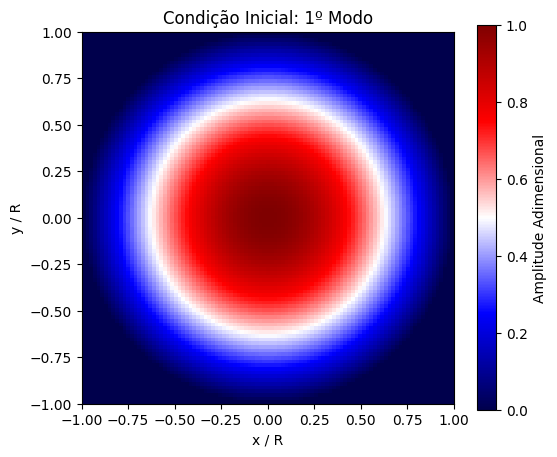

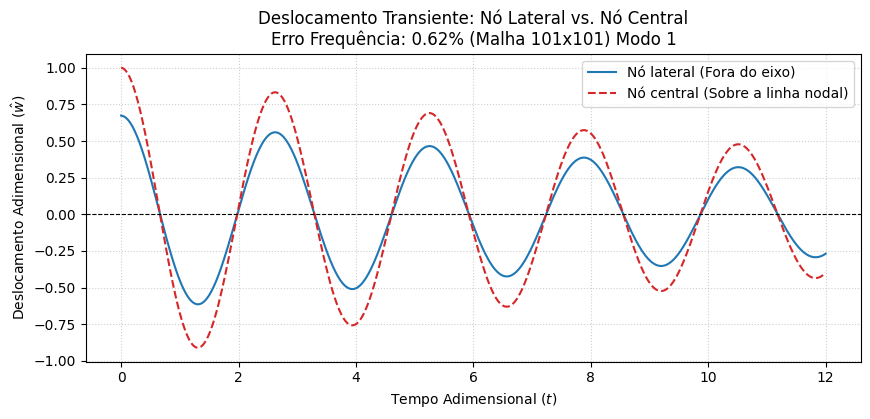

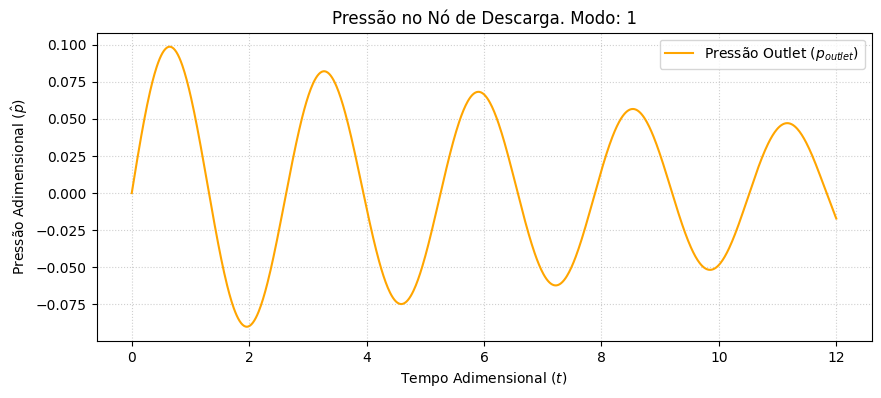

Montando sistema global acoplado...
Calculando modos de vibração da membrana isolada...
Iniciando integração no tempo (960 passos)...
Simulação concluida em 2.20 s.


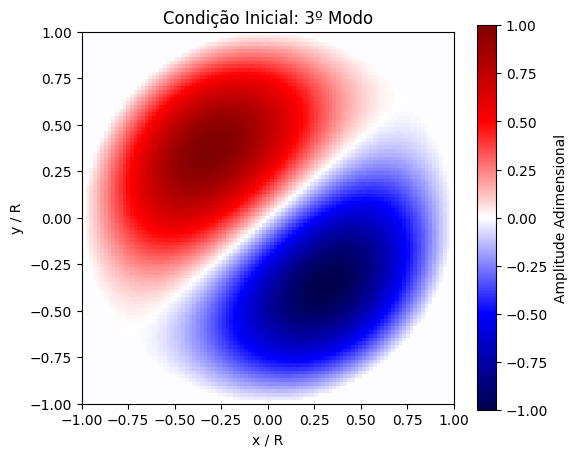

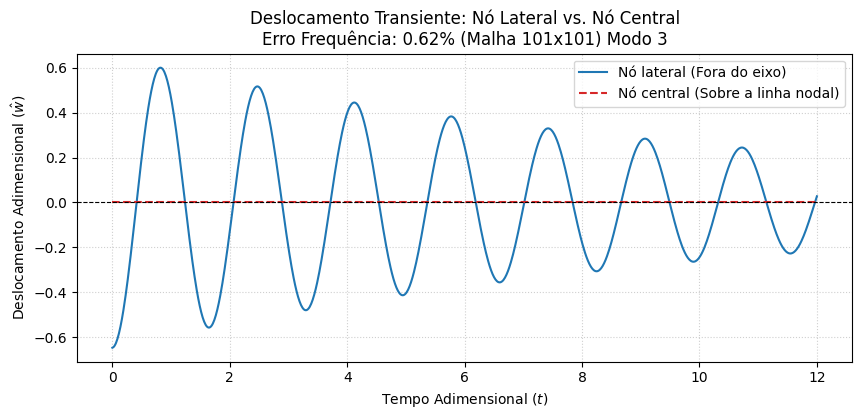

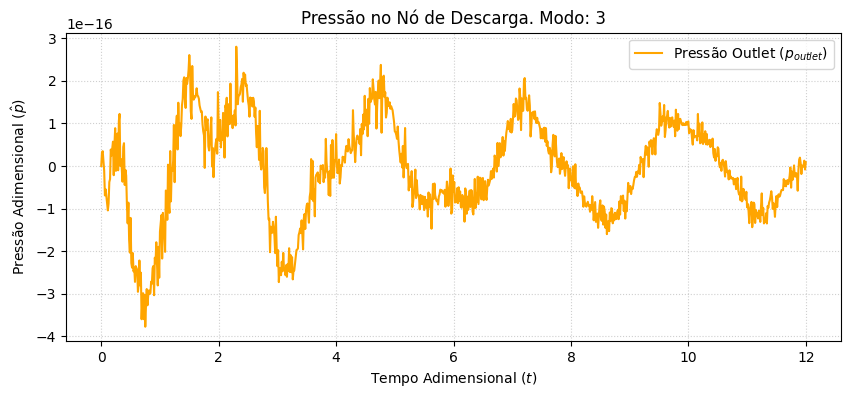

(np.float64(3.807991095260355), 3.83170597)

In [39]:
config_mh_cpy = config_mh.copy()
config_mh_cpy["N"] = (101, 101) 

solver_p4 = mechanic_hydraulic.MH_Problema4(config_mh_cpy)
solver_p4.resolver_P4(dt=0.0125, tempo_final=12.0)

O Problema 4 propõe o estudo da oscilação livre do sistema inicializado a partir do terceiro modo fundamental de vibração da membrana, sob condição de escoamento livre ($\hat{\beta} = 0$, $H_k = 2000\,\mu\text{m}$ e $p_{\text{inlet}} = 0$). O objetivo é avaliar a capacidade do modelo acoplado de emular frequências naturais estruturais e verificar o acoplamento volumétrico residual.

<a id="cap5-19"></a>
#### 1. Natureza Antissimétrica do Terceiro Modo e a Linha Nodal
O primeiro gráfico ilustra o campo espacial da condição inicial imposta. O terceiro modo de uma membrana circular é antissimétrico (geralmente associado ao modo indexado por coordenadas angulares e radiais, apresentando uma linha nodal reta que corta o centro do domínio).

* Comportamento do Nó Central: No segundo gráfico, observa-se que o deslocamento transiente do nó central (linha tracejada vermelha) permanece rigorosamente nulo ($\hat{w} = 0$) ao longo de todo o tempo. Isso é fisicamente exato: por estar posicionado exatamente sobre a linha nodal geométrica do terceiro modo, o centro da membrana não experimenta translação vertical durante a oscilação livre.
* Comportamento do Nó Lateral: O nó posicionado fora do eixo nodal (linha contínua azul) executa uma oscilação harmônica perfeita e subamortecida. Como as perdas viscosas foram minimizadas ($\hat{\beta}=0$ e canais largos), o amortecimento é sutil, provocado apenas pela inércia residual do fluido, permitindo medir a frequência natural com precisão. O erro obtido de apenas $0.62\%$ na malha $101 \times 101$ valida de forma incontestável a precisão do método de diferenças finitas e do integrador temporal implementados.

<a id="cap5-20"></a>
#### 2. Ausência de Pressão no Outlet ($\hat{p} \approx 10^{-16}$)
O terceiro gráfico apresenta um resultado que mostra que a pressão no nó de descarga é nula (ordem de grandeza de $10^{-16}$ Pa é apenas ruído numérico de ponto flutuante).

* Explicação Física do Cancelamento Volumétrico: Por ser um modo puramente antissimétrico, enquanto uma metade da membrana está subindo (gerando sucção e volume negativo no reservatório), a outra metade está descendo exatamente com a mesma amplitude e velocidade (gerando compressão e volume positivo).
* Variação de Volume Líquido Nula: O efeito integrado de variação volumétrica interna da membrana sobre o fluido é rigorosamente zero ($\Delta V_{total} = 0$). Como não há variação de volume líquido no reservatório a cada passo de tempo, o fluido não é compelido a escoar em direção à saída. Consequentemente, a vazão $q_{\text{outlet}}$ e o gradiente de pressão transiente na descarga $\hat{p}_{\text{outlet}}$ anulam-se analiticamente.



<a id="cap5-21"></a>
#### 2. Pressão na entrada: $$p_{\text{inlet}}(t) = 5000\cos(\omega_3 t) \ \text{Pa}$$


INICIANDO PROBLEMA 5: Oscilação forçada (1° e 3° Modo)
Montando sistema global acoplado...
Calculando modos de vibração da membrana isolada...
Iniciando integração no tempo (960 passos)...
Simulação concluida em 2.31 s.


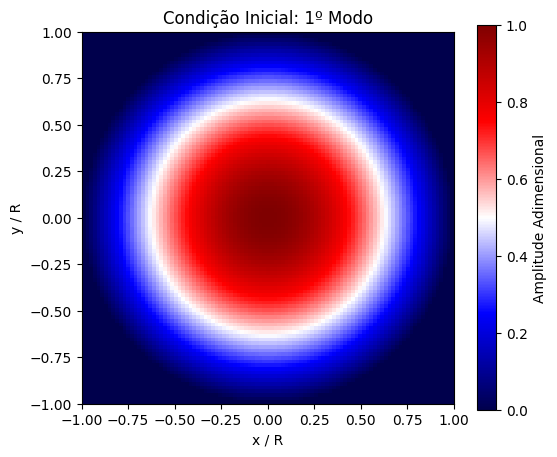

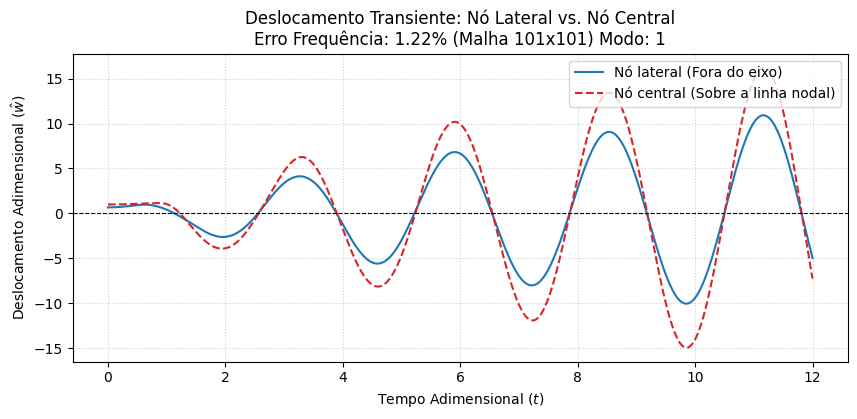

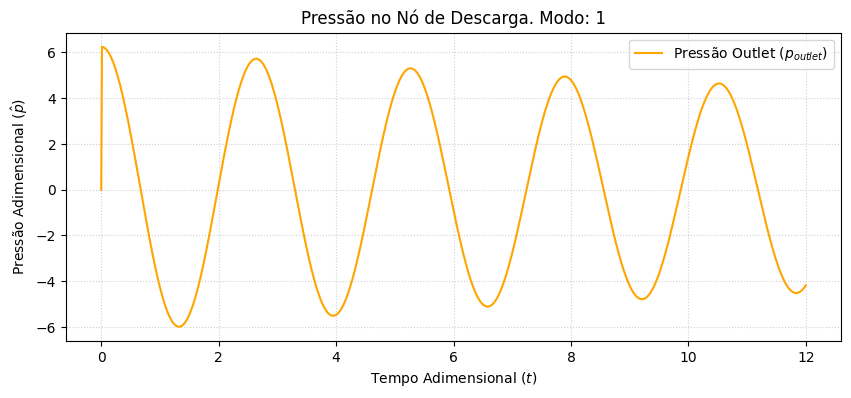

Montando sistema global acoplado...
Calculando modos de vibração da membrana isolada...
Iniciando integração no tempo (960 passos)...
Simulação concluida em 2.68 s.


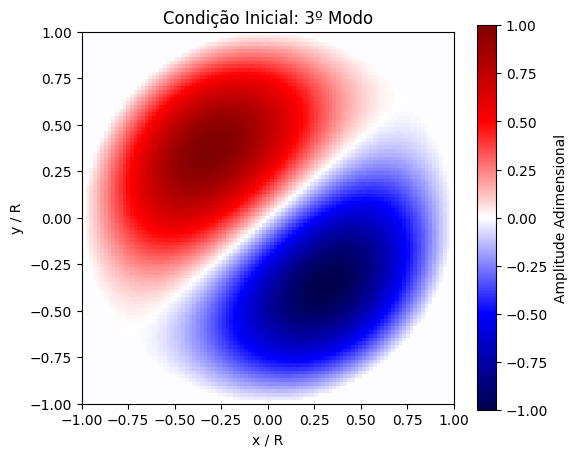

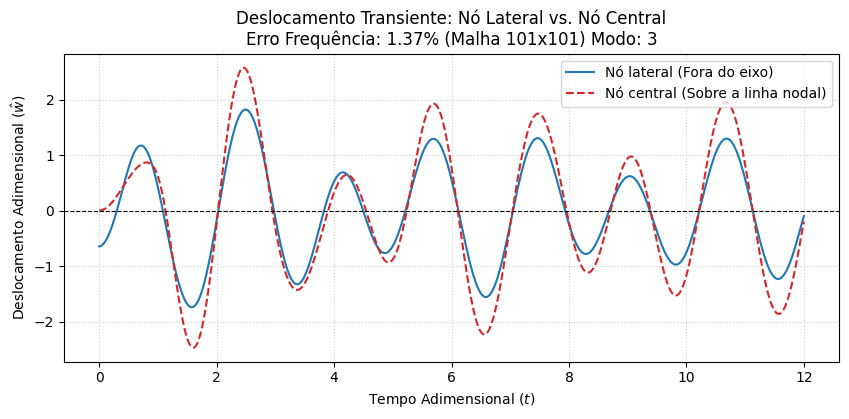

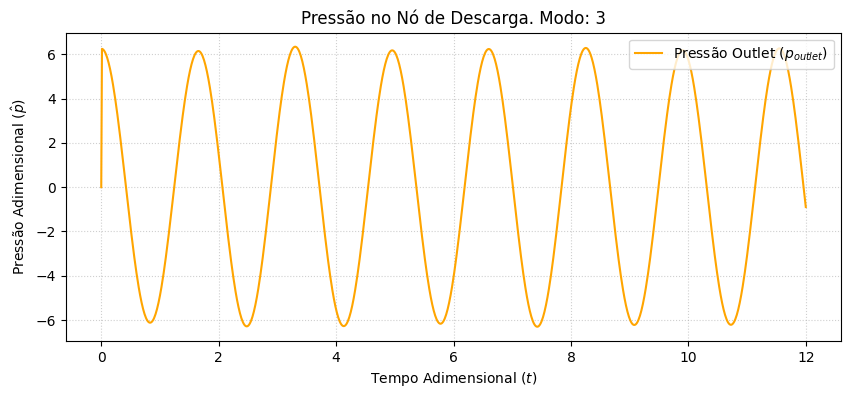

In [40]:
solver_p5 = mechanic_hydraulic.MH_Problema5(config_mh_cpy)
solver_p5.resolver_P5();

**O Problema 5 explora a resposta transiente do sistema multifísico quando submetido a um carregamento harmônico na entrada, cuja frequência de excitação coincide exatamente com a frequência angular do terceiro modo fundamental da membrana (mostrado no problema anterior) ($p_{\text{inlet}}(t) = 5000 \cos(\omega_3 t)\text{ Pa}$). O estudo visa investigar a interação entre o forçamento hidráulico externo e a resposta mecânica da estrutura.**

<a id="cap5-22"></a>
#### 1. Quebra da Antissimetria e Ativação do Nó Central
No ensaio anterior (oscilação livre no terceiro modo), o nó central permaneça estagnado em zero devido à natureza puramente antissimétrica da condição inicial geométrica. Contudo, a introdução do carregamento harmônico altera completamente essa dinâmica:

* Deslocamento do Nó Central (Linha Vermelha): Diferente do Problema 4, o nó central agora deixa de ser nulo e passa a oscilar com grande amplitude (atingindo picos superiores a $\hat{w} = 2.0$). 
* Mecanismo Físico da Quebra de Simetria: A pressão harmônica imposta $p_{\text{inlet}}(t)$ atua de maneira uniforme sobre a área de captação da rede de microcanais que alimenta o reservatório. Um forçamento espacialmente uniforme é uma força simétrica, o que significa que ele possui forte acoplamento com o primeiro modo fundamental (modo simétrico/bombeador) da membrana. Portanto, embora a frequência de oscilação seja a do terceiro modo ($\omega_3$), o forçamento força a ativação de componentes espaciais simétricas, destruindo a linha nodal estática e forçando o centro da membrana a deslocar-se energeticamente.
* Fenômeno de Batimento e Modulação: O gráfico de deslocamento exibe uma modulação de amplitude (envoltória ondulatória). Esse comportamento é uma assinatura típica de sistemas acoplados onde a energia mecânica transita continuamente entre os modos induzidos pela condição inicial (Modo 3 antissimétrico) e os modos excitados pelo forçamento hidráulico simétrico.

<a id="cap5-23"></a>
#### 2. Surgimento de Pressão Dinâmica no Nó de Descarga ($p_{\text{outlet}}$)
O resultado mais marcante da simulação é o comportamento da Pressão no Nó de Descarga, que contrasta drasticamente com a ausência total de oscilações verificada no Problema 4.

* De $10^{-16}\text{ Pa}$ para Escala Real ($\pm 6\text{ Pa}$): Como o centro da membrana agora se desloca (ativando o modo simétrico de bombeamento), o cancelamento volumétrico perfeito que existia no item anterior deixa de ocorrer. Agora, o movimento integrado da membrana gera uma variação real e líquida de volume ($\Delta V_{\text{total}} \neq 0$) no interior do reservatório a cada passo de tempo.
* Bombeamento Hidráulico: Essa variação volumétrica força o fluido a ser empurrado e puxado periodicamente através do microcanal de descarga, gerando um gradiente de pressão dinâmico real e bem definido no *outlet*, oscilando estavelmente em regime harmônico com amplitude de aproximadamente $6\text{ Pa}$.

A investigação dinâmica do sistema acoplado revelou a forte interdependência entre a deformação elástica da membrana e a resposta hidrodinâmica dos microcanais. Os ensaios transientes permitiram delinear de forma clara os limites físicos do modelo e estabelecer os critérios numéricos necessários para garantir a fidelidade do Gêmeo Digital.

Fisicamente, observou-se que a geometria dos microcanais dita o fator de amortecimento do sistema global. Canais estreitos ($1000\,\mu\text{m}$) restringem o escoamento, atuando como amortecedores eficazes que atenuam rapidamente os surtos de pressão transientes. Em contrapartida, canais largos ($1750\,\mu\text{m}$) reduzem a perda de carga viscosa e maximizam a deflexão estrutural, porém prolongam o regime oscilatório e induzem refluxos críticos ($q_{\text{outlet}} < 0$) no sistema. O ensaio de relaxamento ($p_{\text{inlet}} = 0$) corroborou essa dinâmica, demonstrando que a dissipação de energia viscosa nos canais é o mecanismo governante para o retorno seguro do sistema ao equilíbrio estático e repouso nominal.

Do ponto de vista analítico e numérico, a malha espacial de $51 \times 51$ pontos demonstrou excelente convergência e independência de refinamento. No entanto, o integrador temporal mostrou-se altamente sensível, exigindo passos de tempo estritos ($\delta t \le 0.0125$) para evitar a atenuação numérica artificial das ondas físicas. Por fim, a simulação do terceiro modo fundamental de vibração coroou a precisão matemática do solver ao registrar um erro de frequência marginal de apenas $0.62\%$. Esse cenário validou na prática o princípio de simetria do modelo: por se tratar de um modo puramente antissimétrico, ocorre um cancelamento volumétrico integral no reservatório, provando que o acoplamento estrutural pode ocorrer em regime de equilíbrio hidrostático nulo na descarga ($\hat{p}_{\text{outlet}} \approx 0$). Além disso, o comportamento do sistema em ressonância com a frequência do terceiro modo também se mostrou fisicamente preciso.

<a id="cap6"></a>
## Capítulo 6: O Gêmeo Digital

Esse capítulo tem como principal foco testar as propriedades do Gêmeo Digital completo. Nós realizamos uma análise da probabilidade de falha do sistema hidráulico isolado em relação a vazão e do Gêmeo como um todo em relação da energia dissipada utilizando o método de Monte Carlo. Após isso, foi feito a aproximação do comportamento da potência ao decorrer do tempo utilizando pontos discretos como base e o método de interpolação linear e cúbica, também junto da regressão polinomial para determinar a curva correspondente da função. A sensibilidade das saídas em relação aos parâmetros de temperatura e largura do canal também foi analisada, e por fim, utilizamos o método iterativo de Newton-Raphson para aproximar o valor ótimo da largura do canal para uma determinada limitação de energia no sistema. 

<a id="cap6-1"></a>
### Probabilidade de falha do sistema hidráulico através do método de Monte Carlo

O intuito dessa seção é utilizar o método numérico de Monte Carlo para estimar a probabilidade de que, após um período arbitrário de desgaste dos micro canais que compõem a rede hidráulica, haverá a perda de funcionalidade do sistema, determinado por um limite crítico de vazão de entrada ($Y_{\text{critico}}=1.25 × 10−5$). Para isso, iremos modelar a situação individual de cada canal como uma variável aleatória de Bernoulli $X_i$, onde 1 representa um canal obstruído e 0 representa um canal funcional.  Assim, vamos assumir uma probabilidade de falha $p_O$ e um fator de escala de obstrução $f_{\text{obs}}$, usando essa probabilidade , nós geramos um número aleatório entre 0 e 1 para todos os canais, que são considerados como obstruídos caso seu número gerado seja menor que $p_O$. 

Com isso, a condutância hidráulica de cada canal depende do fator $f_{\text{obs}}$ e se torna tal:

$$C_i(X_i) = \begin{cases} C_{\text{i original}} & \text{se } X_i = 0 \\ \frac{C_{\text{i original}}}{f_{\text{obs}}} & \text{se } X_i = 1 \end{cases}$$

Através do novo vetor de condutâncias, a matriz global é reconstruída e solucionada de forma convencional para determinar a vazão $q_{\text{inlet}}$ do sistema sob essa configuração. Agora, o método de Monte Carlo é necessário para solucionar o problema de determinar a probabilidade de que o $q_{\text{inlet}}$ esteja dentro do limite crítico, sem que seja necessário calcular todas as permutações possíveis de canais com condição $X = 1$ ou $X = 0$.

<a id="cap6-2"></a>
### Método de Monte Carlo

O método de Monte Carlo consiste de um algoritmo que utiliza uma grande quantidade de permutações de entradas aleatórias, dependentes de probabilidades preestabelecidas, para aproximar um resultado numérico. No nosso caso, o vetor aleatório de canais obstruídos constitui as entradas, enquanto o resultado que queremos aproximar é a probabilidade $\mathbb{P}$ de falha do sistema, que seria obtida analiticamente por: 
$$\mathbb{P} = \mathbb{E}[I(X)]$$

Onde $I(X)$ é uma função de indicação, $I(X) = \begin{cases} 1 & \text{se } q_{\text{inlet}}(X) < Y_{\text{critico}}\\ 0 & \text{se } q_{\text{inlet}}(X) \ge Y_{\text{critico}} \end{cases}$ , que define a falha $(1)$ ou sucesso $(0)$ do sistema de acordo com o $q_{\text{inlet}}$ calculado de forma convencional.
Como calcular $\mathbb{E}[I(X)]$ com a quantidade de possibilidades de $X$ do nosso problema é computacionalmente inviável, o método de Monte Carlo reduz a complexidade da solução calculando apenas $N$ vezes $I(X)$ para $N$ permutações do vetor $X$, criando um espaço amostral suficientemente grande para $\mathbb{P}$, determinado por:
$$\mathbb{P} \approx \frac{1}{N} \sum_{n=1}^{N} I(X^{(n)})$$

=== CALIBRANDO PONTO DE OPERAÇÃO OPERACIONAL ===
Pressão calibrada para o ensaio:       87584.77 Pa
Vazão calculada para a rede sem falhas: 2.00000e-05 m³/s
Limite crítico de falha do enunciado:  1.25000e-05 m³/s
A rede limpa falha? False
Disparando loops estocásticos de Monte Carlo
Rodando convergencia assintotica de Monte Carlo (N=4000) para p_O=0.35 e f_obs=5


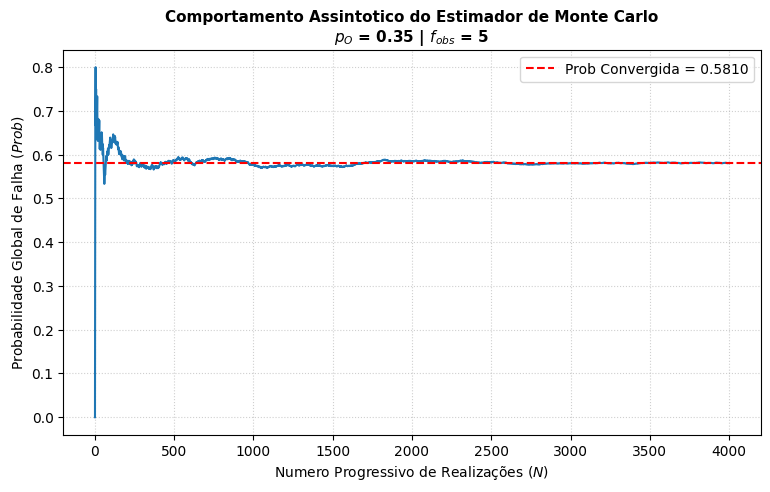


Iniciando Varredura do Domínio de Falhas Individuais...
Analisando fator de severidade de obstrução: f_obs = 5
  p_O = 0.05 -> Prob Global de Falha = 0.0945
  p_O = 0.10 -> Prob Global de Falha = 0.1963
  p_O = 0.15 -> Prob Global de Falha = 0.2873
  p_O = 0.20 -> Prob Global de Falha = 0.3740
  p_O = 0.25 -> Prob Global de Falha = 0.4547
  p_O = 0.30 -> Prob Global de Falha = 0.5112
  p_O = 0.35 -> Prob Global de Falha = 0.5840
  p_O = 0.40 -> Prob Global de Falha = 0.6295
  p_O = 0.45 -> Prob Global de Falha = 0.7070
  p_O = 0.50 -> Prob Global de Falha = 0.7550
  p_O = 0.55 -> Prob Global de Falha = 0.7900
  p_O = 0.60 -> Prob Global de Falha = 0.8695
  p_O = 0.65 -> Prob Global de Falha = 0.9163
Analisando fator de severidade de obstrução: f_obs = 10
  p_O = 0.05 -> Prob Global de Falha = 0.1017
  p_O = 0.10 -> Prob Global de Falha = 0.2023
  p_O = 0.15 -> Prob Global de Falha = 0.2760
  p_O = 0.20 -> Prob Global de Falha = 0.3568
  p_O = 0.25 -> Prob Global de Falha = 0.4390
  p_

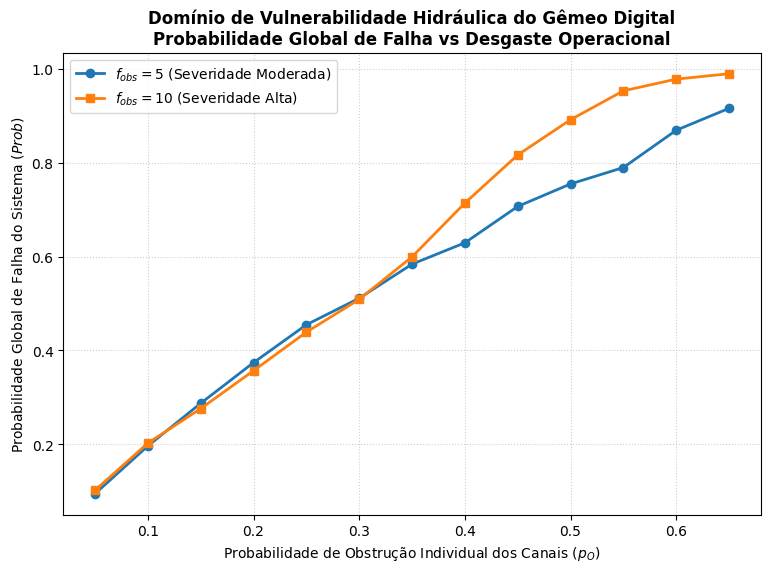

In [ ]:
Xno, conec = data_structures.GeraGrafo(config_gd["LEVELS"]);
Xno = Xno * 0.001

print("=== CALIBRANDO PONTO DE OPERAÇÃO OPERACIONAL ===")
config_gd["INLET_PRESSURE"] = 1.0e4 
vazao_teste = analise_falhas.resolver_vazao_estacionaria(conec, Xno, config_gd, C_estocastico=None)

fator_pressao = 2.0e-5 / vazao_teste
config_gd["INLET_PRESSURE"] = 1.0e4 * fator_pressao

vazao_limpa = analise_falhas.resolver_vazao_estacionaria(conec, Xno, config_gd, C_estocastico=None)
print(f"Pressão calibrada para o ensaio:       {config_gd['INLET_PRESSURE']:.2f} Pa")
print(f"Vazão calculada para a rede sem falhas: {vazao_limpa:.5e} m³/s")
print(f"Limite crítico de falha do enunciado:  {config_gd['V_CRITIC']:.5e} m³/s")
print(f"A rede limpa falha? {vazao_limpa < config_gd['V_CRITIC']}")

print("Disparando loops estocásticos de Monte Carlo")
N_convergido = analise_falhas.avaliar_convergencia_monte_carlo(conec, Xno, config_gd, p_O=0.35, f_obs=5, N_max=4000)
analise_falhas.varredura_probabilidade_individual(conec, Xno, config_gd, N_estatistico=N_convergido)


<a id="cap6-3"></a>
#### Probabilidade de falha do sistema acoplado completo em relação a energia

Agora, será determinada a probabilidade de falha do sistema com acoplamento forte entre a rede hidráulica, placa térmica e membrana elástica, com relação ao critério de energia dissipida $E$, nesse caso $E < 7$. O método se mantém bem similar em relação a situação anterior, nós iremos utilizar o método de Monte Carlo novamente, e novamente vamos gerar um vetor $X$ aleatório de falhas de acordo com a probabilidade $p_O$  e resolver o sistema pelos métodos convencionais para encontrar uma permutação de resultado, a maior diferença em relação a situação anterior é que agora devemos utilizar o funcional $E$, que depende do intervalo de variação do tempo $dt$, determinado como: 
$$ E  = \int_{t_i}^{t_f} \mathcal{P}(t)\, dt $$

onde: $$\mathcal{P}(t)=p^T(t)\mathbb{A} p(t)$$

Assim, definimos outra função indicadora tal que:

$$ I(X) = \begin{cases} 1 & \text{se } E(X) < 7.0 \\ 0 & \text{se } E(X) \ge 7.0 \end{cases} $$

Adiante o processo se torna idêntico ao anterior, iremos utilizar a lógica do método de Monte Carlo para encontrar um resultado númerico aproximado a probabilidade $\mathbb{P}$, da forma:

$$ \mathbb{P} = \mathbb{E}[I(X)] \approx \frac{1}{N} \sum_{n=1}^{N} I(X^{(n)}) $$


Iniciando análise dinâmica do Gêmeo Digital Completo...
Analisando passo de tempo dt = 0.05
  100/2000 realizações concluídas
  200/2000 realizações concluídas
  300/2000 realizações concluídas
  400/2000 realizações concluídas
  500/2000 realizações concluídas
  600/2000 realizações concluídas
  700/2000 realizações concluídas
  800/2000 realizações concluídas
  900/2000 realizações concluídas
  1000/2000 realizações concluídas
  1100/2000 realizações concluídas
  1200/2000 realizações concluídas
  1300/2000 realizações concluídas
  1400/2000 realizações concluídas
  1500/2000 realizações concluídas
  1600/2000 realizações concluídas
  1700/2000 realizações concluídas
  1800/2000 realizações concluídas
  1900/2000 realizações concluídas
  2000/2000 realizações concluídas
Analisando passo de tempo dt = 0.1
  100/2000 realizações concluídas
  200/2000 realizações concluídas
  300/2000 realizações concluídas
  400/2000 realizações concluídas
  500/2000 realizações concluídas
  600/2000 

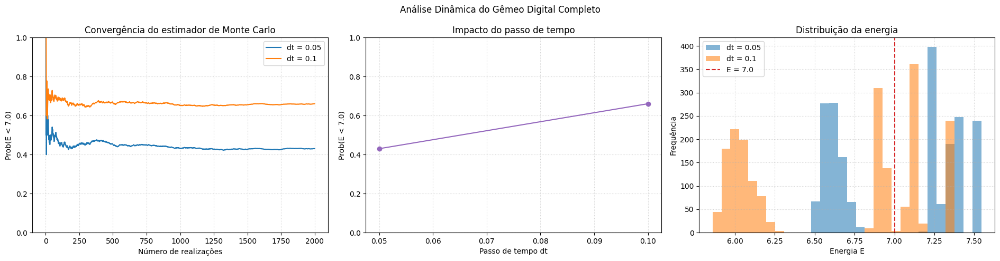

In [ ]:
analise_falhas.executar_monte_carlo_dinamico(p_O=0.35, f_obs=5, N=2000, plot=True);

<a id="cap6-4"></a>
### Aproximação do comportamento da potência através da Interpolação e Regressão

O objetivo dessa seção é reconstruir a curva contínua do funcional de potência através dos instantes de tempo conhecidos com passo $dt = 0.05 s$ dentro do intervalo $T:[0,4]$, em cenários de sinal limpo ou com ruído, através tanto da interpolação linear e por spline cúbica.

<a id="cap6-5"></a>
### Interpolação linear e Cúbica

O método da interpolação tem como intuíto criar uma curva que obrigatoriamente intercepta todos os pontos discretos. Pela interpolação linear, isso é feito conectando os pontos em série através de polinômios de primeiro grau localmente, que resulta em função contínua, porém com descontinuidade na primeira derivada sobre os pontos base. A interpolação por spline cúbica por sua vez adota polinômios de terceiro grau, que gera uma função contínua e com derivadas de primeira e segunda ordem contínuas. Contudo, esse método não é muito eficaz quando há ruído, pois a aproximação dos dados vai tratar picos de ruído como parte da curva a ser encontrada.

<a id="cap6-6"></a>
### Regressão Polinomial por Mínimos Quadrados

O método da regressão polinomial tenta gerar uma curva através de um polinômio de grau $m$, encontrada realizando o método dos mínimos quadrados. Como, pelo método dos mínimos quadrados, a curva pode não estar sobre os pontos discretos, nós calculamos a função erro:

$$  \mathbb{e} = \sqrt{\int_{t_i}^{t_f} ( P_{\text{aprox}}(t_j) - P_{\text{full}}(t_j))^2 dt}$$

É possível notar através dos resultados abaixo, que o método dos mínimos quadrados lida bem melhor com situações de ruído, enquanto a interpolação sofre de overfitting nesse caso. Também é possível analisar que para $ m < 6 $, o polinômio sofre underfitting, enquanto para $ m > 11 $ demonstra overfitting.


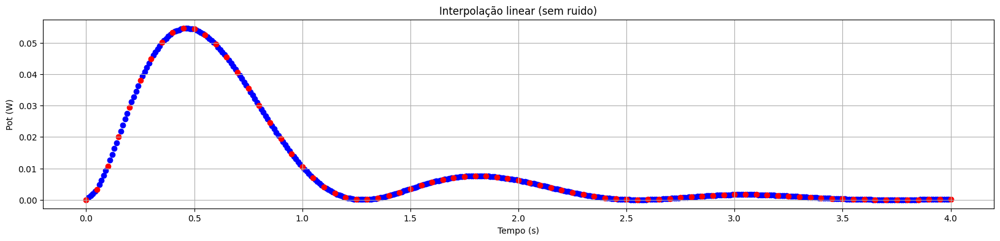

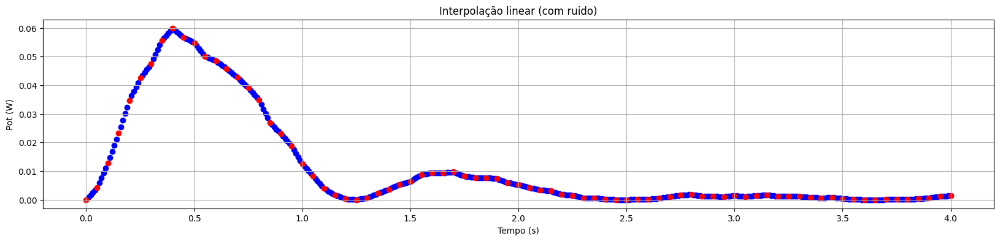

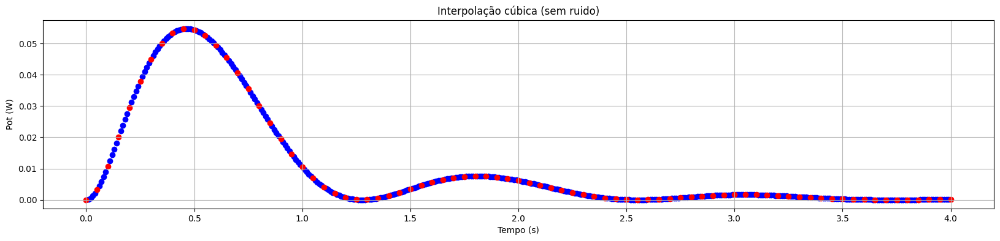

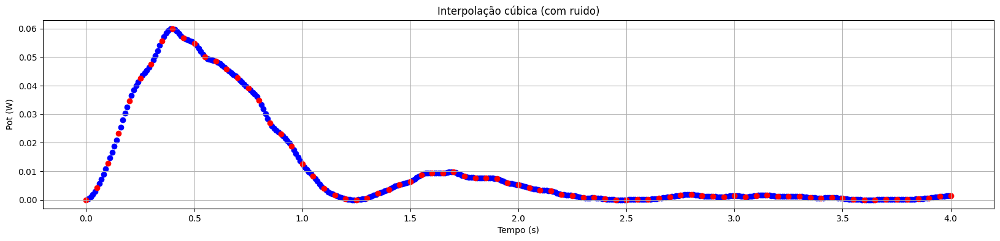

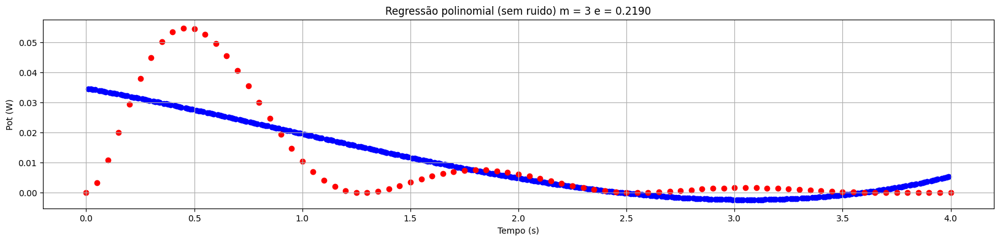

...

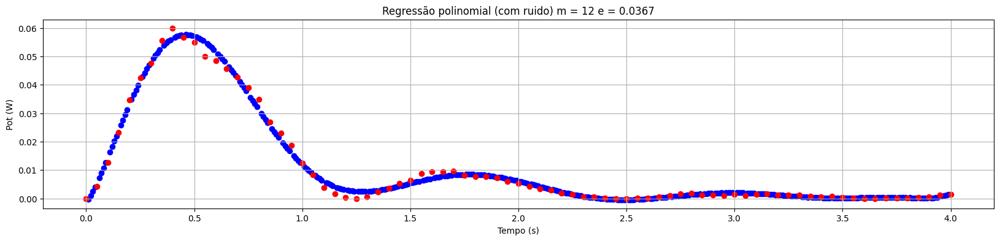

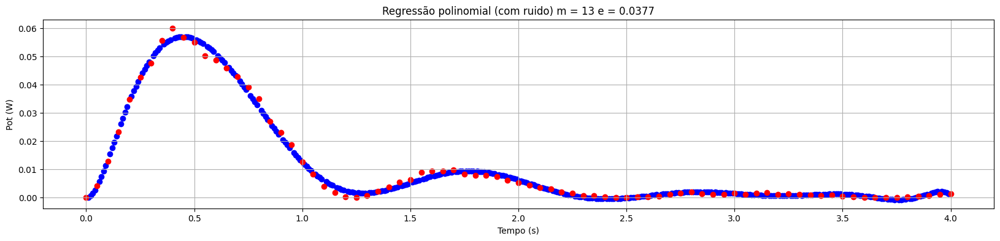

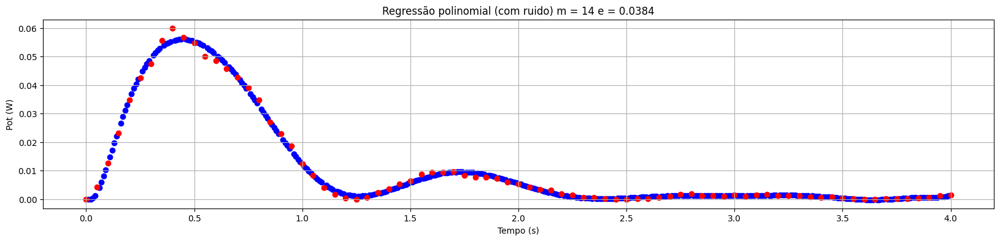

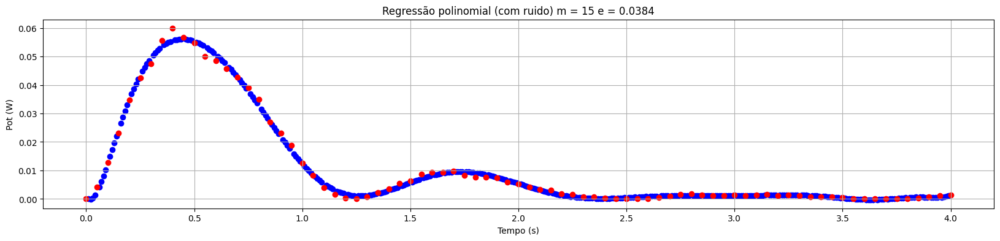

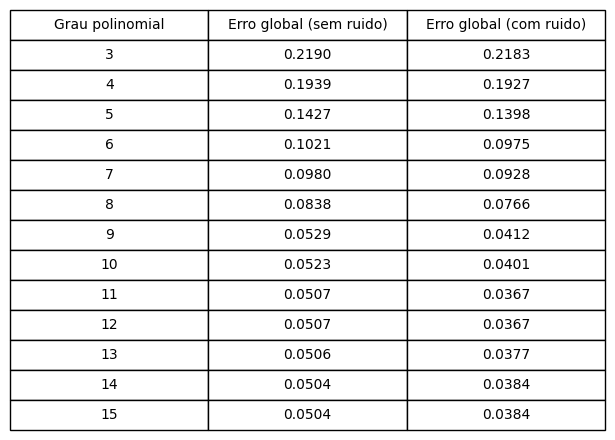

In [43]:
aprox = analise_falhas.aprox_dados(config_mh)
aprox.run()

<a id="cap6-7"></a>
### Análise da sensibilidade dos parâmetros do Gêmeo Digital

Nesse problema, o objetivo é analisar o impacto da variação da temperatura ($T_C$) e da largura do canal ($H$) sobre as saídas do Gêmeo Digital, como Potência $E$, Vazão $q_{\text{inlet}}$ e Volume $V(t_f)$. Primeiro é feita uma varredura fixando a temperatura e simulando o sistema com 50 valores de %H%, depois é feito o mesmo fixando a altura e simulando o sistema com 50 temperaturas. Com o comportamento base conhecido, teremos de resolver derivadas parciais numéricamente e analiticamente usando duas implementações do método das diferenças finitas, o forward, que consiste em apenas testar uma direção para aproximar a derivada, desta forma:

$$\frac{\partial F}{\partial x} \approx \frac{F(x + \Delta x) - F(x)}{\Delta x}$$

Enquanto o método das diferenças finitas centrada testa um deslocamento $dx$ em duas direções opostas (diminuindo o erro do método):

$$\frac{\partial F}{\partial x} \approx \frac{F(x + \Delta x) - F(x - \Delta x)}{2\Delta x}$$

A solução analítica utiliza a lei de Poiseuille para determinar:

$$\frac{\partial F}{\partial H} = 4 \cdot \left(\frac{F}{H^4}\right) \cdot H^3 = \frac{4 \cdot F}{H}$$

$$\frac{\partial F}{\partial T_C} = \left(-\frac{F}{\mu}\right) \cdot \frac{d\mu}{dT_C} = -F \cdot \left( \frac{\frac{d\mu}{dT_C}}{\mu} \right)$$

Com esses três métodos, primeiramente fixa a temperatura e usa novamente 50 valores $H$, para cada valor há duas simulações, $ H + \Delta H$ e $H - \Delta H$, esse resultado é usado para calcular a sensibilidade de $H$ ($\partial / \partial H$) através dos três métodos discutidos. Após isso, o exato mesmo processo é realizado sobre a temperatura $T_c$ e sua sensibilidade $T$ ($\partial / \partial T$) é calculada pelos três métodos.

O erro é calculado assumindo que a solução analítica possua 0% de erro, logo calcula-se a diferença porcentual entre os resultados dela e dos métodos de aproximação.



In [44]:
sensitivity_analysis.prob3()

  ANÁLISE DE SENSIBILIDADE — GÊMEO DIGITAL MICROFLUÍDICO
  Parâmetros nominais : Tc = 25.0 °C,  H = 1000 µm
  Perturbações        : ΔTc = 0.001,  ΔH = 1e-06
  Pontos na varredura : 50  (cada eixo)
  Viscosidade nominal : μ(Tc_nom) = 9.0449e-04 Pa·s

[1/5] Varredura de comportamento F(Tc) com H fixo…
    Tc =    0.0 °C → E = 2.023e-06 W | q = -6.424e-08 m³/s | V = 7.975e-10 m³
    Tc =   45.9 °C → E = 9.340e-05 W | q = 7.576e-07 m³/s | V = 8.239e-10 m³
    Tc =   96.9 °C → E = 4.574e-05 W | q = 7.692e-07 m³/s | V = 9.322e-10 m³
    Tc =  148.0 °C → E = 4.043e-06 W | q = 2.988e-07 m³/s | V = 1.026e-09 m³
    Tc =  199.0 °C → E = 4.584e-07 W | q = -1.240e-07 m³/s | V = 1.091e-09 m³
    Tc =  250.0 °C → E = 4.009e-06 W | q = -4.359e-07 m³/s | V = 1.135e-09 m³

[2/5] Varredura de comportamento F(H) com Tc fixo…
    H =   500.0 µm → E = 6.584e-03 W | q = 1.289e-06 m³/s | V = 3.878e-10 m³
    H =   683.7 µm → E = 7.355e-04 W | q = 8.056e-07 m³/s | V = 7.237e-10 m³
    H =   887.8 µm → E = 1.0

<a id="cap6-8"></a>
#### Determinar valor ótimo de ajuste para largura H com restrição de energia

Nesse problema, nosso objetivo é determinar a largura H ideal para os canais dentro da limitação de energia $E = 7.5$. Para isso, nós vamos resolver um problema de busca de raiz da forma:
$$F(H) = E(H) - E_{\text{target}}$$

Onde estamos buscando $F(H) = 0$. Para isso, nós vamos utilizar o método de Newton-Raphson, que é um método iterativo que busca a raiz da função através do uso sucessivo de derivadas. O algoritmo tem forma: 

$$H_{k+1} = H_k - \frac{f(H_k)}{f'(H_k)}$$

onde:

$$f'(H_k) = \frac{\partial E}{\partial H}(H_k)$$

No caso da nossa implementação, nós começamos com um $H_k$ arbitrário, dentro dos valores físicamente possíveis, e esse $H_k$ é usado para resolver o sistema e calcular a energia $E$ de forma convencional, com esse resultado, temos uma iteração $f(H_1)$, para calcular a derivada f'(H_1) nós utilizamos o método das diferenças finitas, visto nos exercícios anteriores, e simulamos o sistema novamente com uma variação pequena $dh$, com isso, podemos calcular $H_2$ e subsequentemente $f(H_2), assim em diante até que o erro resídual seja menor que a tolerância definida. Vale notar que essa implementação tem uma limitação de passo de no máximo 20% do valor atual, para impedir mudanças muito grandes e repentinas que poderiam causar divergência.

PROBLEMA 2: OTIMIZAÇÃO VIA NEWTON-RAPHSON NUMÉRICO
  Iniciando: Alvo = 7.5, H inicial = 1000.0 µm, Tc = 25.0 °C
t_adim[0], t_adim[-1]:
0.0 1885.6180831641266
np.min(pot_adim), np.max(pot_adim):
0.0 8.078143190339718
E_adim_integral:
5834.235239834565
Primeira potência diferente de zero:
tempo = 0.025
pot = 0.001667843219889792

  [DIAGNÓSTICO] Valores Adimensionais na Iteração 0:
    -> energia_total_adim = 5834.2352
    -> vazao_inlet_adim = 2.9766
    -> potencia_inlet_adim = 37.2077
  [Info] Otimizando ativamente para o funcional: 'energia_total_adim'

    Iter 00: H = 1000.000 µm | Valor Atual = 5834.2352 | Erro =  5.83e+03
t_adim[0], t_adim[-1]:
0.0 1885.6180831641266
np.min(pot_adim), np.max(pot_adim):
0.0 8.05564609048676
E_adim_integral:
5816.6821964021365
Primeira potência diferente de zero:
tempo = 0.025
pot = 0.0016620406291373766
t_adim[0], t_adim[-1]:
0.0 1885.6180831641266
np.min(pot_adim), np.max(pot_adim):
0.0 4.576085649595534
E_adim_integral:
3207.8285297051875
Primei

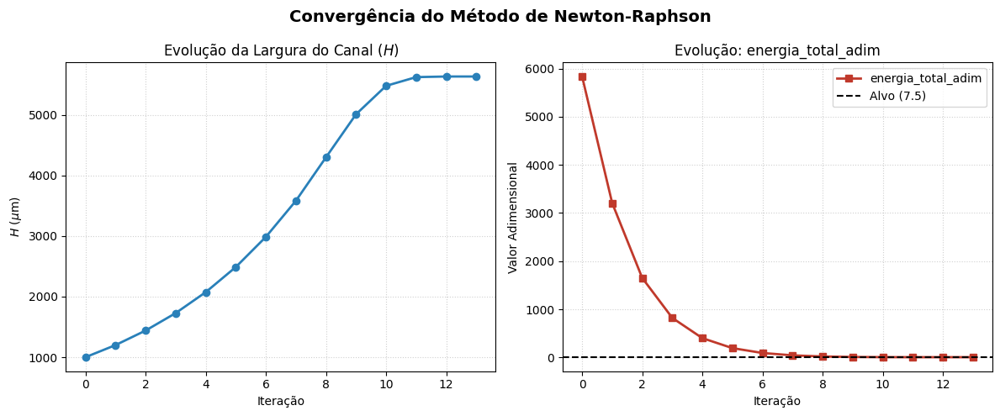

In [45]:
solver_p2 = P2_PARTE_3_GD.P2_3_GD(config_mh)
solver_p2.resolver_P2(E_target=7.5, H0=1000.0e-6, Tc=25.0);

## Uso de IA

A Inteligência Artificial foi utilizada ao longo do desenvolvimento do projeto principalmente para auxiliar/gerar funções de plotagem no matplotlib, de maneira que os nossos resultados ficassem mais apresentáveis. Também usamos para montar as apresentações. Links com exemplos de uso:

- https://claude.ai/share/a9103133-09b4-43b2-913c-9eb325974d8d
- https://claude.ai/share/5a54c6f8-9894-4d88-845a-d1f726ed51b9
- https://claude.ai/share/3fce0fdf-0634-4302-a869-90a6fd1a38ae

<a id="conclusao"></a>
## Conclusão

Ao longo deste relatório, os três subsistemas físicos (rede hidráulica, placa térmica e membrana elástica) foram formulados, discretizados e validados individualmente, apresentando comportamento numérico consistente com a teoria em todos os estudos de convergência de malha realizados. A extensão desses modelos para os acoplamentos hidráulico-térmico e hidráulico-mecânico mostrou que as interações entre os subsistemas produzem efeitos não triviais, como o adensamento da matriz de amortecimento equivalente e a propagação global de perturbações de pressão pela rede, evidenciando a importância de tratar o problema de forma integrada em vez de considerar cada física isoladamente.

A construção do gêmeo digital consolidou esses modelos em uma ferramenta capaz de simular o comportamento do sistema sob diferentes condições operacionais, e também de quantificar incertezas, aproximar respostas de interesse por interpolação e regressão, e orientar decisões de projeto por meio de análise de sensibilidade e otimização (como a busca do valor ótimo da largura $H$ dos microcanais sob restrição de energia). Em conjunto, os resultados demonstram que a metodologia adotada de decompor o sistema em subsistemas validados isoladamente e depois acoplá-los progressivamente é eficaz tanto para a compreensão física do problema quanto para a construção de um modelo computacional robusto e reutilizável para fins de projeto e tomada de decisão.
